# benchmarking on omnipath


In [1]:
from scprint import scPrint
from scprint.tasks import GRNfer

from bengrn import BenGRN
import scanpy as sc

from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils

%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

💡 connected lamindb: jkobject/scprint


2024-05-22 13:15:44,447:INFO - Downloading data from `https://omnipathdb.org/queries/enzsub?format=json`
2024-05-22 13:15:44,550:INFO - Downloading data from `https://omnipathdb.org/queries/interactions?format=json`
2024-05-22 13:15:44,641:INFO - Downloading data from `https://omnipathdb.org/queries/complexes?format=json`
2024-05-22 13:15:44,735:INFO - Downloading data from `https://omnipathdb.org/queries/annotations?format=json`
2024-05-22 13:15:44,828:INFO - Downloading data from `https://omnipathdb.org/queries/intercell?format=json`
2024-05-22 13:15:45,074:INFO - Downloading data from `https://omnipathdb.org/about?format=text`
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/chex/_src/pytypes.py:53: DeprecationWarning: jax.core.Shape is deprecated. Use Shape = Sequence[int | Any].
  Shape = jax.core

In [5]:
model = scPrint.load_from_checkpoint(
    '../data/temp/vbd8bavn/epoch=17-step=90000.ckpt', precpt_gene_emb=None)
NUM_GENES = 4000

RuntimeError caught: scPrint is not attached to a `Trainer`.



In [3]:
CELLTYPES = [
    'kidney distal convoluted tubule epithelial cell',
    'kidney loop of Henle thick ascending limb epithelial cell',
    'kidney collecting duct principal cell',
    'mesangial cell',
    'blood vessel smooth muscle cell',
    'podocyte',
    'macrophage',
    'leukocyte',
    'kidney interstitial fibroblast',
    'endothelial cell'
]

In [4]:
adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/yBCKp6HmXuHa0cZptMo7.h5ad')
adata.var["isTF"] = False
adata.var.loc[adata.var.symbol.isin(grnutils.TF), "isTF"] = True
adata

AnnData object with n_obs × n_vars = 15728 × 70116
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 'leide

View of AnnData object with n_obs × n_vars = 1024 × 3863
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


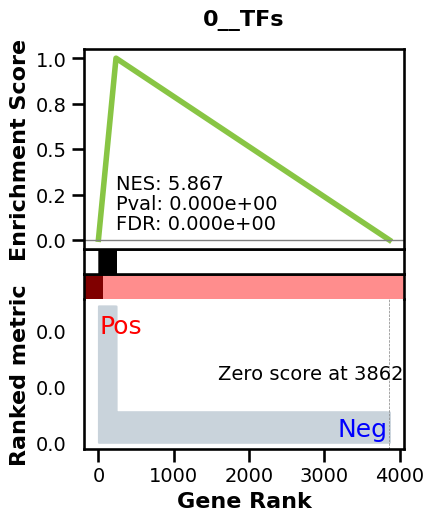

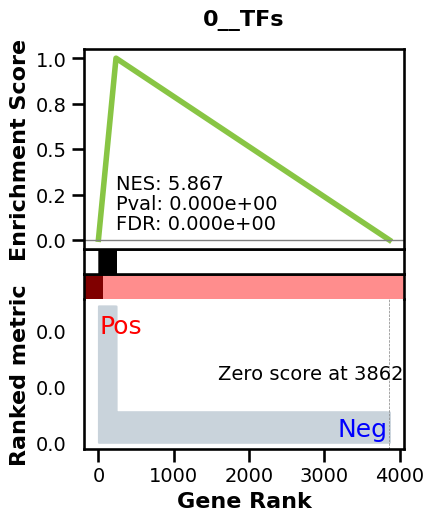

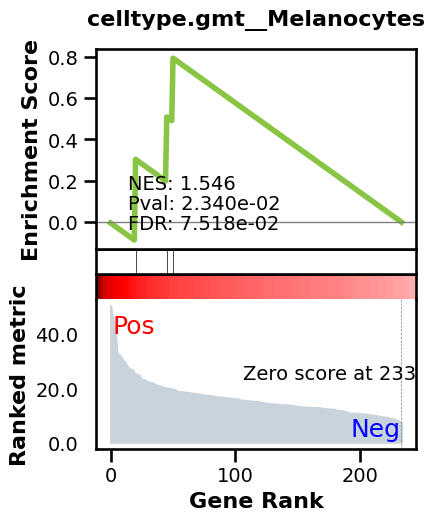

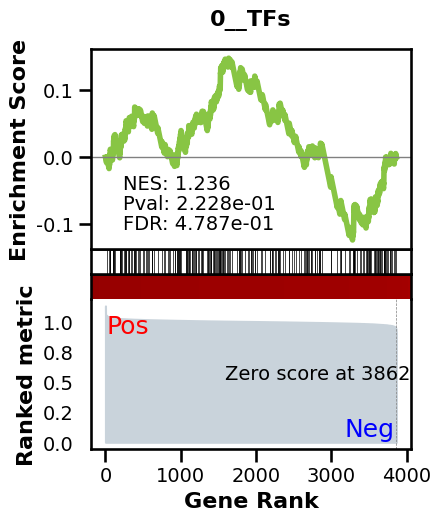

_________________________________________
TF specific enrichment


2024-05-20 21:15:03,958:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:15:03,969:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:15:04,209:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  3.4482758620689653 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2767 genes
intersection pct: 0.7162826818534818
precision:  0.005834504883805441 
recall:  0.354048335003898 
random precision: 0.0011731853648555529


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 47%|████▋     | 47/99 [00:00<00:00, 66.89it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 51.40it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0046105804448696285
EPR: 6.734187825289418


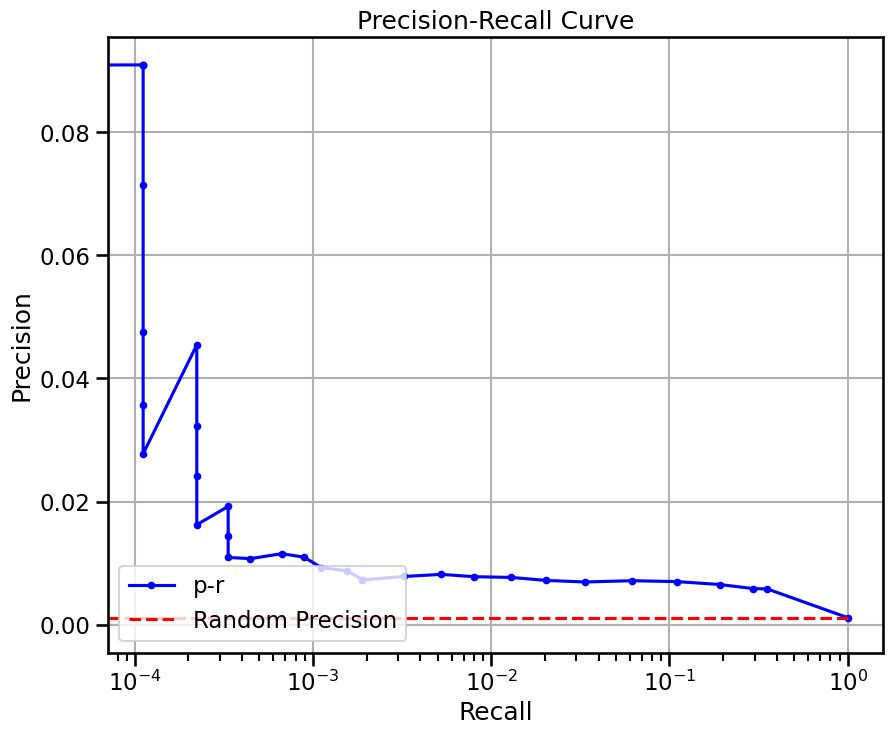

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 199.13 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


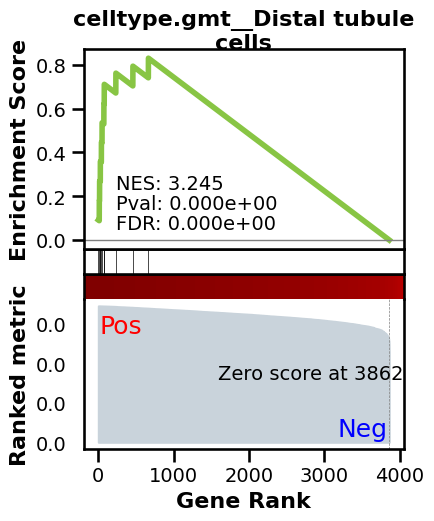

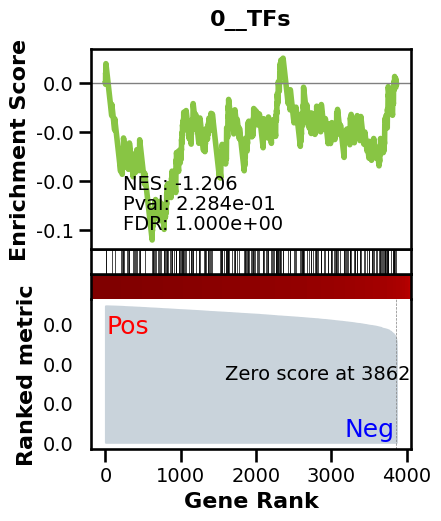

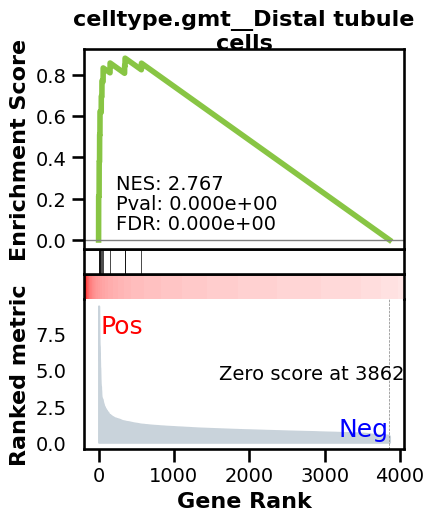

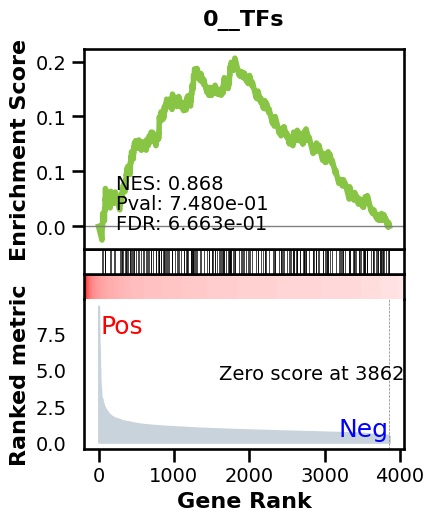

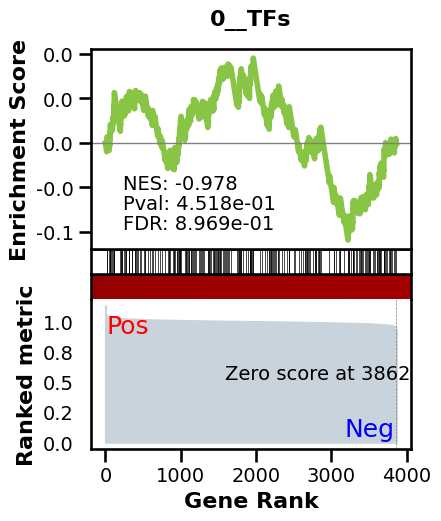

_________________________________________
TF specific enrichment


2024-05-20 21:19:15,708:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:19:15,710:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:19:15,914:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2767 genes
intersection pct: 0.7162826818534818
precision:  0.001203724725811986 
recall:  0.8313843412406727 
random precision: 0.0011731853648555529


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 46%|████▋     | 46/99 [00:00<00:00, 72.22it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 71.54it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0011580710736183329
EPR: 1.616148006403192


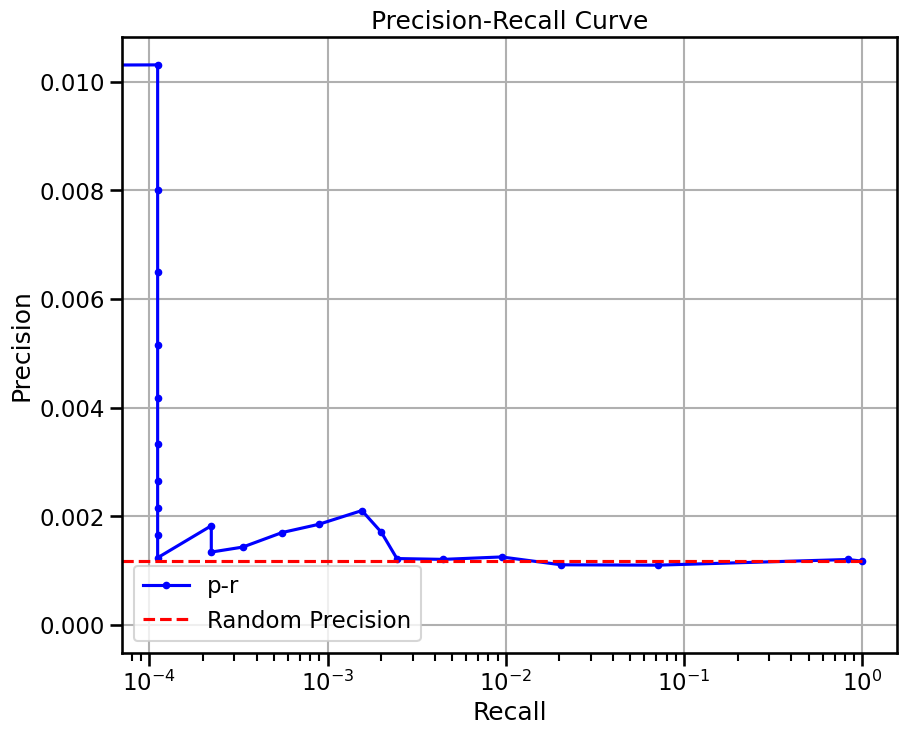

View of AnnData object with n_obs × n_vars = 388 × 3822
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


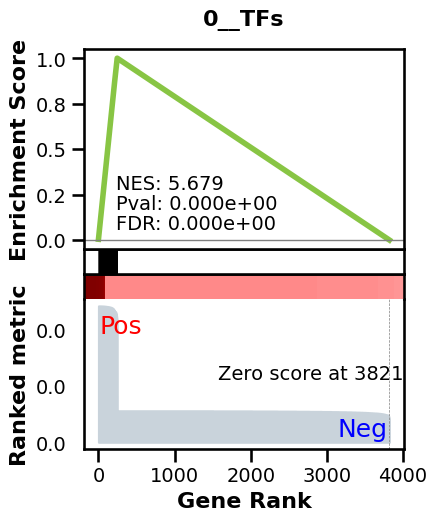

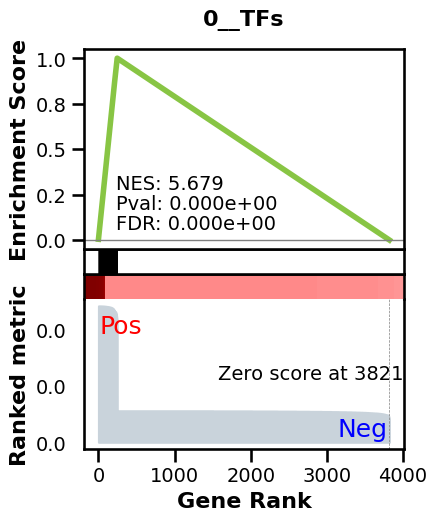

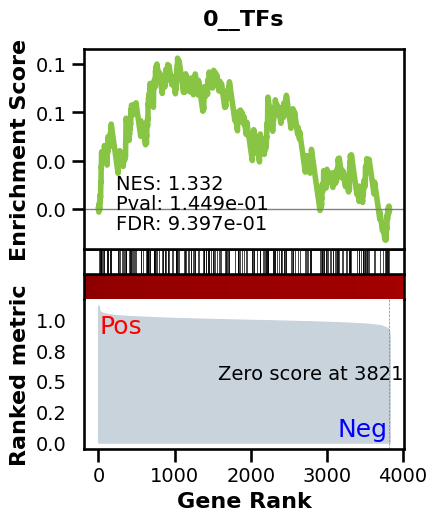

_________________________________________
TF specific enrichment


2024-05-20 21:20:24,009:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:20:24,011:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:20:24,215:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  6.0606060606060606 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2710 genes
intersection pct: 0.7090528519099948
precision:  0.007076696180766381 
recall:  0.45849486887115165 
random precision: 0.0011945966635746091


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 46%|████▋     | 46/99 [00:00<00:00, 75.92it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 75.26it/s]


Area Under Precision-Recall Curve (AUPRC):  0.005318886012794264
EPR: 4.232181741646476


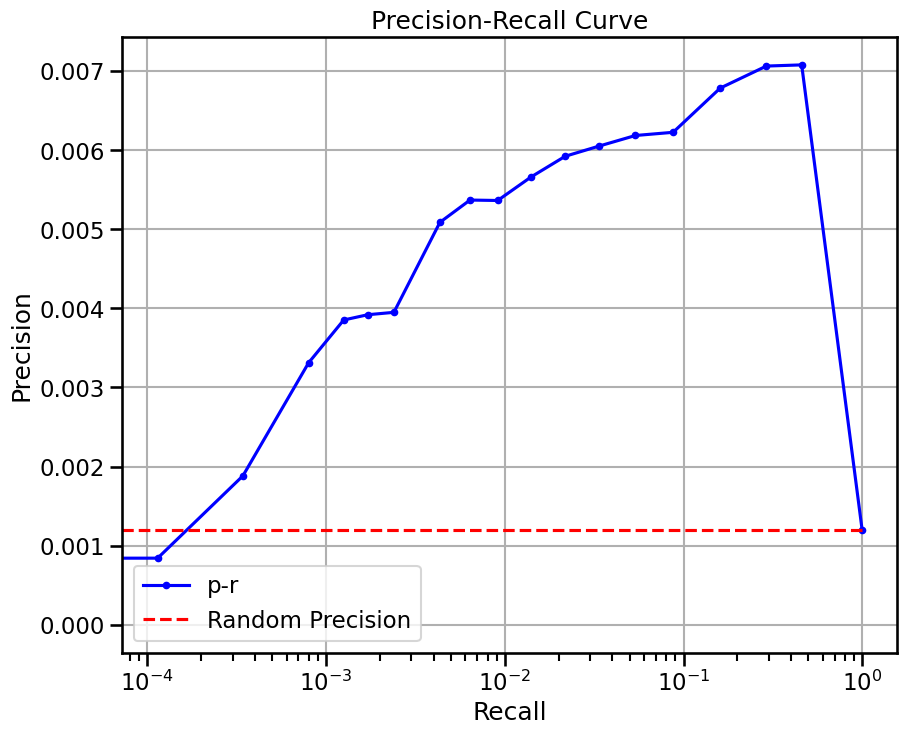

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 55.51 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


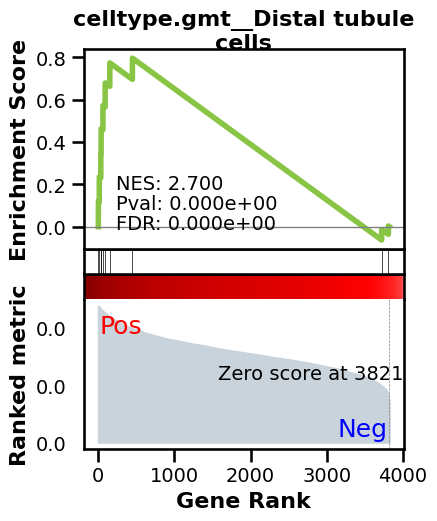

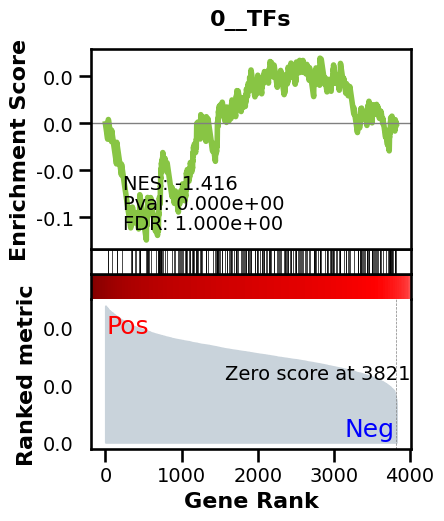

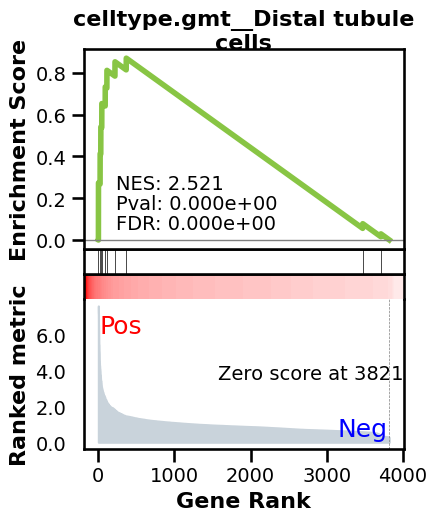

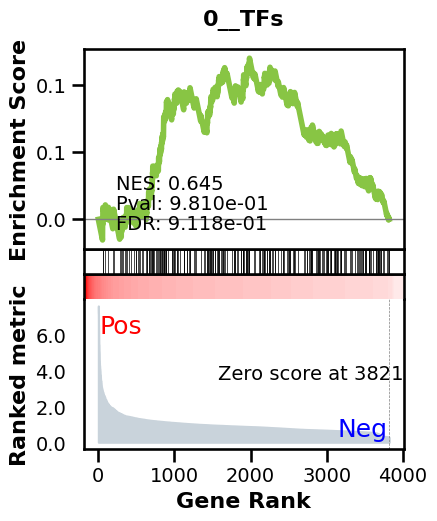

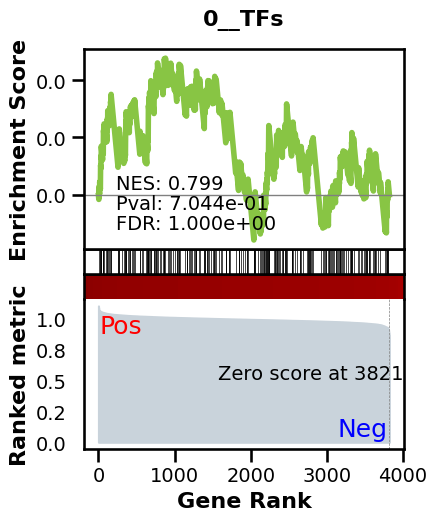

_________________________________________
TF specific enrichment


2024-05-20 21:22:03,970:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:22:03,972:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:22:04,194:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  12.121212121212121 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2710 genes
intersection pct: 0.7090528519099948
precision:  0.0012406084607128316 
recall:  0.47776510832383123 
random precision: 0.0011945966635746091


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 46%|████▋     | 46/99 [00:00<00:00, 76.34it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 75.73it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001185279779274387
EPR: 0.5721189189166669


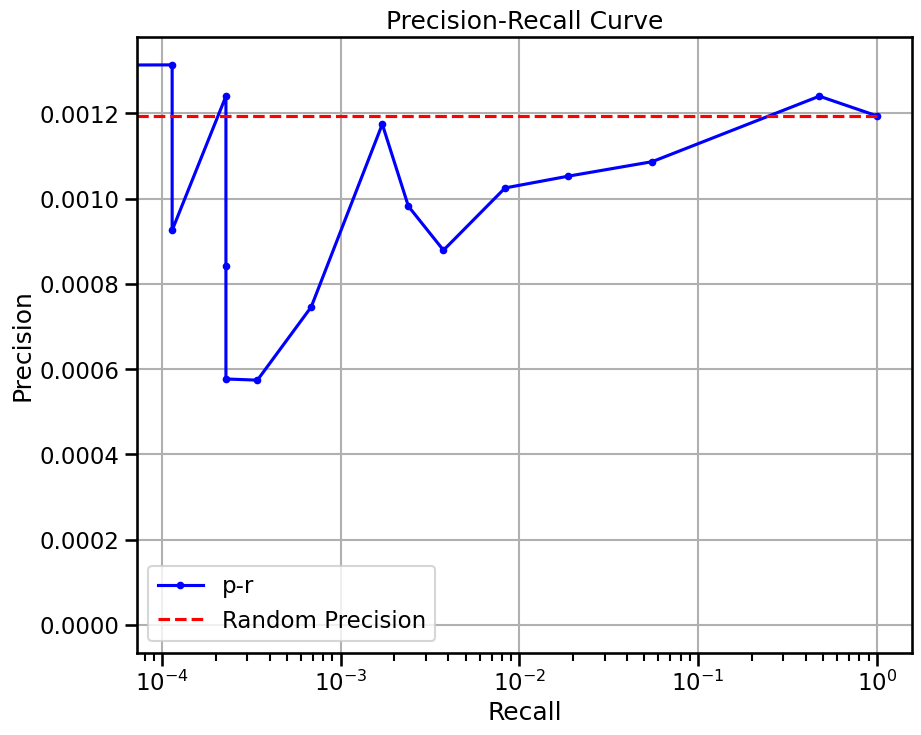

View of AnnData object with n_obs × n_vars = 455 × 3892
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


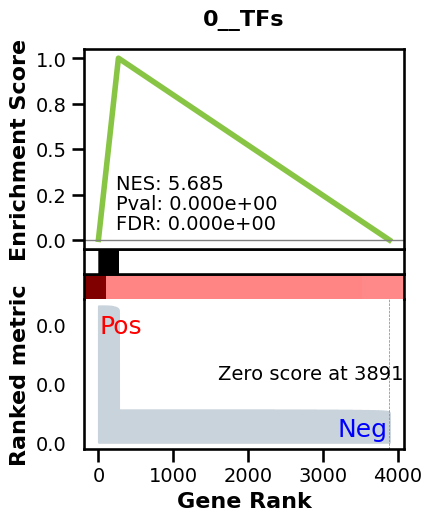

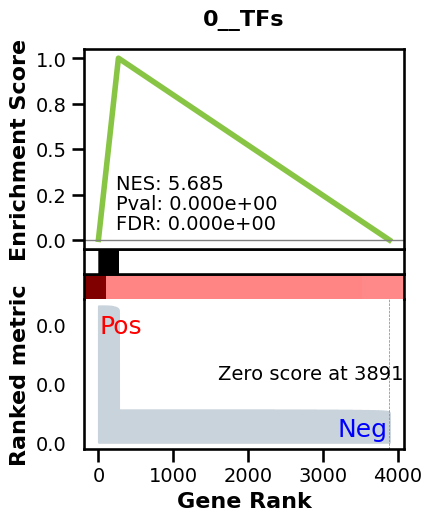

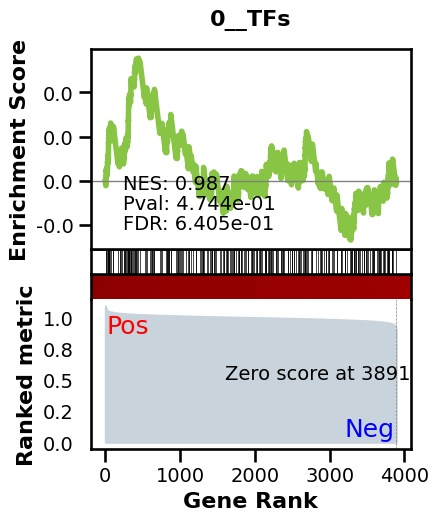

_________________________________________
TF specific enrichment


2024-05-20 21:23:20,016:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:23:20,018:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:23:20,218:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  4.838709677419355 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2829 genes
intersection pct: 0.7268756423432683
precision:  0.008604938196910753 
recall:  0.46068507571463274 
random precision: 0.0015435455074063686


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 45%|████▌     | 45/99 [00:00<00:00, 70.15it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 69.65it/s]


Area Under Precision-Recall Curve (AUPRC):  0.008062103892080511
EPR: 11.590854038883057


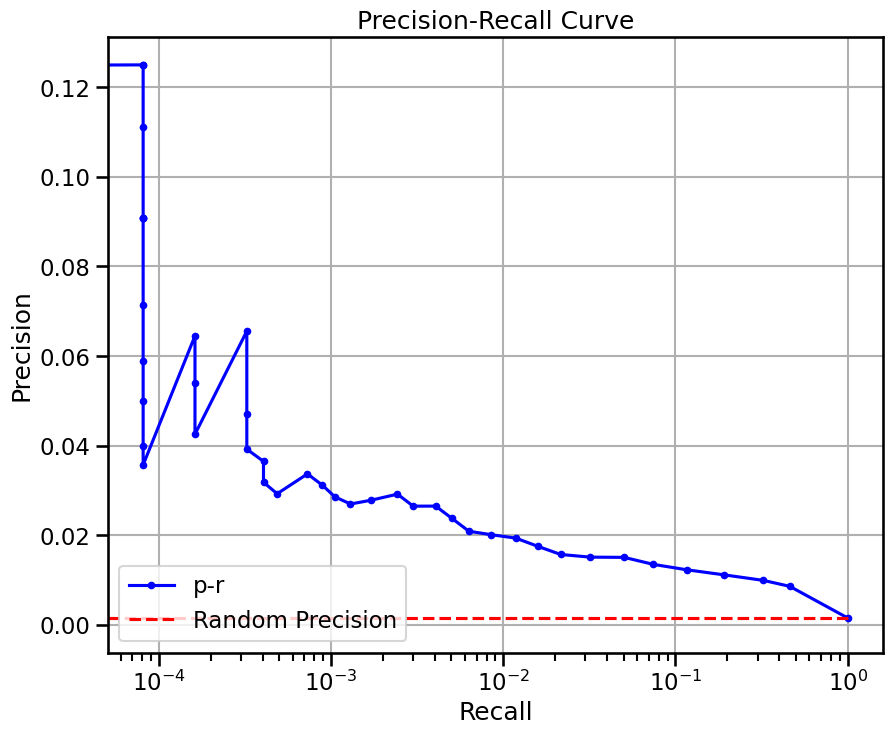

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 75.00 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


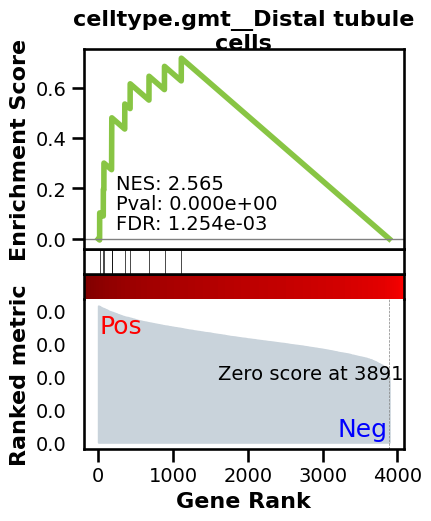

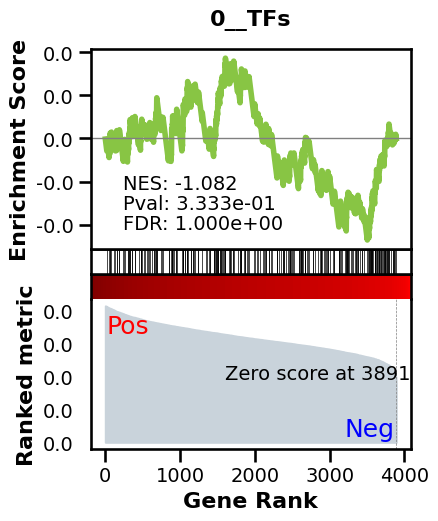

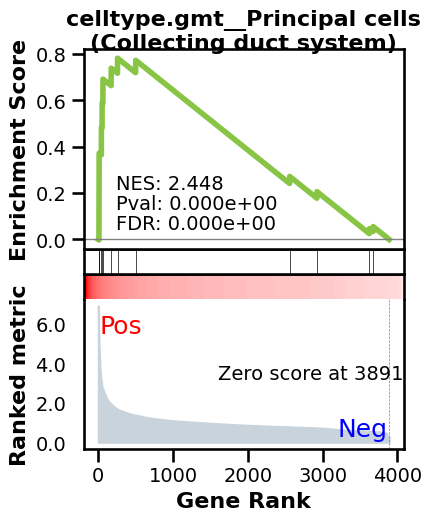

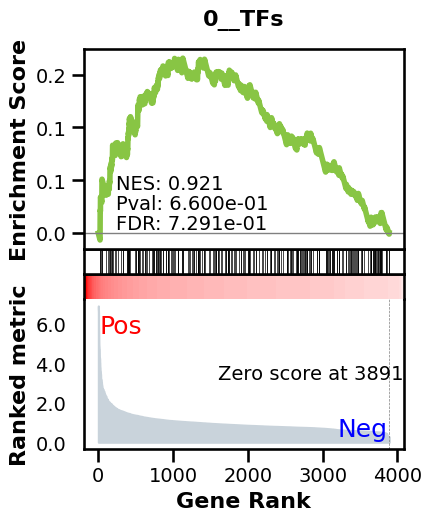

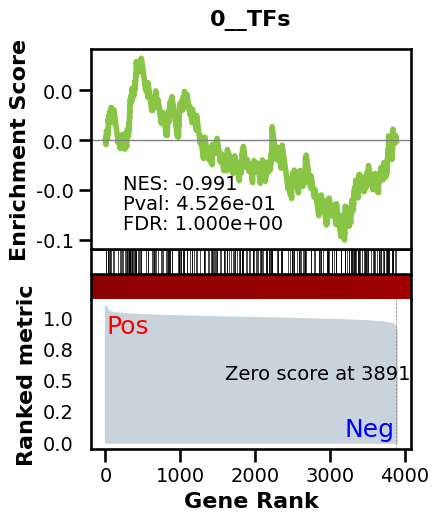

_________________________________________
TF specific enrichment


2024-05-20 21:25:30,011:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:25:30,013:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:25:30,207:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  1.6129032258064515 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2829 genes
intersection pct: 0.7268756423432683
precision:  0.001687445256959026 
recall:  0.618106729289821 
random precision: 0.0015435455074063686


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 48%|████▊     | 48/99 [00:01<00:01, 38.89it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:02<00:00, 39.90it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0016666515932685685
EPR: 2.0526750193518244


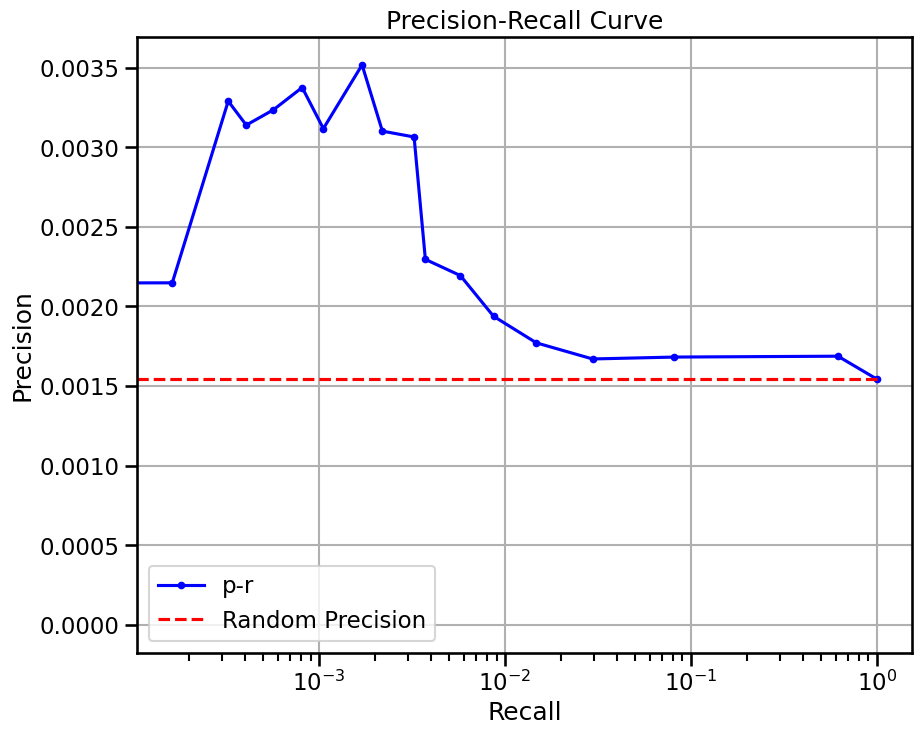

View of AnnData object with n_obs × n_vars = 10 × 3698
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 'l

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


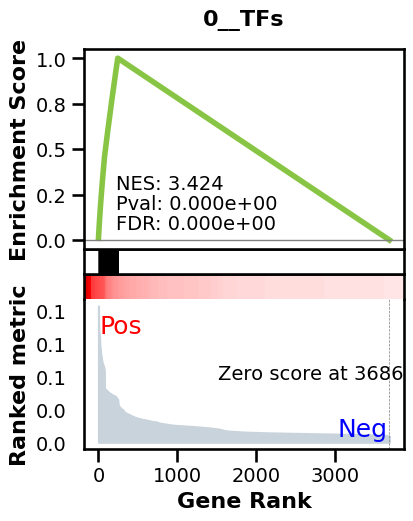

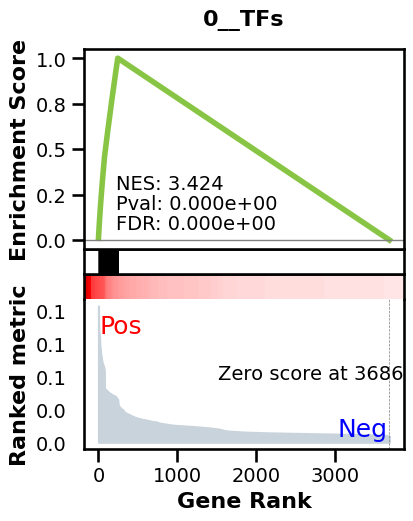

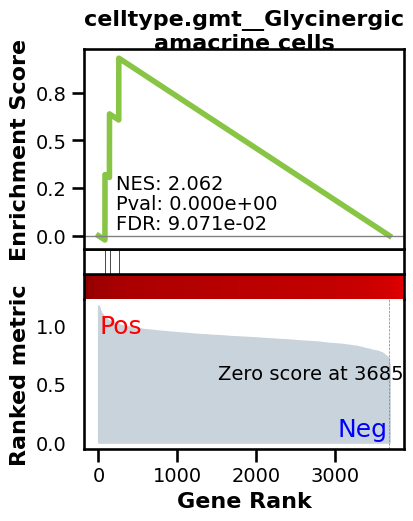

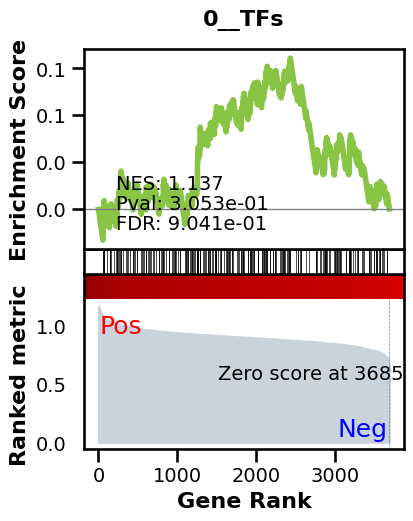

_________________________________________
TF specific enrichment


2024-05-20 21:26:29,225:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:26:29,227:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:26:29,446:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.380952380952381 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2670 genes
intersection pct: 0.7235772357723578
precision:  0.01083901192504259 
recall:  0.17525536554573626 
random precision: 0.0012226661221992553


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 47%|████▋     | 47/99 [00:00<00:00, 76.86it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 77.13it/s]


Area Under Precision-Recall Curve (AUPRC):  0.006797037804459241
EPR: 7.9224245504310735


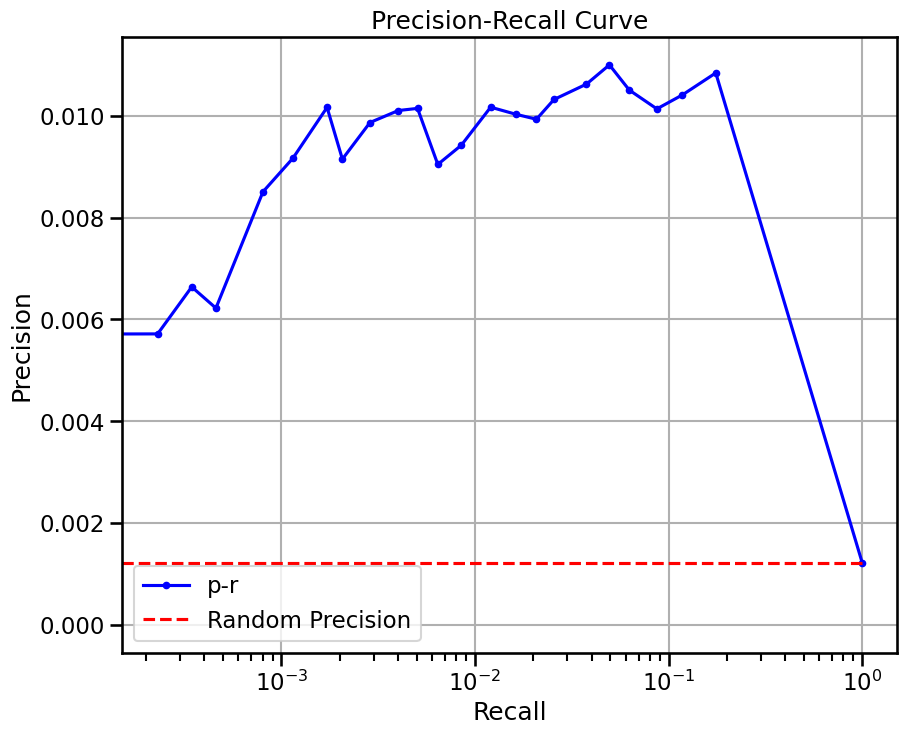

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 20.65 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


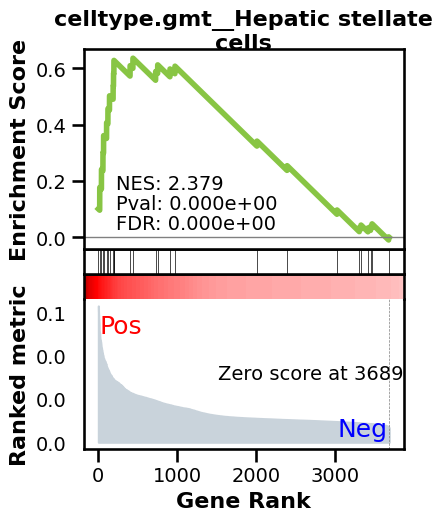

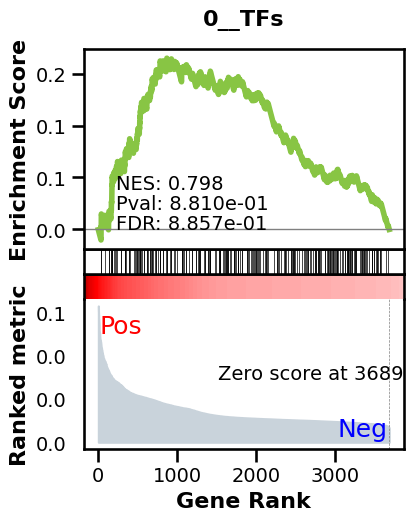

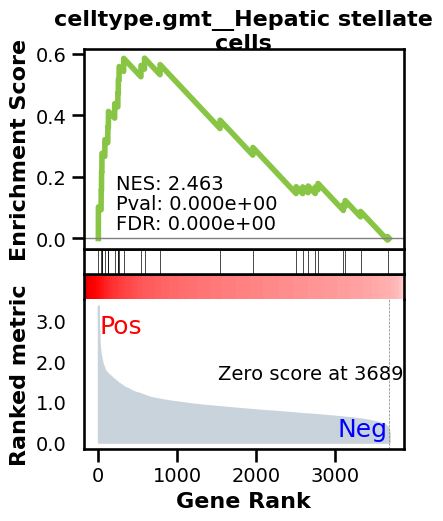

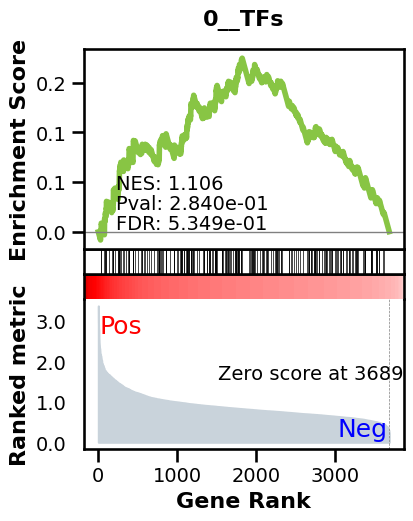

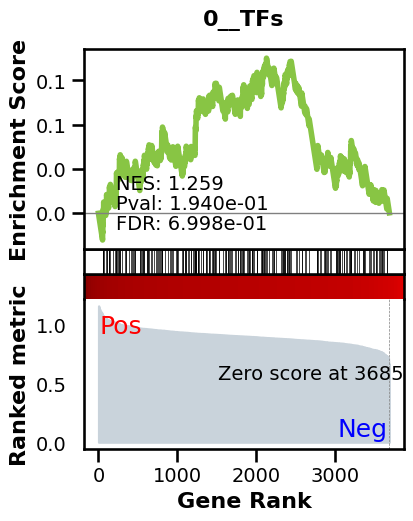

_________________________________________
TF specific enrichment


2024-05-20 21:27:19,753:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:27:19,755:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:27:19,985:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2670 genes
intersection pct: 0.7235772357723578
precision:  0.0018071008433137269 
recall:  0.035119935728222196 
random precision: 0.0012226661221992553


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 42%|████▏     | 42/99 [00:00<00:00, 78.67it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 77.09it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0015209489625846208
EPR: 1.4094507629640387


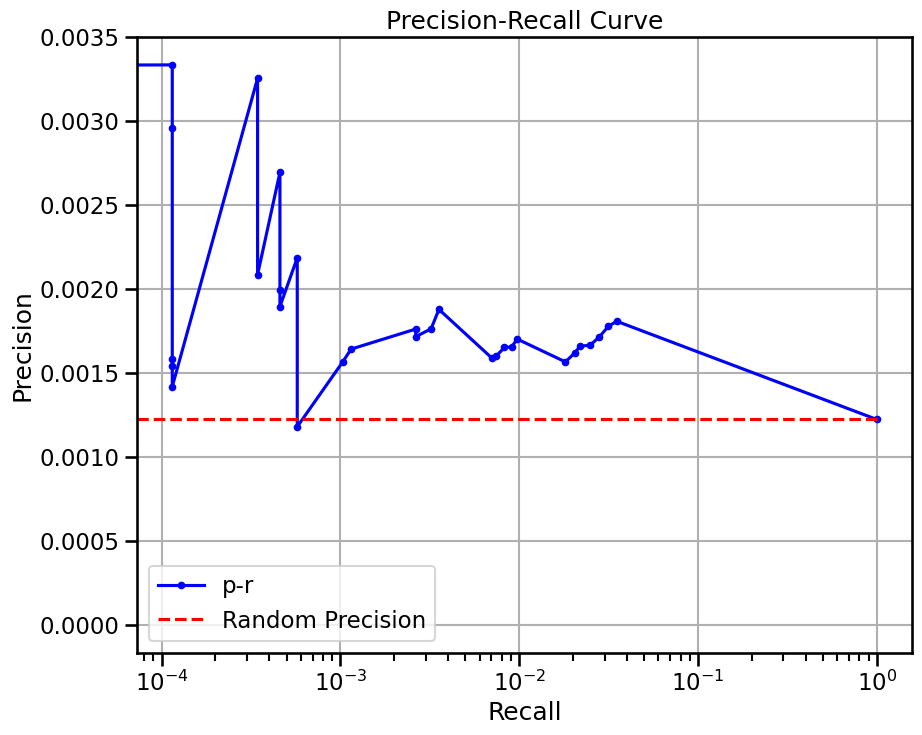

View of AnnData object with n_obs × n_vars = 462 × 3686
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


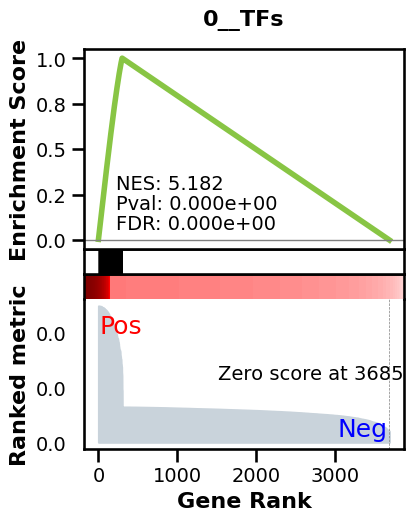

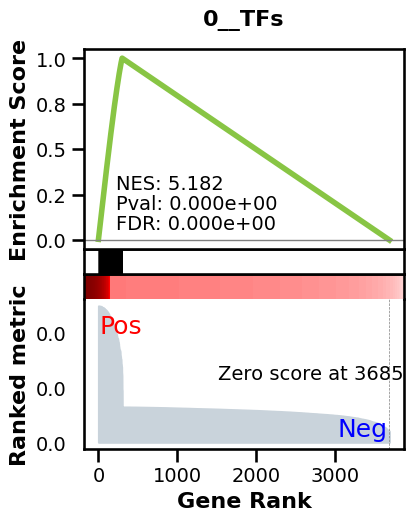

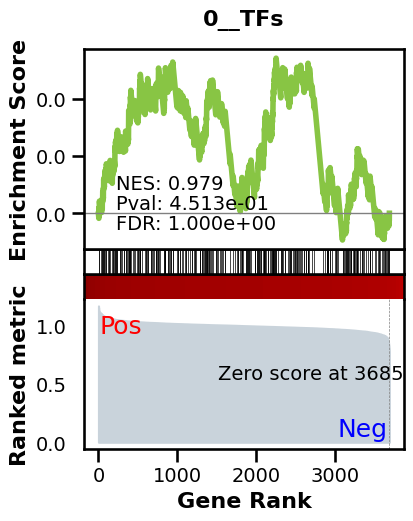

_________________________________________
TF specific enrichment


2024-05-20 21:28:28,963:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:28:28,965:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:28:29,165:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.0833333333333335 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2707 genes
intersection pct: 0.7344004340748779
precision:  0.008062814378603853 
recall:  0.41444547212646093 
random precision: 0.0016235862731398246


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 47%|████▋     | 47/99 [00:00<00:00, 74.65it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 74.27it/s]


Area Under Precision-Recall Curve (AUPRC):  0.007523169620039509
EPR: 9.415179250512965


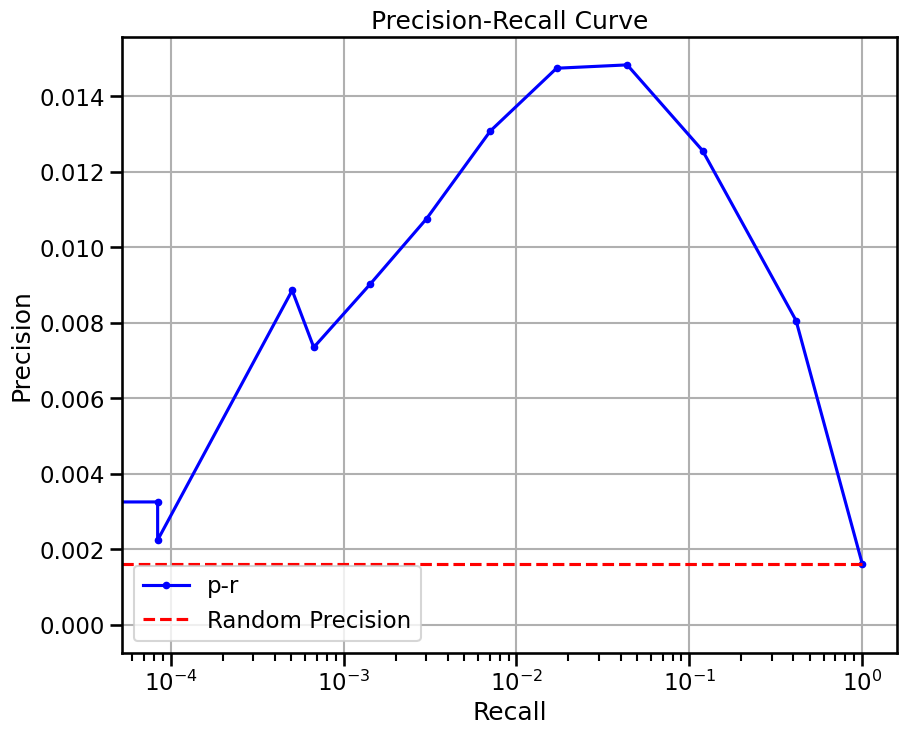

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 47.26 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


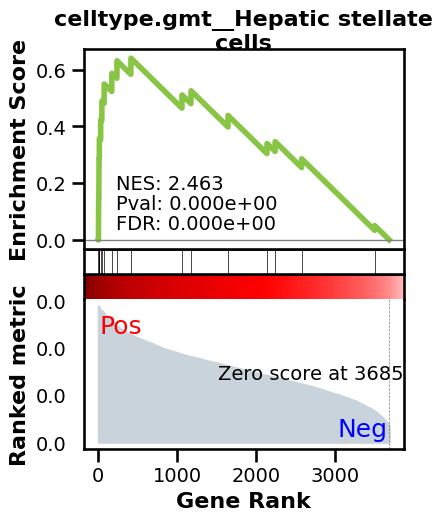

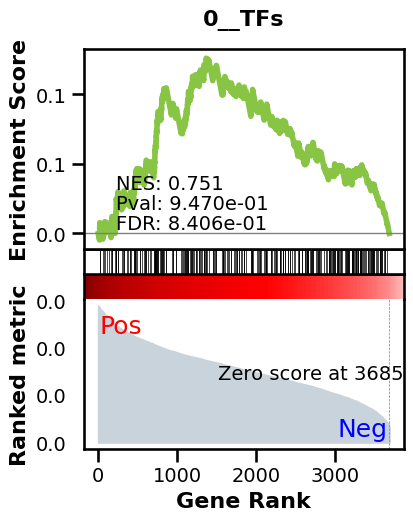

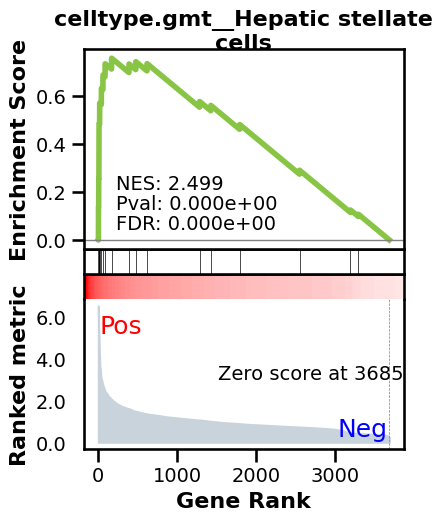

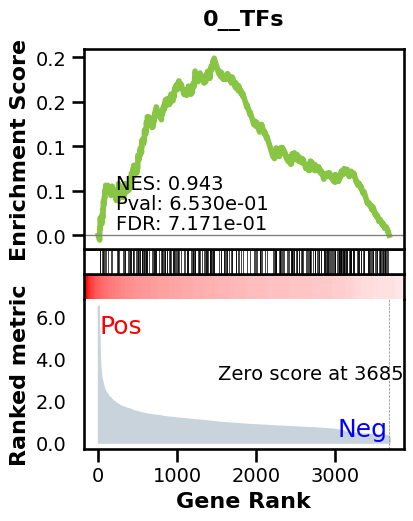

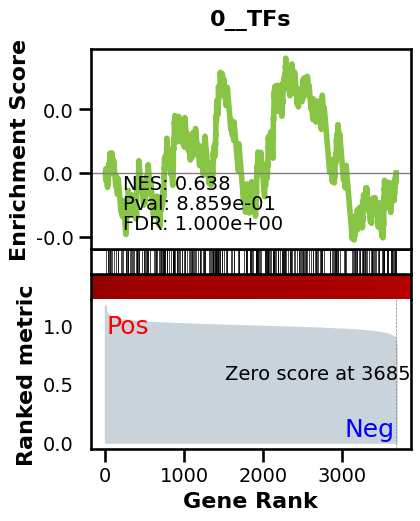

_________________________________________
TF specific enrichment


2024-05-20 21:29:59,781:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:29:59,783:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:30:00,017:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2707 genes
intersection pct: 0.7344004340748779
precision:  0.0021571989601194756 
recall:  0.45909358446144793 
random precision: 0.0016235862731398246


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 46%|████▋     | 46/99 [00:00<00:00, 74.48it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 74.32it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0019479575873193604
EPR: 1.295955069010435


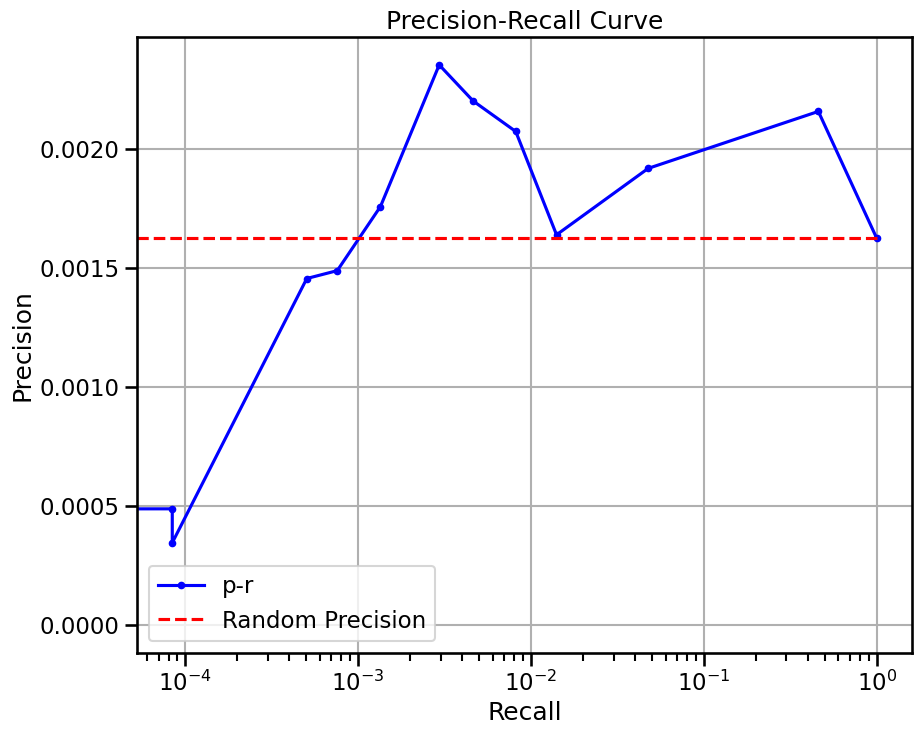

View of AnnData object with n_obs × n_vars = 518 × 3907
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


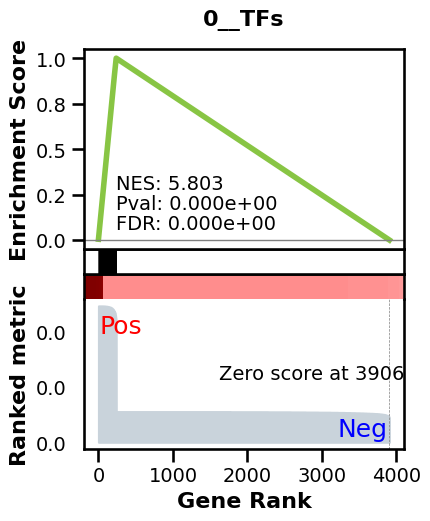

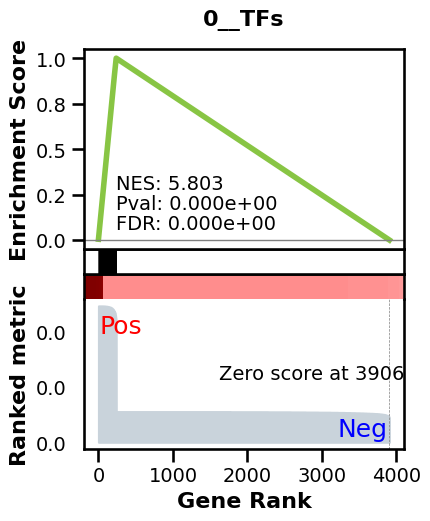

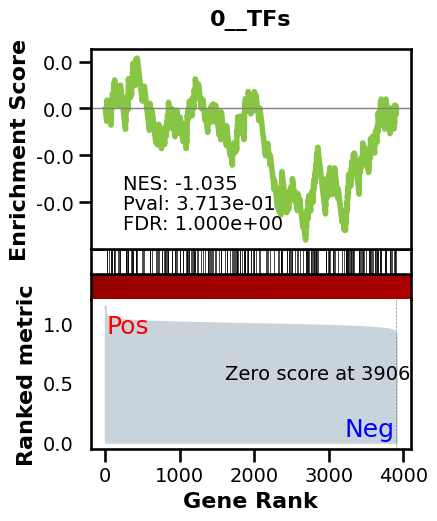

_________________________________________
TF specific enrichment


2024-05-20 21:31:17,734:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:31:17,737:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:31:17,938:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  5.405405405405405 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2860 genes
intersection pct: 0.7320194522651651
precision:  0.008283988474450818 
recall:  0.40721188987249246 
random precision: 0.0015058568573783685


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:00<00:00, 66.49it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 66.07it/s]


Area Under Precision-Recall Curve (AUPRC):  0.006540379070906276
EPR: 6.133429522885058


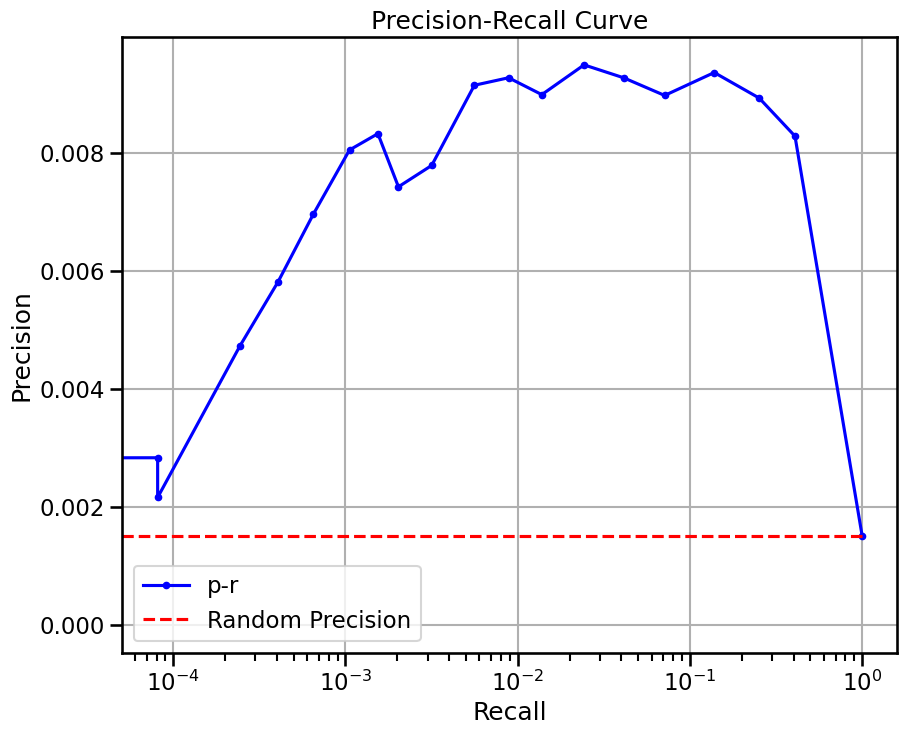

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 76.48 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


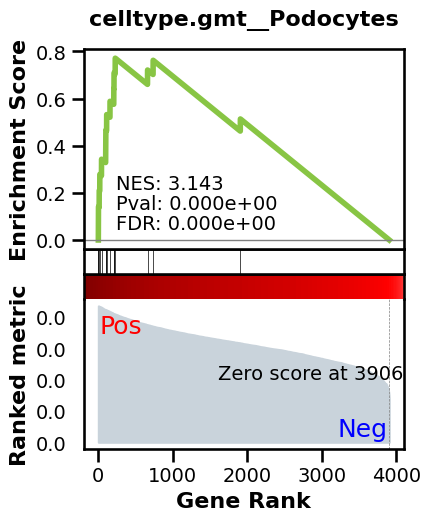

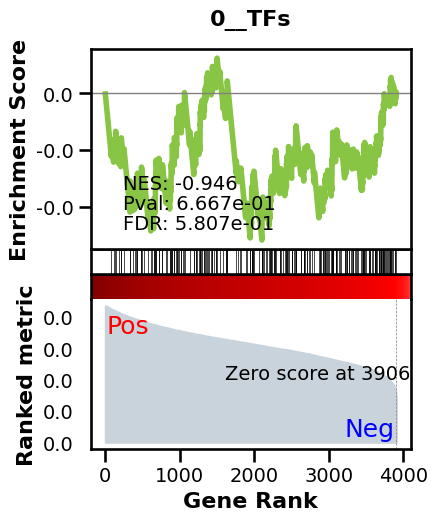

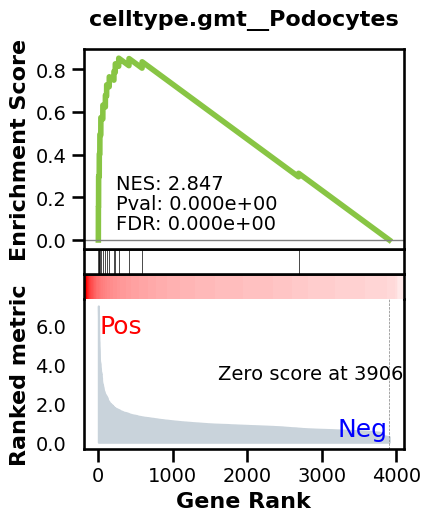

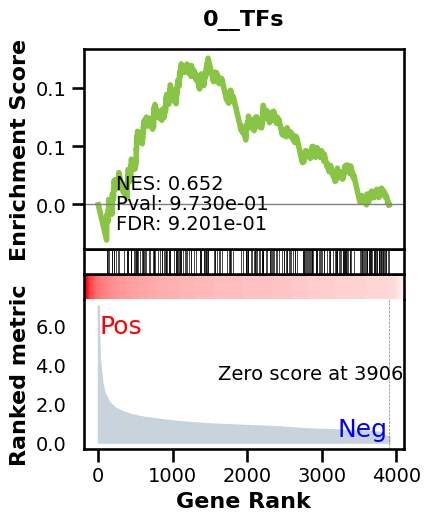

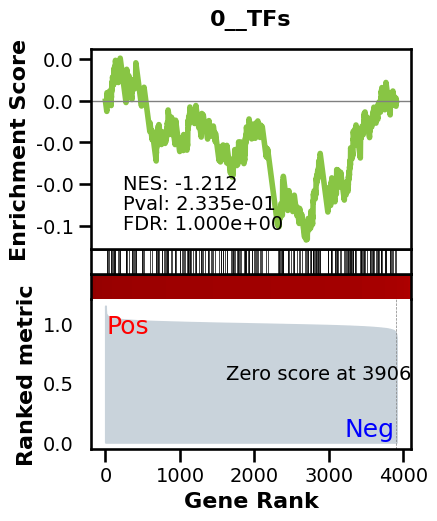

_________________________________________
TF specific enrichment


2024-05-20 21:33:24,583:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:33:24,585:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:33:24,781:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  2.7027027027027026 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2860 genes
intersection pct: 0.7320194522651651
precision:  0.0016446533966954727 
recall:  0.5686672622431577 
random precision: 0.0015058568573783685


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 48%|████▊     | 48/99 [00:00<00:00, 67.72it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 67.08it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001570092744899752
EPR: 0.7545003103518696


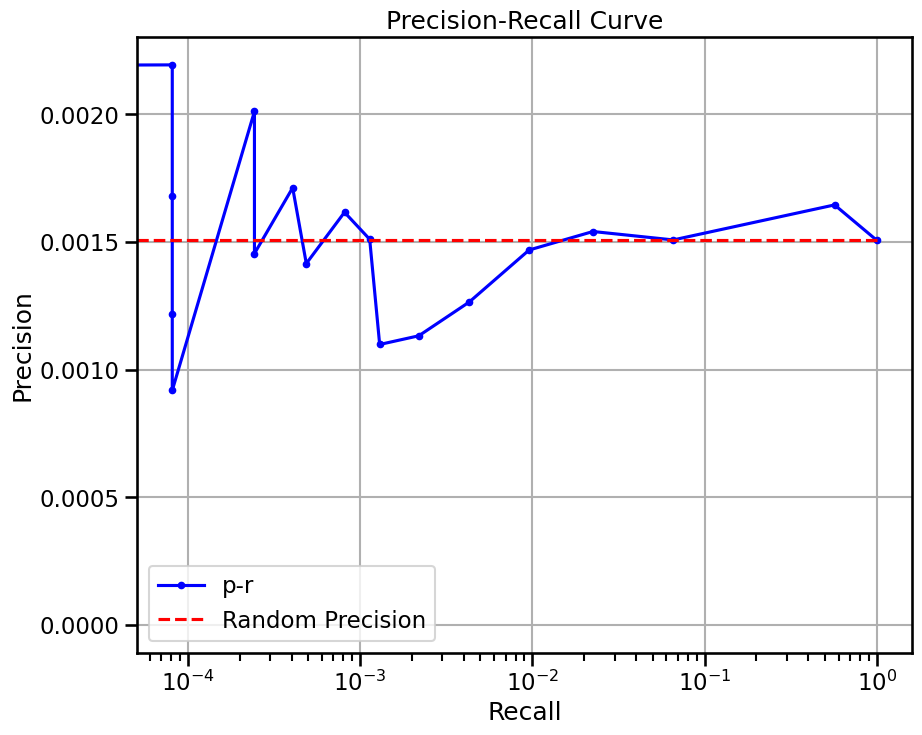

View of AnnData object with n_obs × n_vars = 88 × 3517
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 'l

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


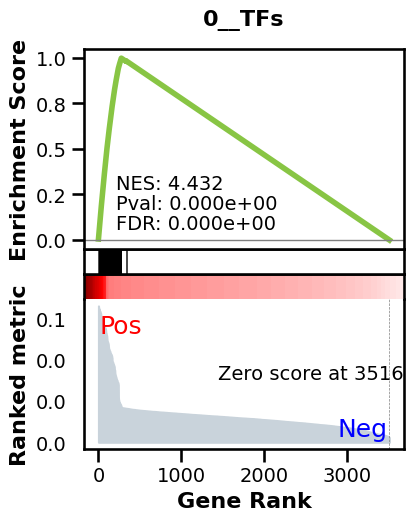

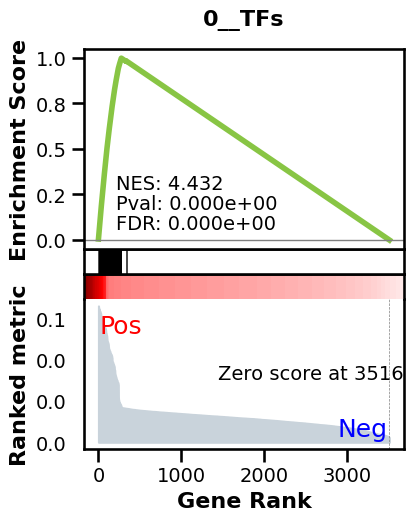

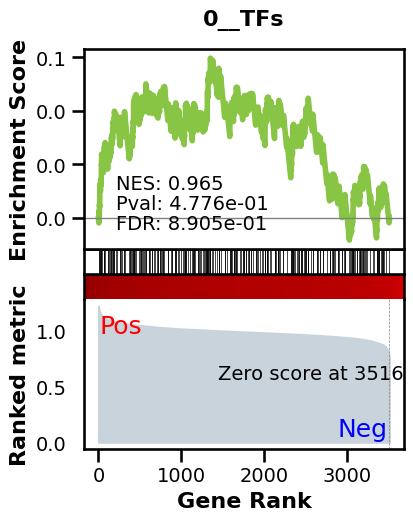

_________________________________________
TF specific enrichment


2024-05-20 21:34:21,520:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:34:21,522:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:34:21,758:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2542 genes
intersection pct: 0.7227750924083025
precision:  0.010454301506592378 
recall:  0.3672497570456754 
random precision: 0.0015930711159950841


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 43%|████▎     | 43/99 [00:00<00:00, 85.46it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 85.30it/s]


Area Under Precision-Recall Curve (AUPRC):  0.008160286862128604
EPR: 7.02491048463808


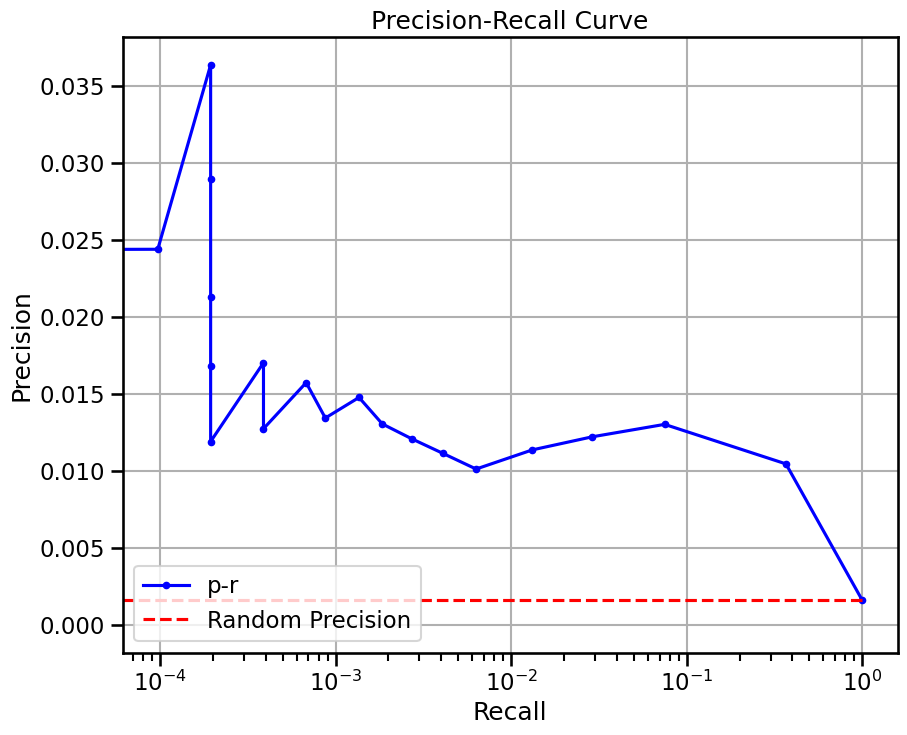

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 22.07 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


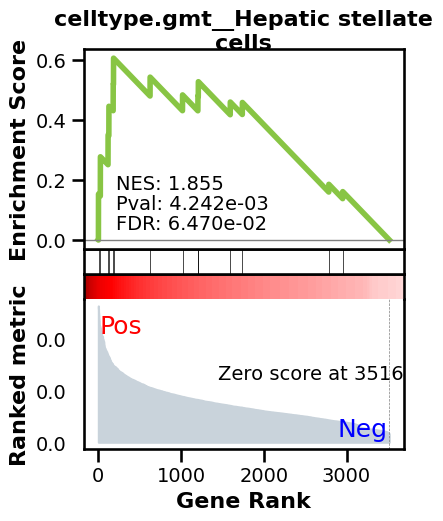

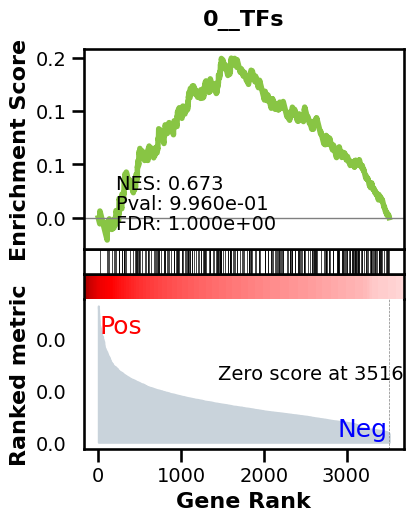

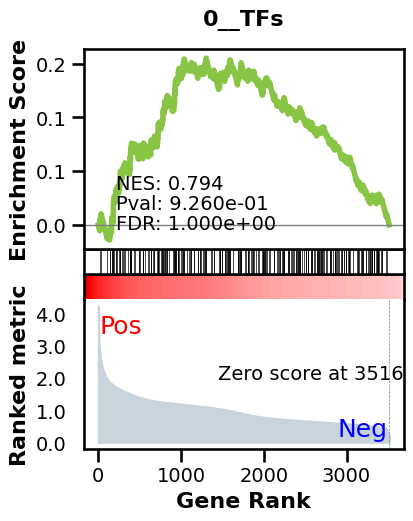

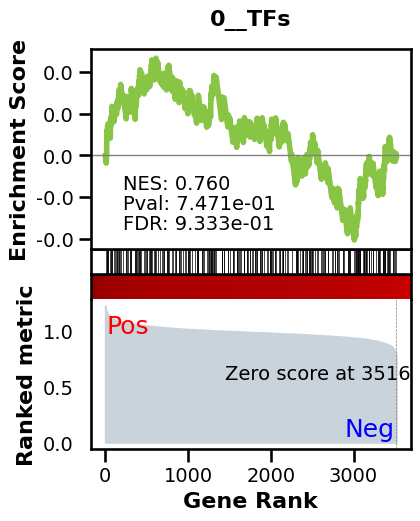

_________________________________________
TF specific enrichment


2024-05-20 21:35:14,376:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:35:14,378:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:35:14,574:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2542 genes
intersection pct: 0.7227750924083025
precision:  0.002115180543207044 
recall:  0.14334305150631682 
random precision: 0.0015930711159950841


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 44%|████▍     | 44/99 [00:00<00:00, 86.15it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 85.81it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0018796601566981486
EPR: 1.8964788486627957


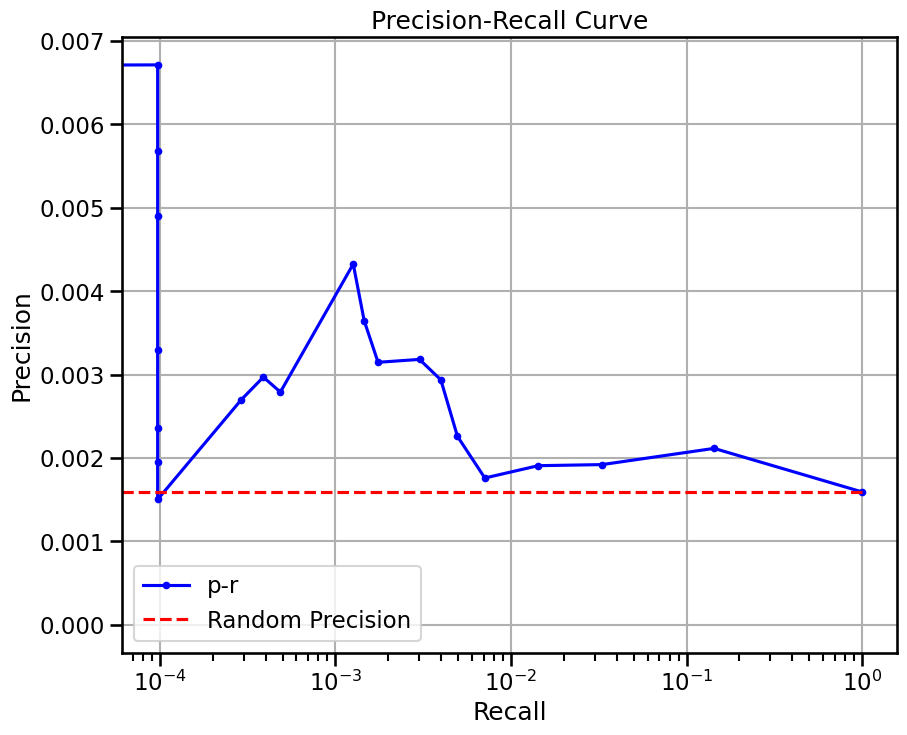

View of AnnData object with n_obs × n_vars = 996 × 2552
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


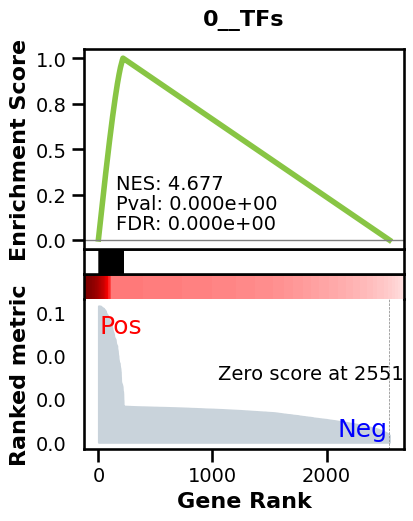

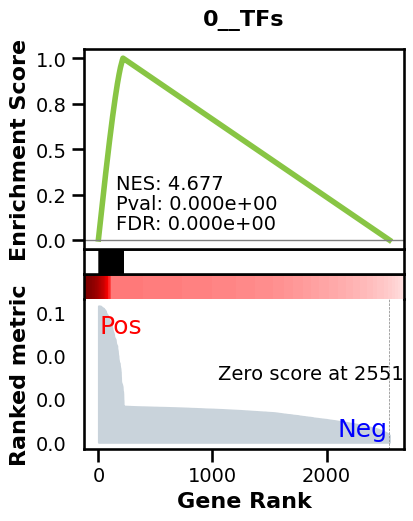

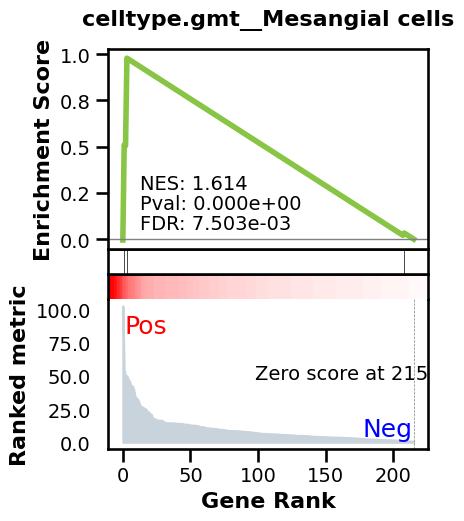

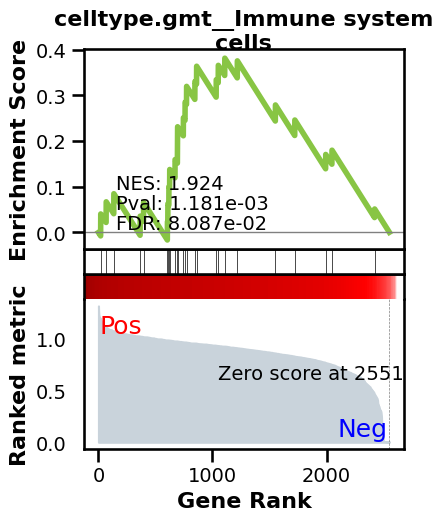

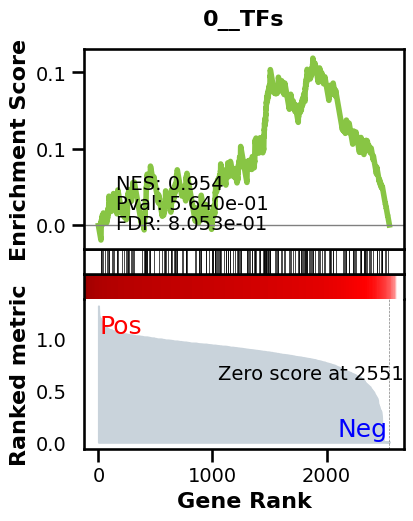

_________________________________________
TF specific enrichment


2024-05-20 21:36:09,356:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:36:09,358:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:36:09,561:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 1721 genes
intersection pct: 0.674373040752351
precision:  0.008150939587153648 
recall:  0.4344317417619368 
random precision: 0.001507033498641947


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 31%|███▏      | 31/99 [00:00<00:00, 158.59it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 182.66it/s]


Area Under Precision-Recall Curve (AUPRC):  0.00872721011737598
EPR: 12.940078229977468


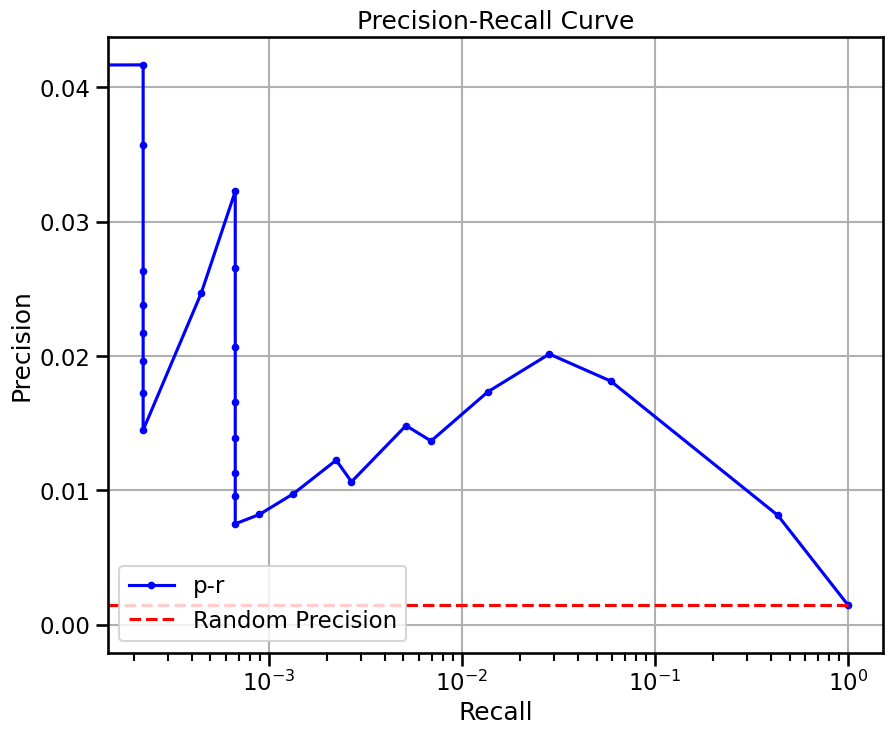

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 32.48 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


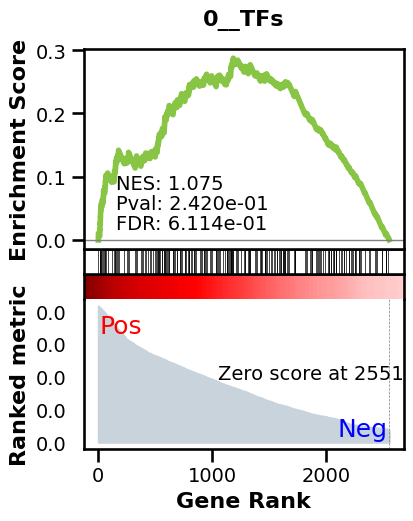

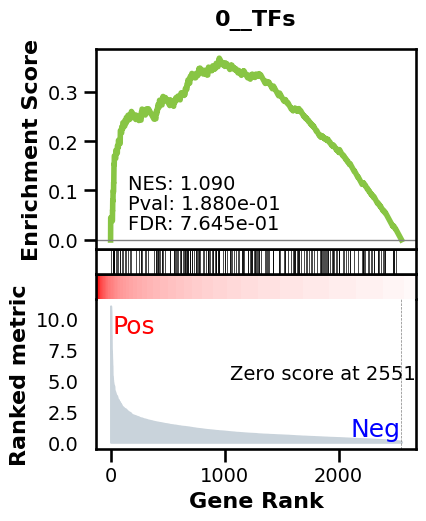

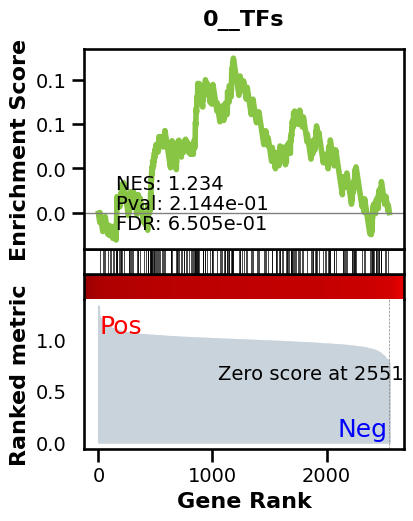

_________________________________________
TF specific enrichment


2024-05-20 21:37:04,300:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:37:04,303:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:37:04,511:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  5.2631578947368425 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 1721 genes
intersection pct: 0.674373040752351
precision:  0.001986288204011021 
recall:  0.29881192557722486 
random precision: 0.001507033498641947


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 35%|███▌      | 35/99 [00:00<00:00, 176.10it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 187.85it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0019060537773179544
EPR: 0.8921853023312059


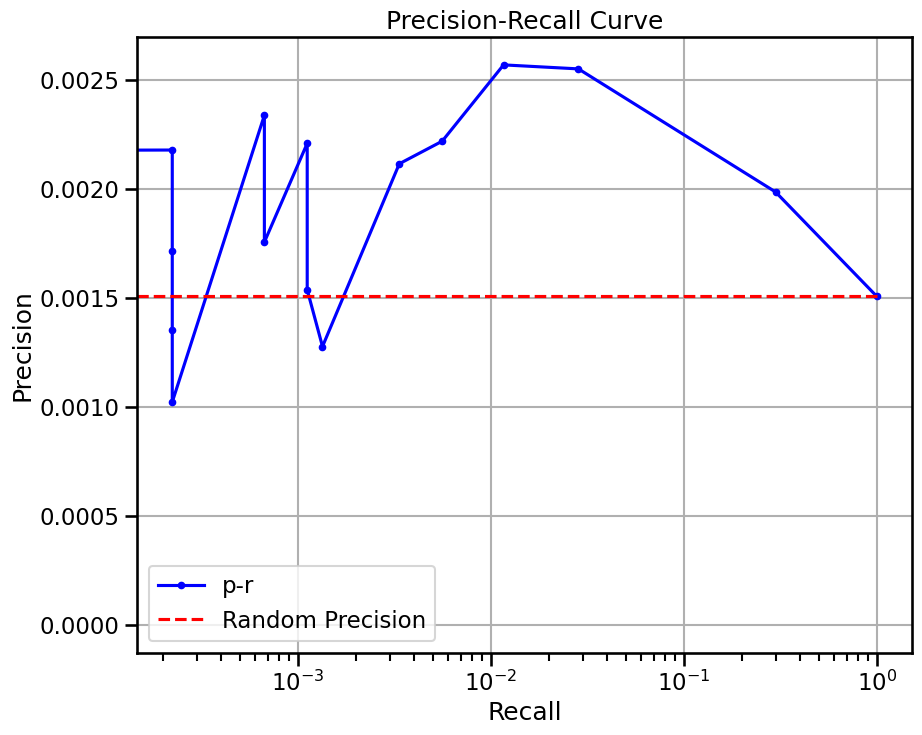

View of AnnData object with n_obs × n_vars = 468 × 3241
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', '

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


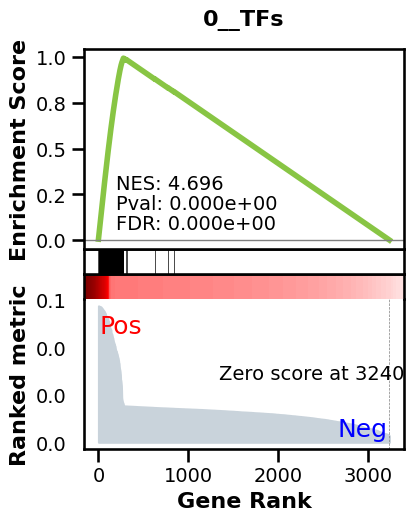

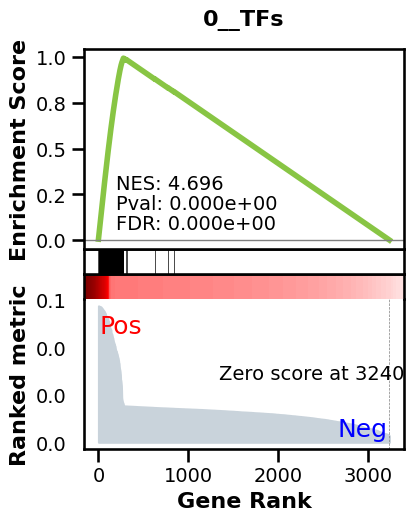

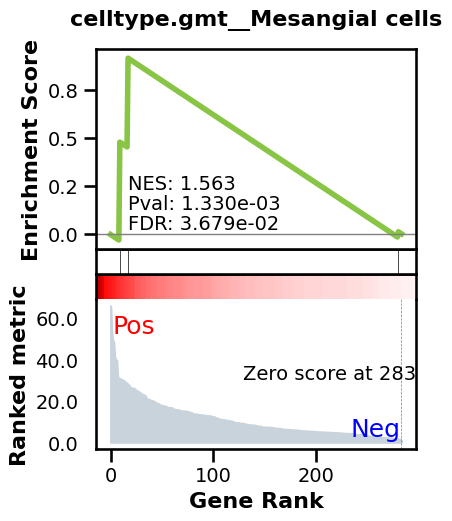

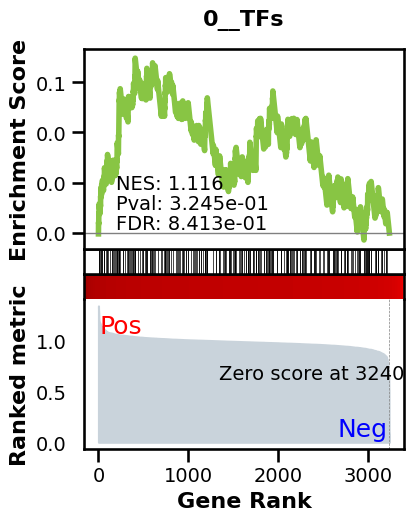

_________________________________________
TF specific enrichment


2024-05-20 21:37:52,920:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:37:52,922:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:37:53,145:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2353 genes
intersection pct: 0.7260104905893243
precision:  0.010672554539719605 
recall:  0.44926674593737614 
random precision: 0.0018235513499917605


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 41%|████▏     | 41/99 [00:00<00:00, 98.66it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 97.69it/s]


Area Under Precision-Recall Curve (AUPRC):  0.009947842113745437
EPR: 8.77099184963967


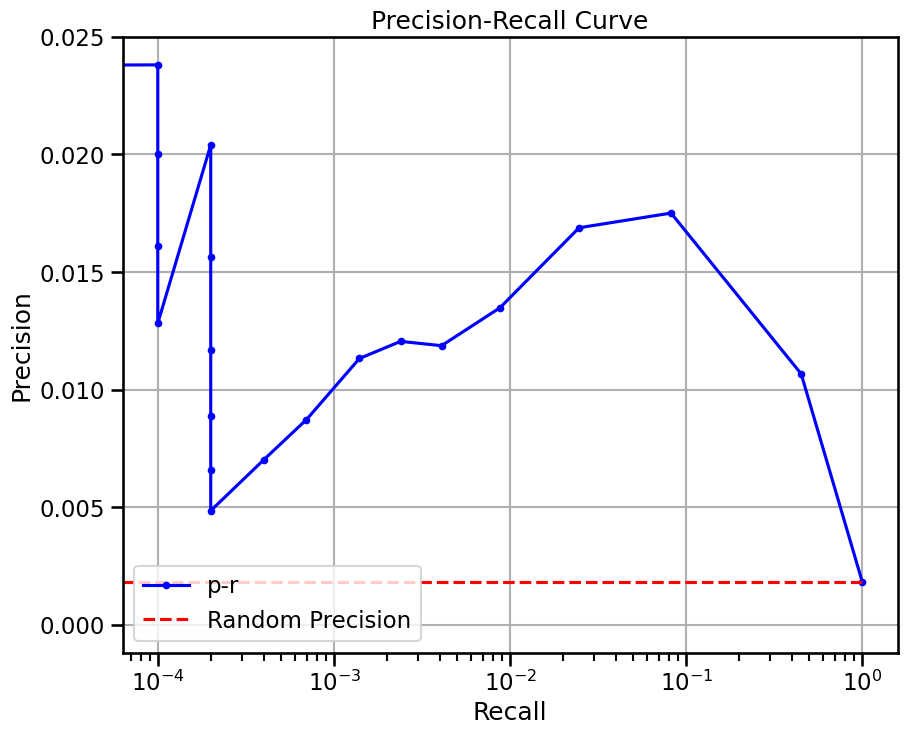

Tree method: RF
K: sqrt
Number of trees: 100


running jobs on 32 threads
Elapsed time: 33.87 seconds


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


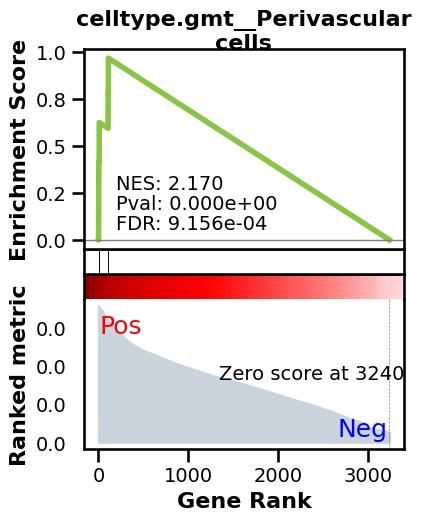

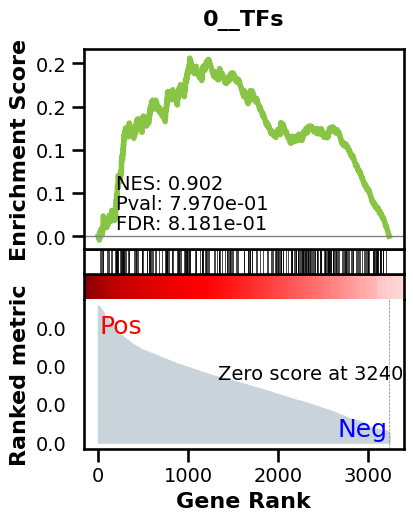

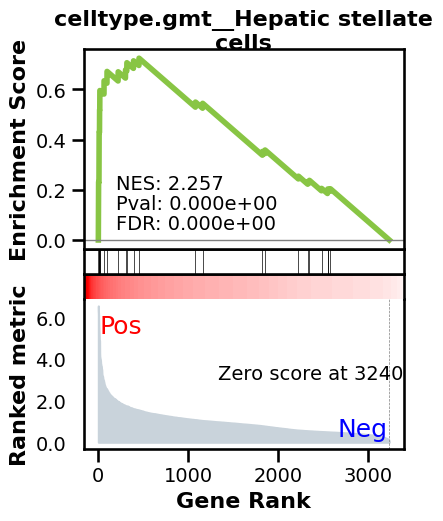

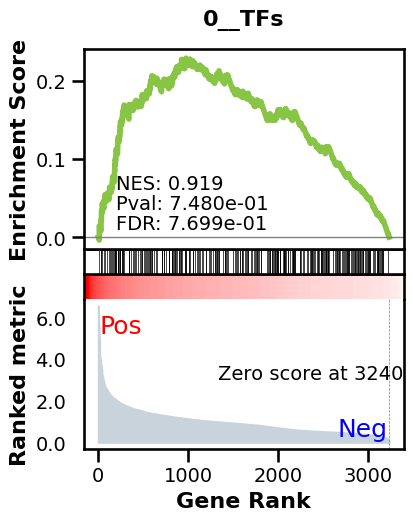

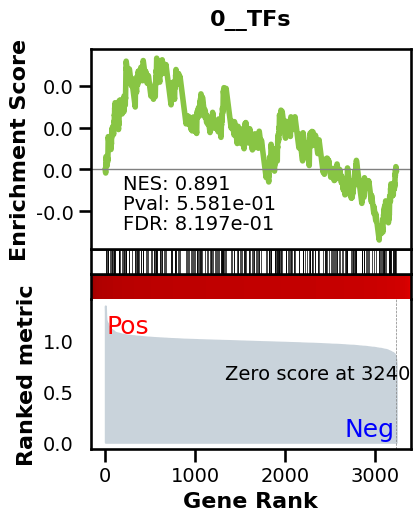

_________________________________________
TF specific enrichment


2024-05-20 21:39:02,566:INFO - Downloading and generating Enrichr library gene sets...
2024-05-20 21:39:02,568:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-20 21:39:02,765:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2353 genes
intersection pct: 0.7260104905893243
precision:  0.0025843761457101156 
recall:  0.3701942132382085 
random precision: 0.0018235513499917605


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:675: RuntimeWarning: invalid value encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
 41%|████▏     | 41/99 [00:00<00:00, 98.31it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 99.36it/s] 


Area Under Precision-Recall Curve (AUPRC):  0.0022844110698997007
EPR: 0.9780081240393453


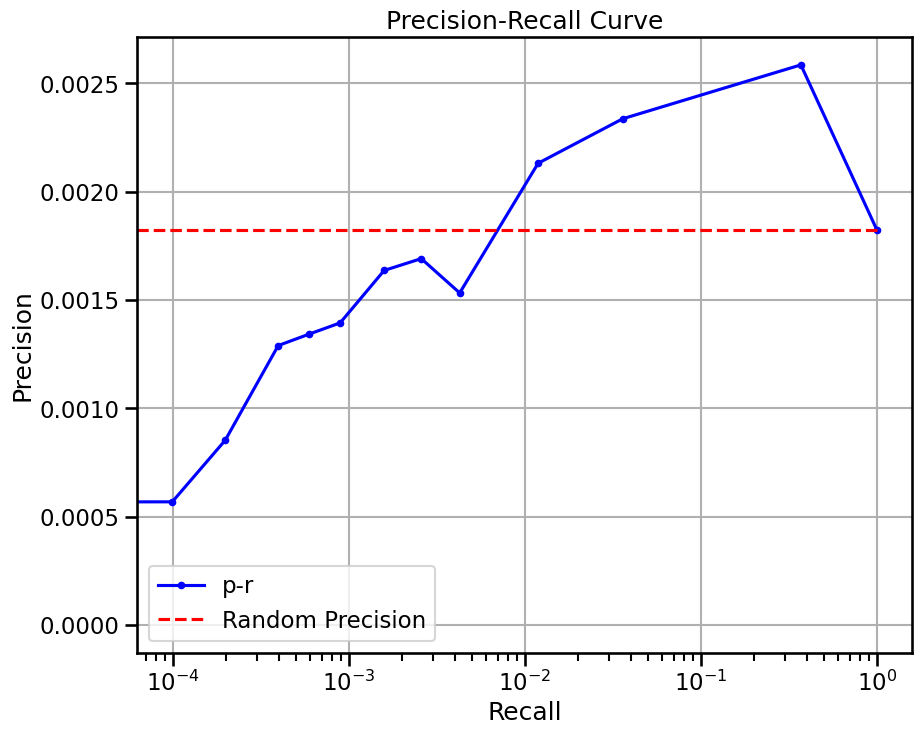

View of AnnData object with n_obs × n_vars = 1024 × 1436
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


base enrichment
Top central genes: []


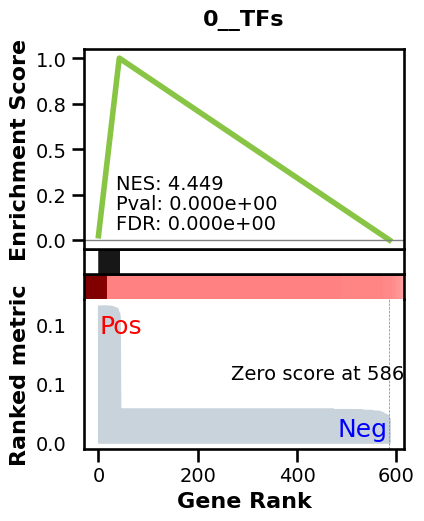

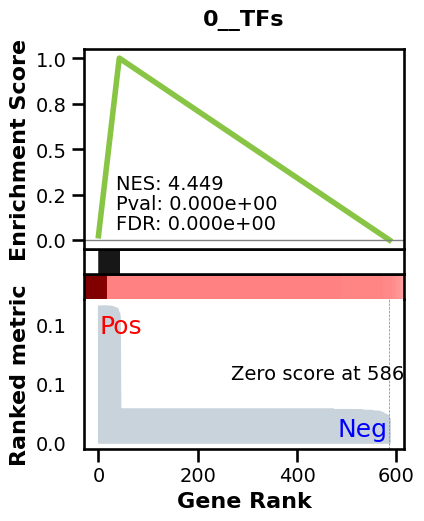

2024-05-20 21:39:31,689 [ERROR] No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.

2024-05-20 21:39:31,691 [ERROR] The first entry of your gene_sets (gmt) look like this : { 0__TFs: [AC008770.3, AC023509.3, AC092835.1, AC138696.1, ADNP, ADNP2, AEBP1, AEBP2, AHCTF1, AHDC1, AHR, AHRR, AIRE, AKAP8, AKAP8L, AKNA, ALX1, ALX3, ALX4, ANHX, ANKZF1, AR, ARGFX, ARHGAP35, ARID2, ARID3A, ARID3B, ARID3C, ARID5A, ARID5B, ARNT, ARNT2, ARNTL, ARNTL2, ARX, ASCL1, ASCL2, ASCL3, ASCL4, ASCL5, ASH1L, ATF1, ATF2, ATF3, ATF4, ATF5, ATF6, ATF6B, ATF7, ATMIN, ATOH1, ATOH7, ATOH8, BACH1, BACH2, BARHL1, BARHL2, BARX1, BARX2, BATF, BATF2, BATF3, BAZ2A, BAZ2B, BBX, BCL11A, BCL11B, BCL6, BCL6B, BHLHA15, BHLHA9, BHLHE22, BHLHE23, BHLHE40, BHLHE41, BNC1, BNC2, BORCS8-MEF2B, BPTF, BRF2, BSX, C11orf95, CAMTA1, CAMTA2, CARF, CASZ1, C

LookupError: No gene sets passed through filtering condition !!! 
Hint 1: Try to lower min_size or increase max_size !
Hint 2: Check gene symbols are identifiable to your gmt input.
Hint 3: Gene symbols curated in Enrichr web services are all upcases.


In [5]:
sc.tl.rank_genes_groups(
    adata, groupby="cell_type"
)
adata.var['ensembl_id'] = adata.var.index
metrics = {}
for celltype in CELLTYPES:
    to_use = adata.uns["rank_genes_groups"]["names"][celltype][
        : NUM_GENES
    ].tolist()
    subadata = adata[adata.obs.cell_type == celltype][:1024, adata.var.index.isin(
        model.genes) & adata.var.index.isin(to_use)]
    print(subadata)
    genie_grn = compute_genie3(
        subadata, nthreads=32, regulators=adata.var[adata.var.isTF].index.tolist())
    genie_grn.var.index = make_index_unique(
        genie_grn.var['symbol'].astype(str))
    metrics['genie3_tf_'+celltype] = BenGRN(genie_grn,
                                            do_auc=True, doplot=True).scprint_benchmark()
    genie_grn = compute_genie3(subadata, nthreads=32)
    genie_grn.var.index = make_index_unique(
        genie_grn.var['symbol'].astype(str))
    metrics['genie3_'+celltype] = BenGRN(genie_grn,
                                         do_auc=True, doplot=True).scprint_benchmark()

In [6]:
metrics

{'genie3_tfkidney distal convoluted tubule epithelial cell': {'enriched_terms_Central': ['celltype.gmt__Distal tubule cells',
   'celltype.gmt__-intercalated cells (Collecting duct system)',
   'celltype.gmt__Loop of Henle cells',
   'celltype.gmt__Connecting tubule cells',
   'celltype.gmt__Proximal tubule cells',
   'celltype.gmt__Cholangiocytes',
   'celltype.gmt__Hepatic stellate cells',
   'celltype.gmt__Ductal cells',
   'celltype.gmt__Podocytes',
   'celltype.gmt__Ionocytes',
   'celltype.gmt__Hepatocytes'],
  'enriched_terms_Targets': ['celltype.gmt__Distal tubule cells',
   'celltype.gmt__-intercalated cells (Collecting duct system)',
   'celltype.gmt__Cholangiocytes',
   'celltype.gmt__Loop of Henle cells',
   'celltype.gmt__Ductal cells',
   'celltype.gmt__Connecting tubule cells',
   'celltype.gmt__Proximal tubule cells',
   'celltype.gmt__Hepatic stellate cells',
   'celltype.gmt__Hepatocytes',
   'celltype.gmt__Enterocytes',
   'celltype.gmt__Podocytes',
   'celltype.gmt_

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/multiprocessing/pool.py:265: ResourceWarning: unclosed running multiprocessing pool <multiprocessing.pool.Pool state=RUN pool_size=32>
  _warn(f"unclosed running multiprocessing pool {self!r}",


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  11.607142857142858 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:24<00:00,  3.88it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.89it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0009939494620030422
EPR: 2.3348120462966486


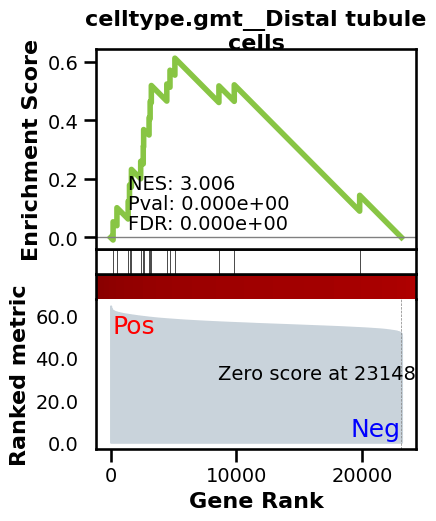

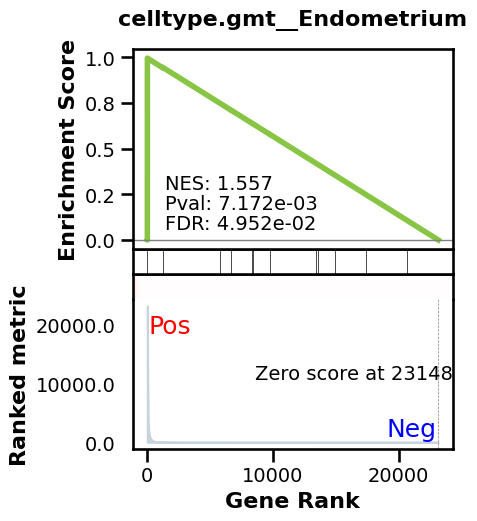

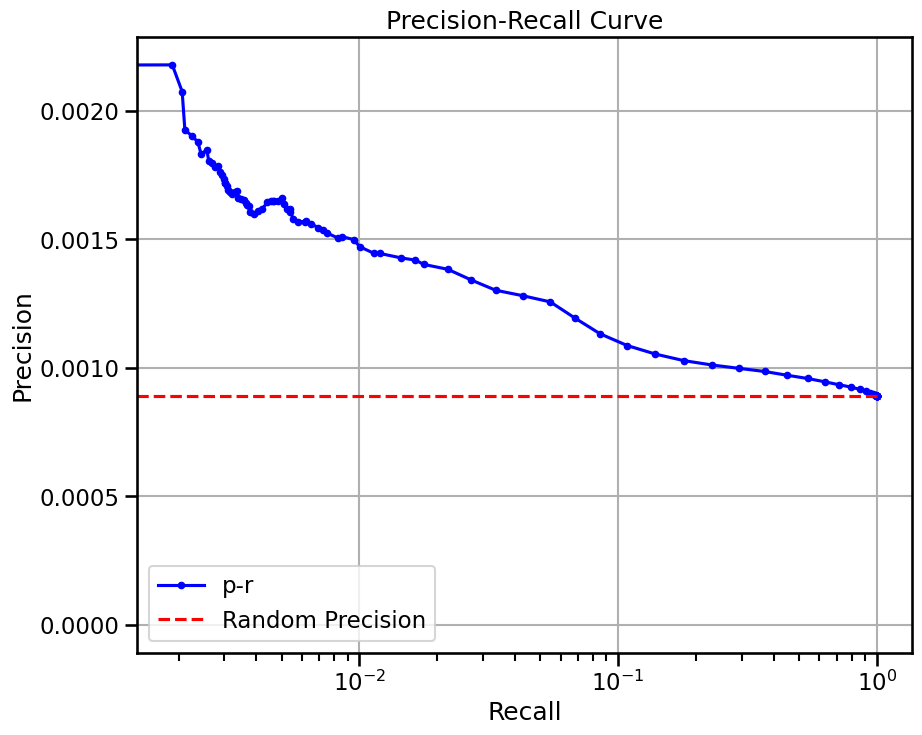

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 5612 ...
doing regression....
metrics {'used_heads': 63, 'precision': 0.007785467128027681, 'random_precision': 0.0008422090729783038, 'recall': 0.0026346604215456673, 'predicted_true': 1156.0, 'number_of_true': 3416.0, 'epr': 4.54555214759686}


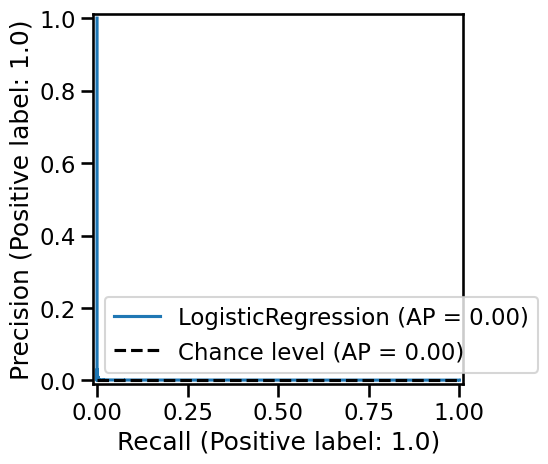

base enrichment
Top central genes: []


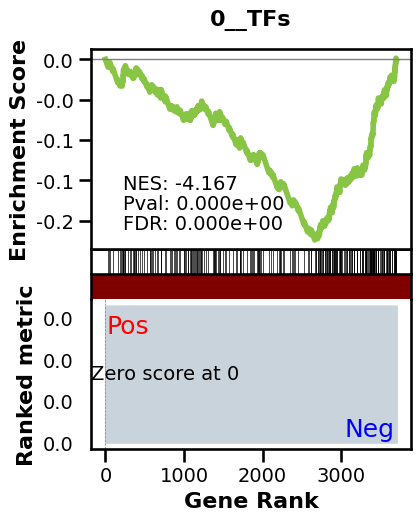

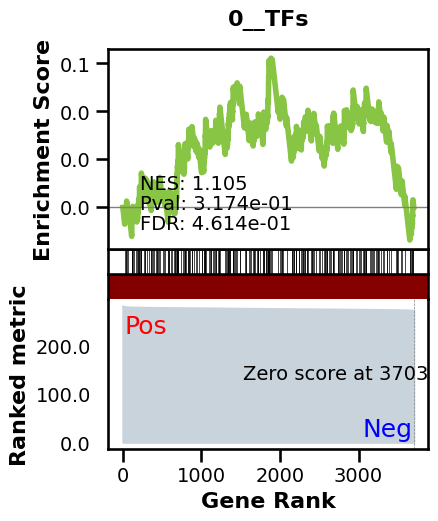

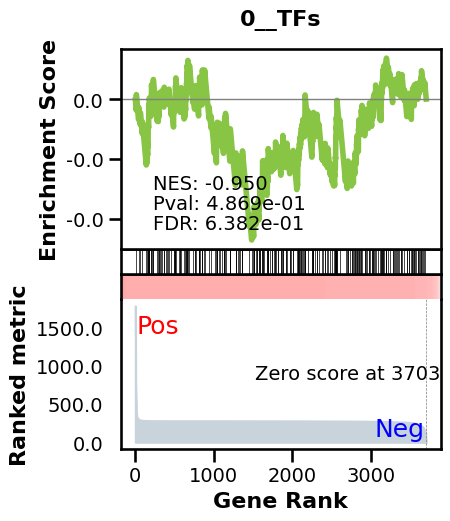

_________________________________________
TF specific enrichment
found some significant results for  3.7037037037037037 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2600 genes
intersection pct: 0.7019438444924406
precision:  0.0008301775147928994 
recall:  1.0 
random precision: 0.0008304969366916269


 97%|█████████▋| 96/99 [00:01<00:00, 84.93it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 82.50it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0013750994627891235
EPR: 6.933321000501022


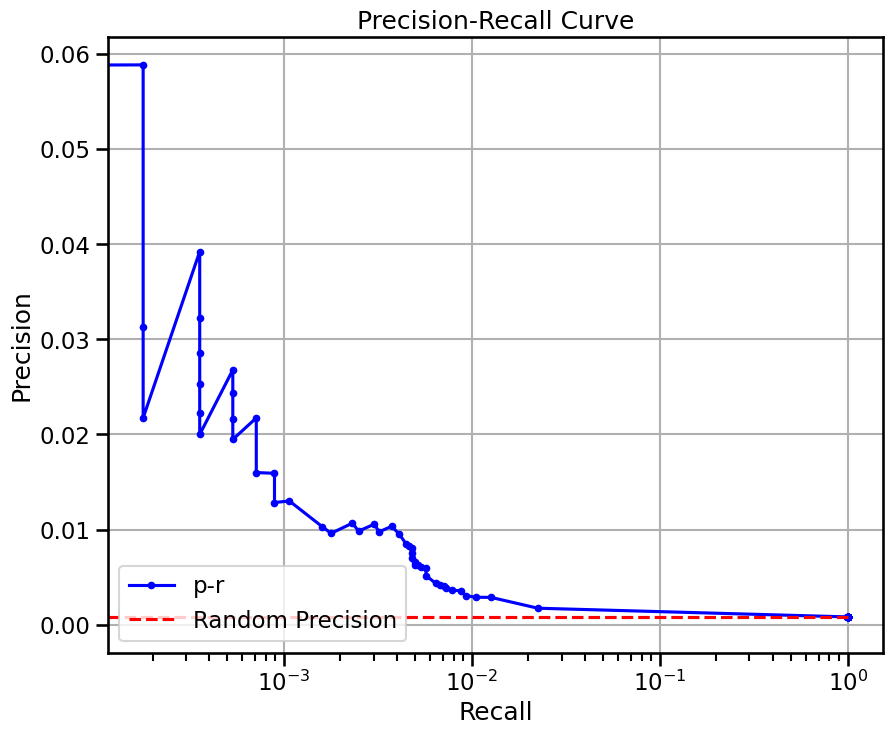

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536200336, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  8.035714285714286 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380594435804389
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:24<00:00,  3.92it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.89it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010013548658858304
EPR: 2.3348120462966486


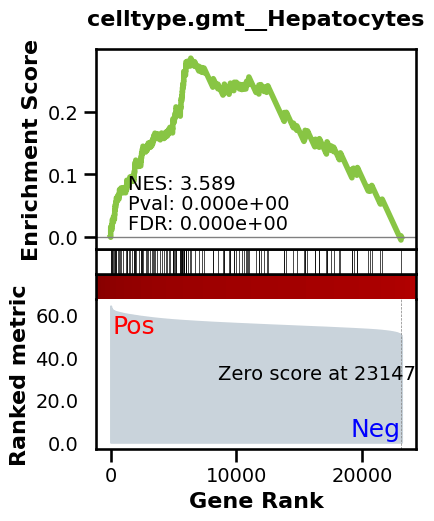

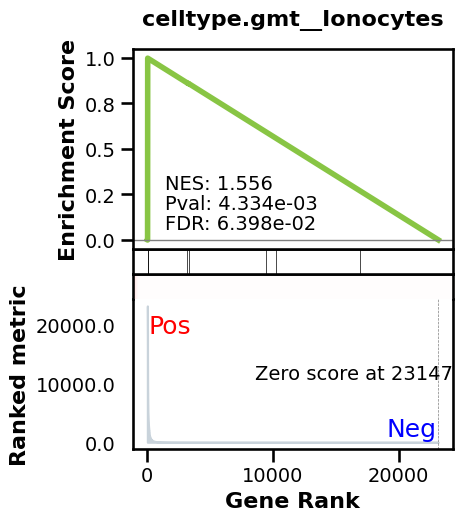

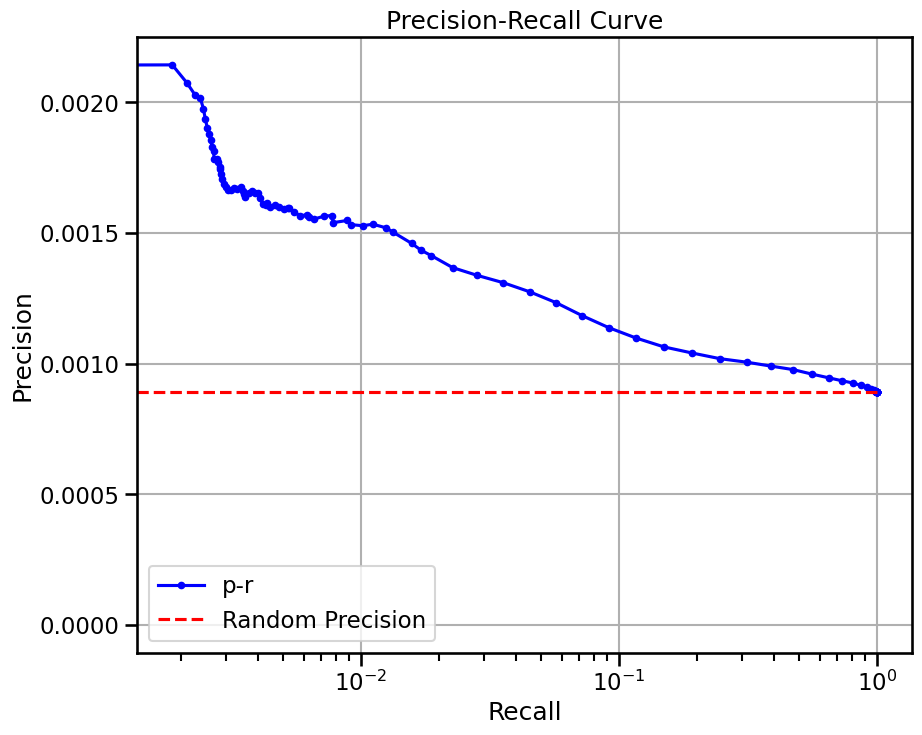

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 4792 ...
doing regression....
metrics {'used_heads': 65, 'precision': 0.010309278350515464, 'random_precision': 0.0007047986744198102, 'recall': 0.00038109756097560977, 'predicted_true': 97.0, 'number_of_true': 2624.0, 'epr': 7.08952710309519}


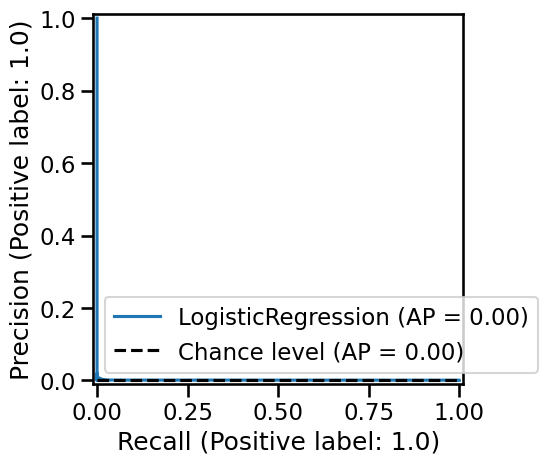

base enrichment
Top central genes: []


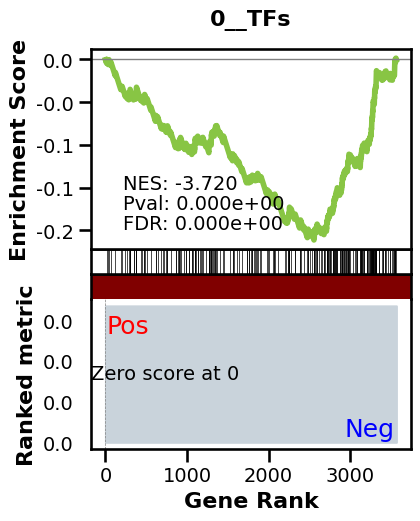

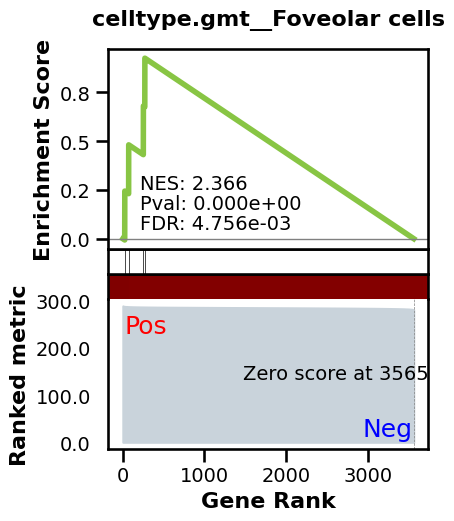

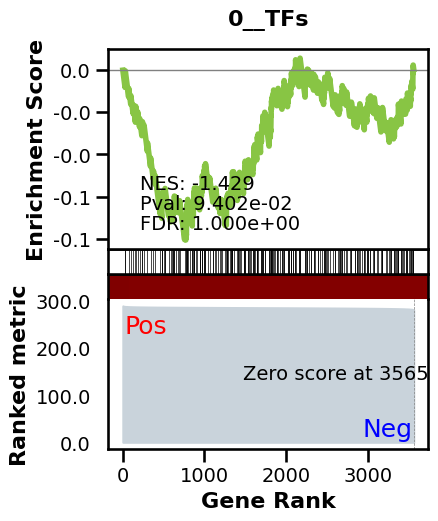

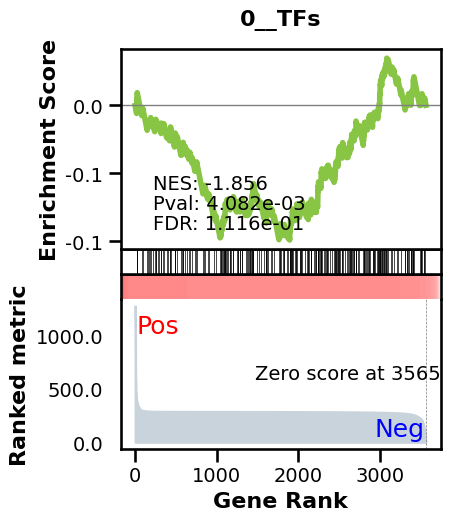

_________________________________________
TF specific enrichment
found some significant results for  11.764705882352942 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2491 genes
intersection pct: 0.6985417835109367
precision:  0.0007722703378086443 
recall:  1.0 
random precision: 0.0007725804865386878


 95%|█████████▍| 94/99 [00:01<00:00, 92.58it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 84.60it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0014250531154467296
EPR: 6.262911932849327


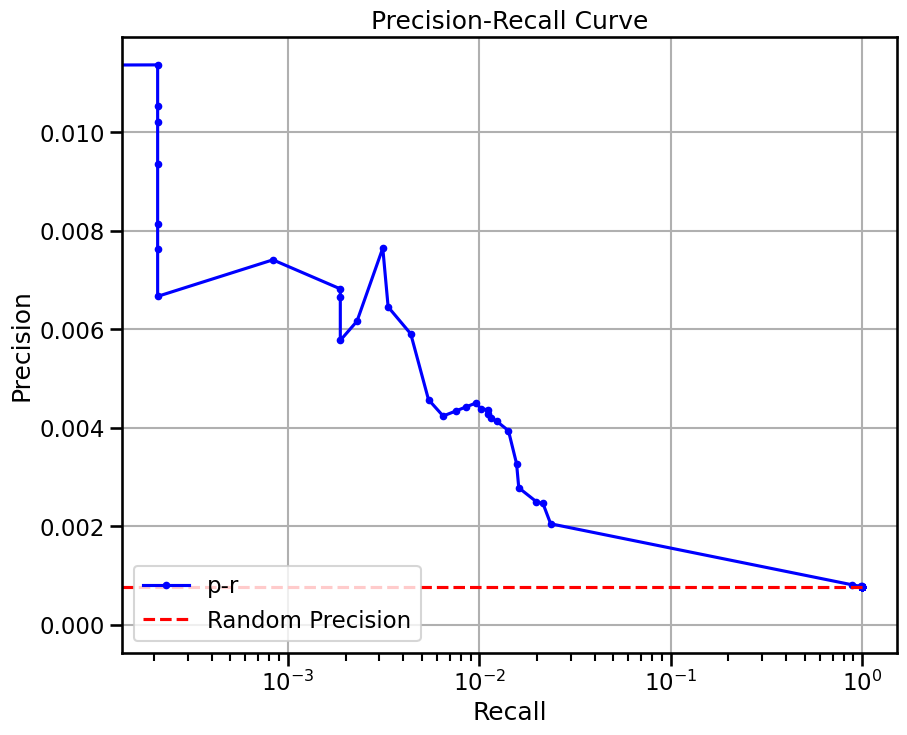

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:25<00:00,  2.73it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:26<00:00,  3.74it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010044886864059503
EPR: 2.466004113138552


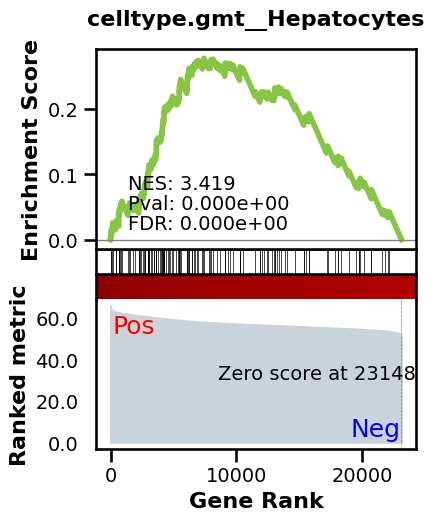

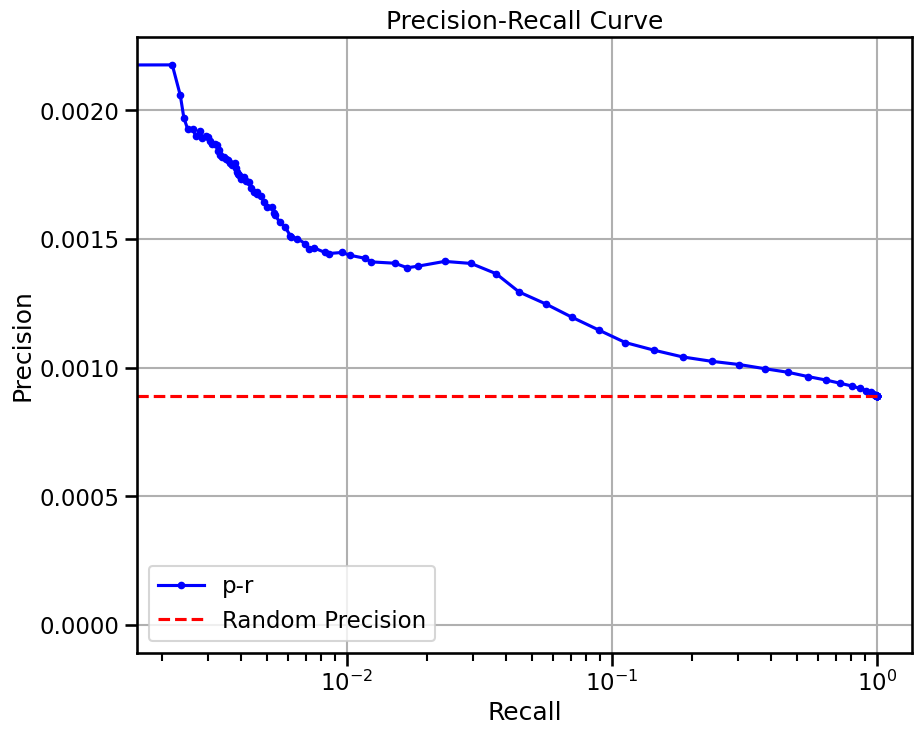

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 10354 ...
doing regression....
metrics {'used_heads': 70, 'precision': 0.00619933237958989, 'random_precision': 0.0013122249438910316, 'recall': 0.0045670121201475495, 'predicted_true': 4194.0, 'number_of_true': 5693.0, 'epr': 4.594037692836882}


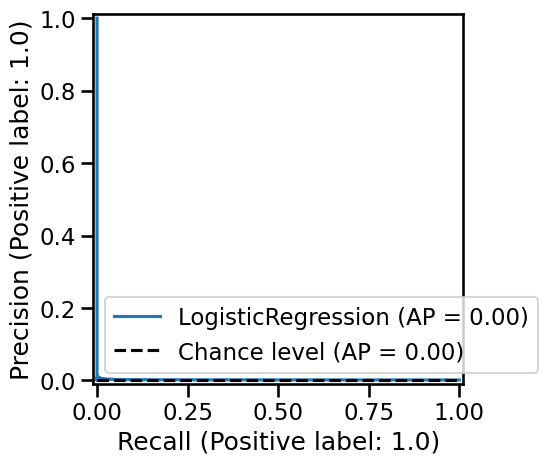

base enrichment
Top central genes: []


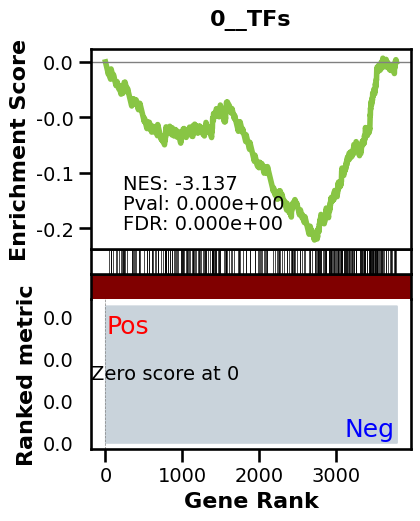

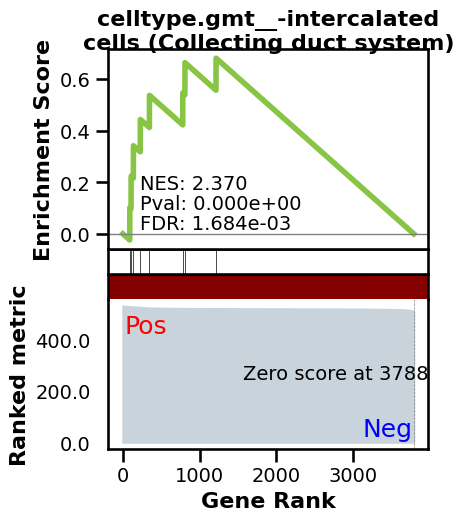

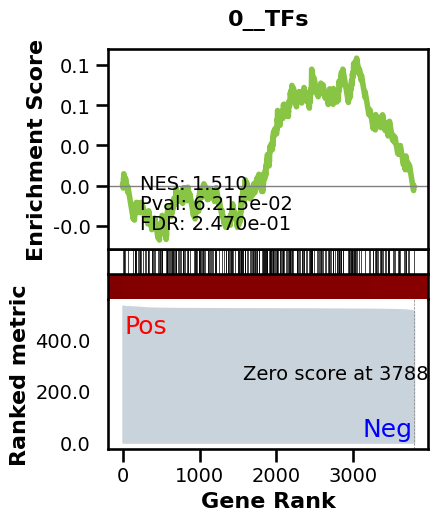

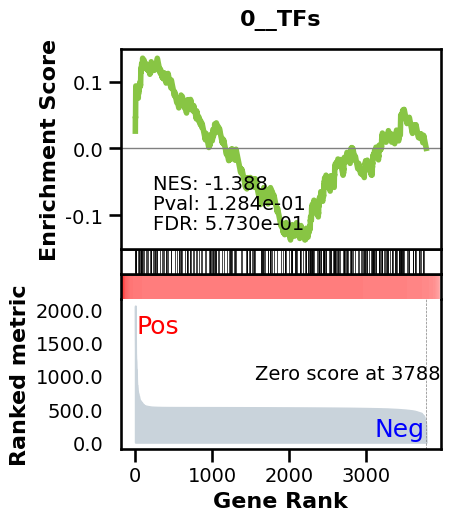

_________________________________________
TF specific enrichment
found some significant results for  10.714285714285714 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2689 genes
intersection pct: 0.7096859329638427
precision:  0.0014319457215953982 
recall:  1.0 
random precision: 0.0014324784394977776


 95%|█████████▍| 94/99 [00:01<00:00, 72.53it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 70.84it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0022897736022818222
EPR: 5.948554115489471


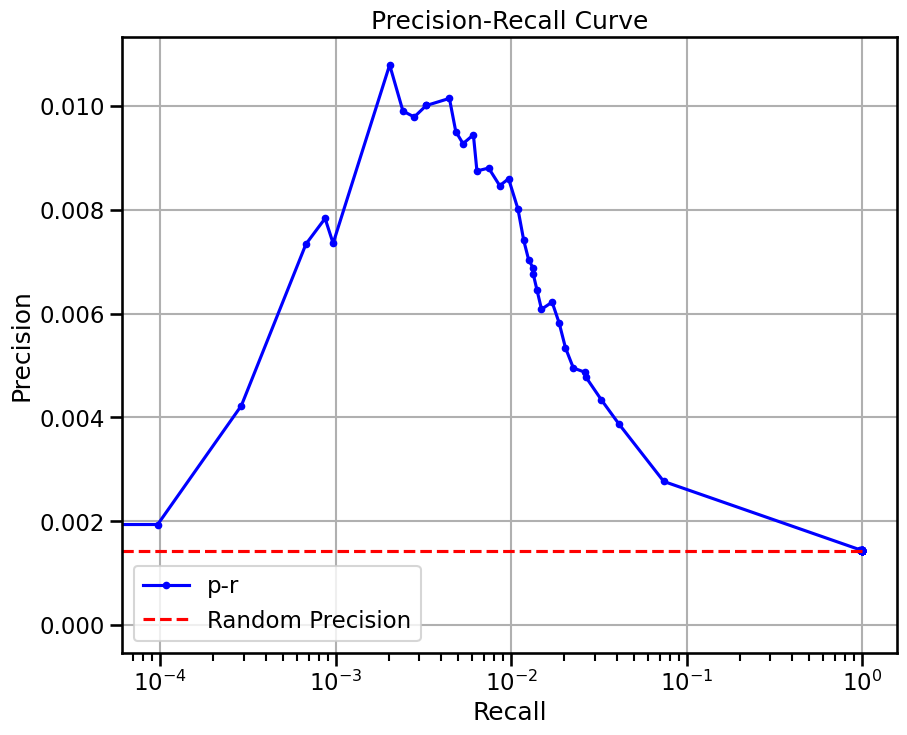

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 100240144, sparsity: 1.0
base enrichment
too many genes for central computation


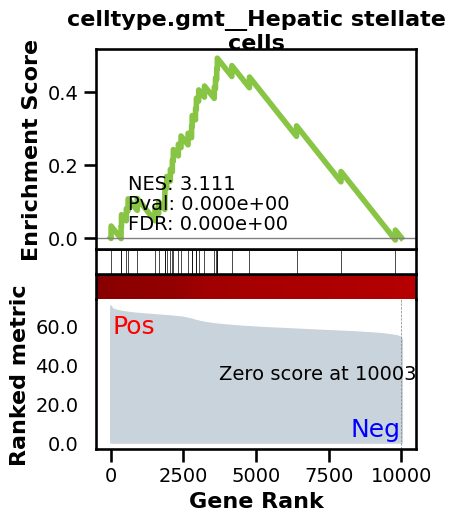

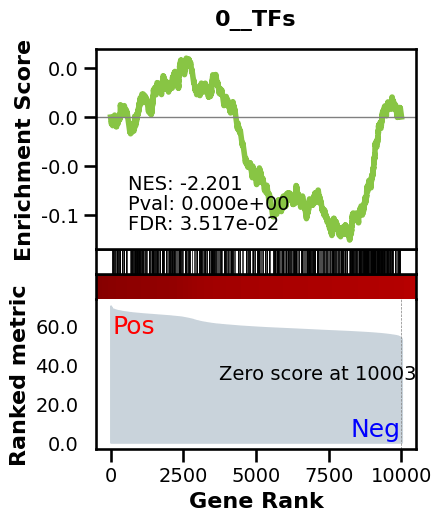

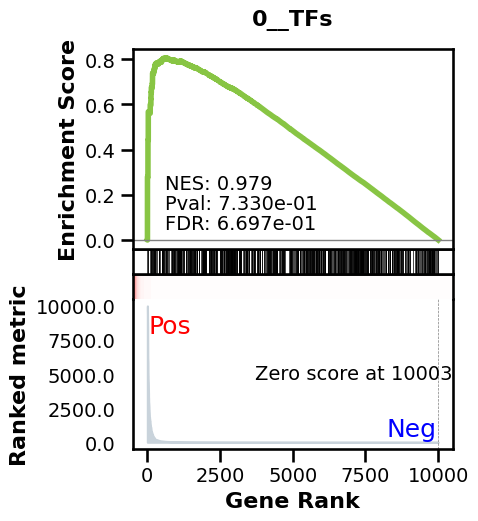

_________________________________________
TF specific enrichment
found some significant results for  2.7777777777777777 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 5863 genes
intersection pct: 0.5860655737704918
precision:  0.0009970976095868456 
recall:  1.0 
random precision: 0.0009972677047096


 97%|█████████▋| 96/99 [00:05<00:00, 16.76it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:05<00:00, 16.59it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0011041274713499984
EPR: 1.7285936438529756


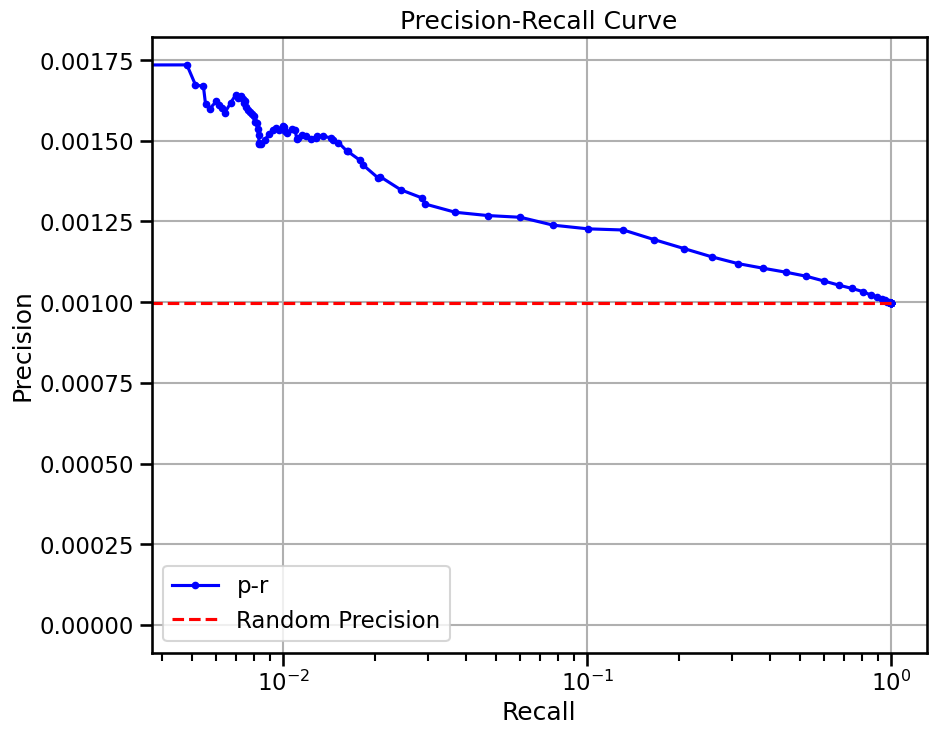

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 5880 ...
doing regression....
metrics {'used_heads': 66, 'precision': 0.008666941807676434, 'random_precision': 0.0012756666839943858, 'recall': 0.0057049714751426246, 'predicted_true': 2423.0, 'number_of_true': 3681.0, 'epr': 7.578079464897998}


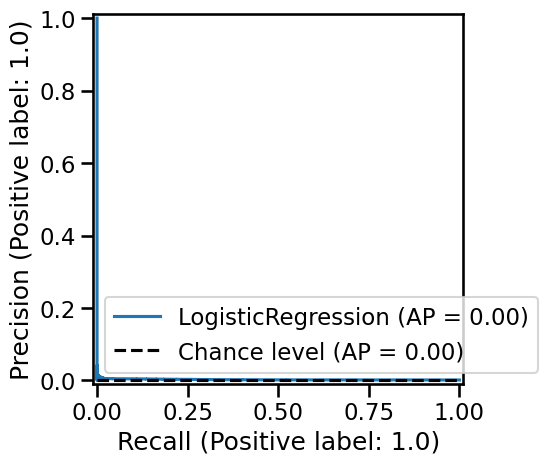

base enrichment
Top central genes: []


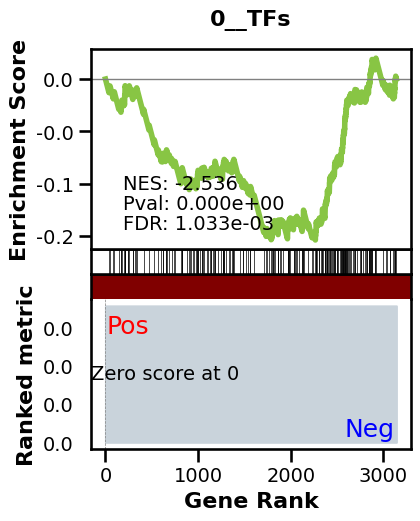

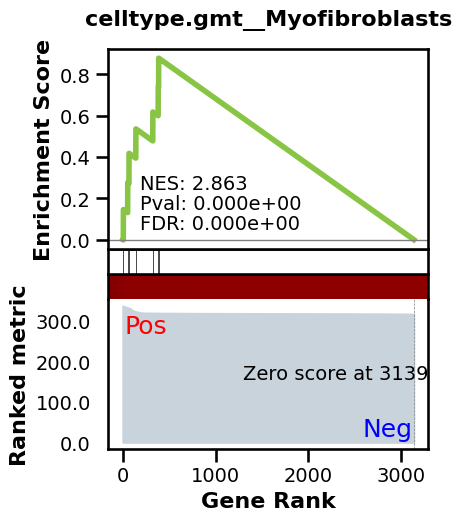

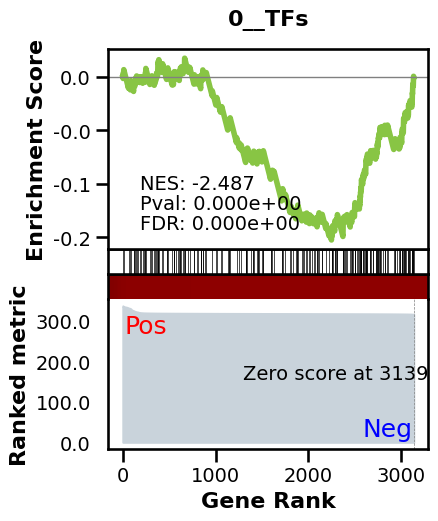

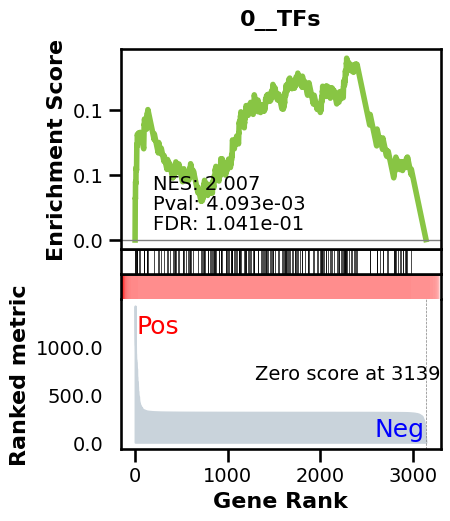

_________________________________________
TF specific enrichment
found some significant results for  3.125 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2193 genes
intersection pct: 0.6984076433121019
precision:  0.001222644117615869 
recall:  1.0 
random precision: 0.001223201893216971


 95%|█████████▍| 94/99 [00:00<00:00, 120.08it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 111.26it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002781884693923815
EPR: 8.349828906180345


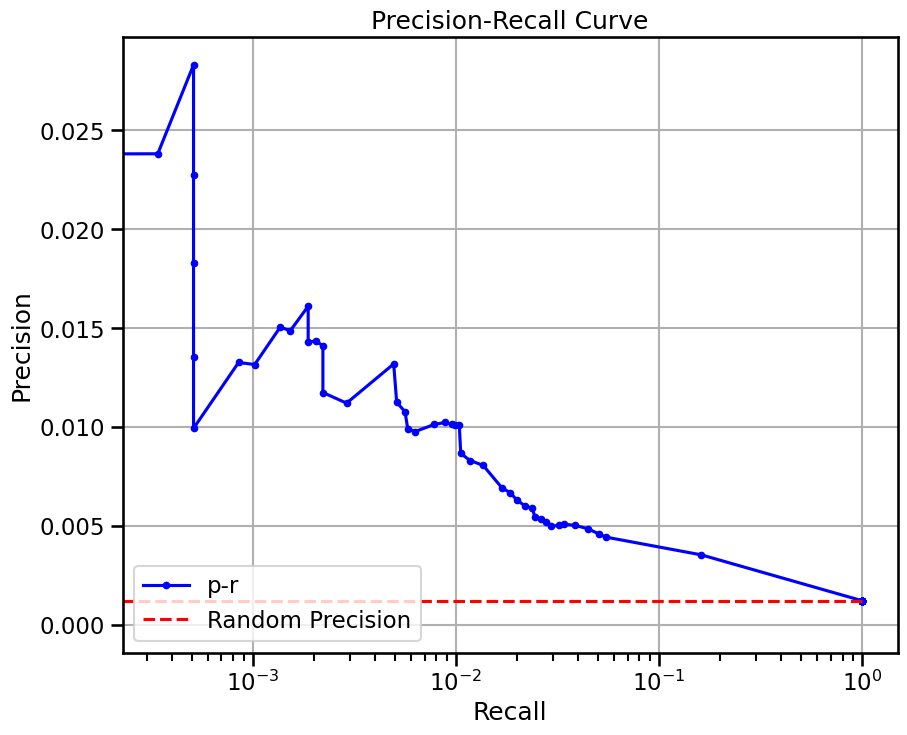

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:24<00:00,  3.91it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.90it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010307340745107276
EPR: 2.6218738561552595


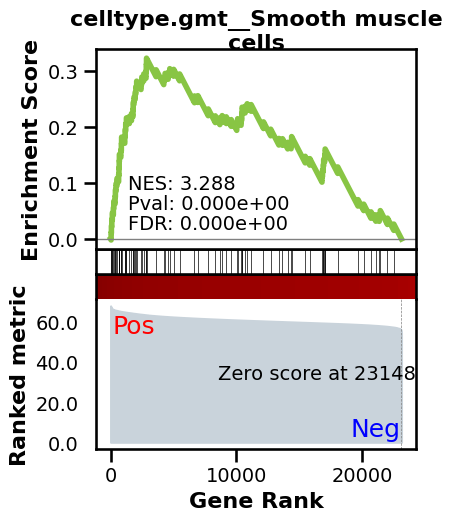

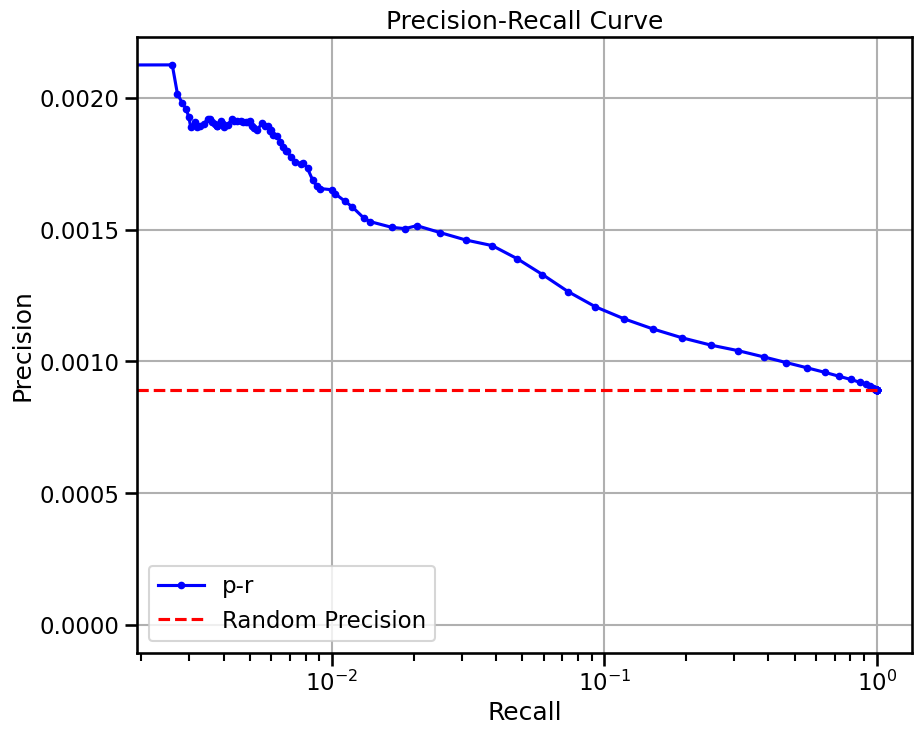

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 8266 ...
doing regression....
metrics {'used_heads': 72, 'precision': 0.008264462809917356, 'random_precision': 0.0015600289839414808, 'recall': 0.006965174129353234, 'predicted_true': 4235.0, 'number_of_true': 5025.0, 'epr': 5.037459760976945}


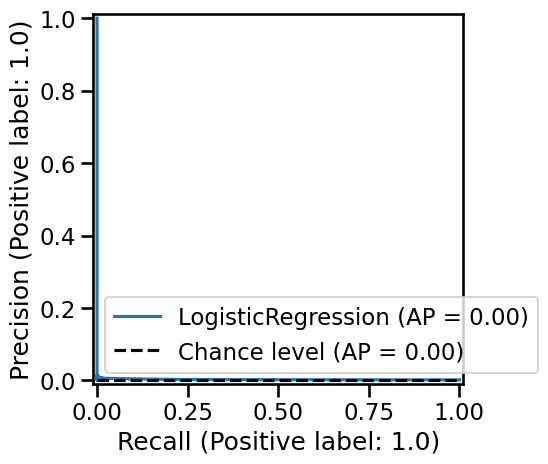

base enrichment
Top central genes: []


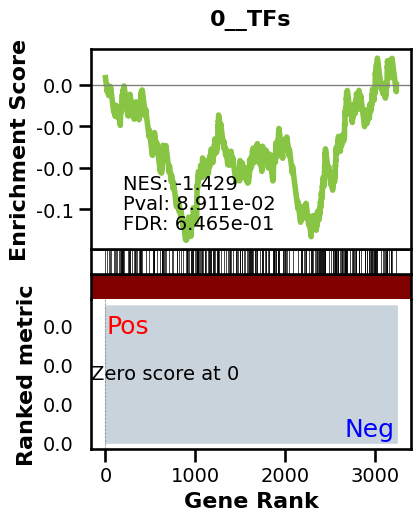

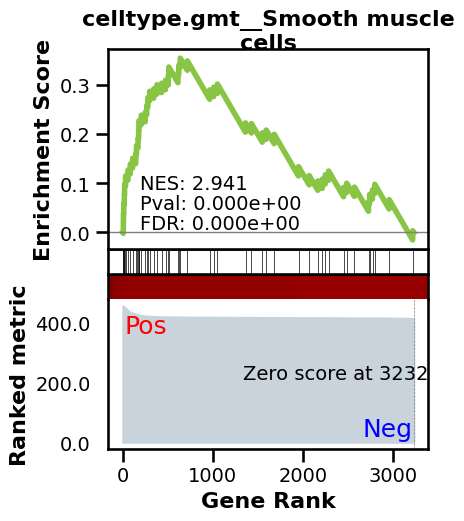

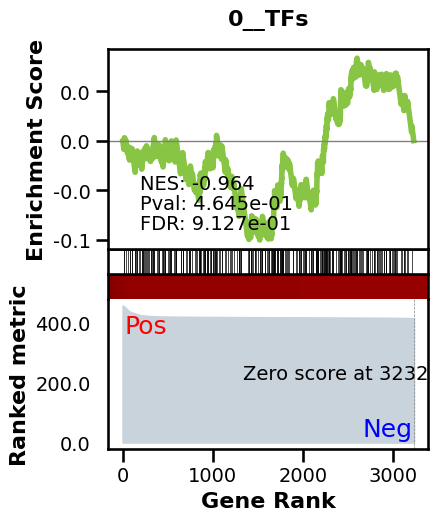

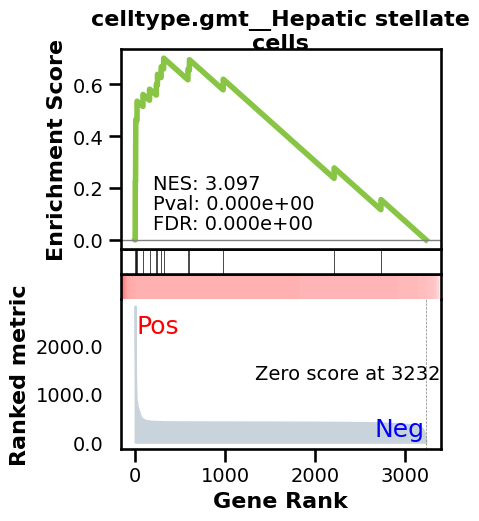

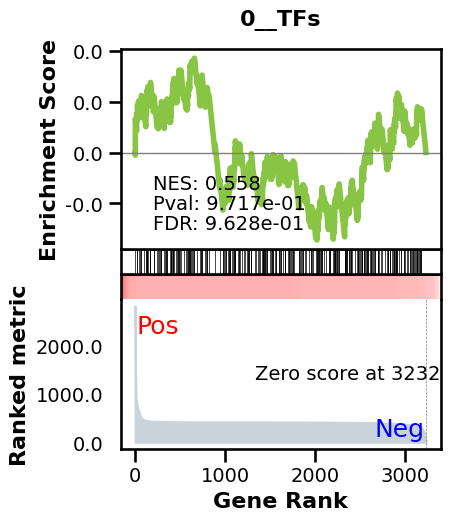

_________________________________________
TF specific enrichment
found some significant results for  15.789473684210526 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2317 genes
intersection pct: 0.7166718218373028
precision:  0.0015397256099435055 
recall:  1.0 
random precision: 0.0015403904310186108


 94%|█████████▍| 93/99 [00:00<00:00, 103.78it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 98.40it/s] 


Area Under Precision-Recall Curve (AUPRC):  0.0032530019469557787
EPR: 5.412814733372929


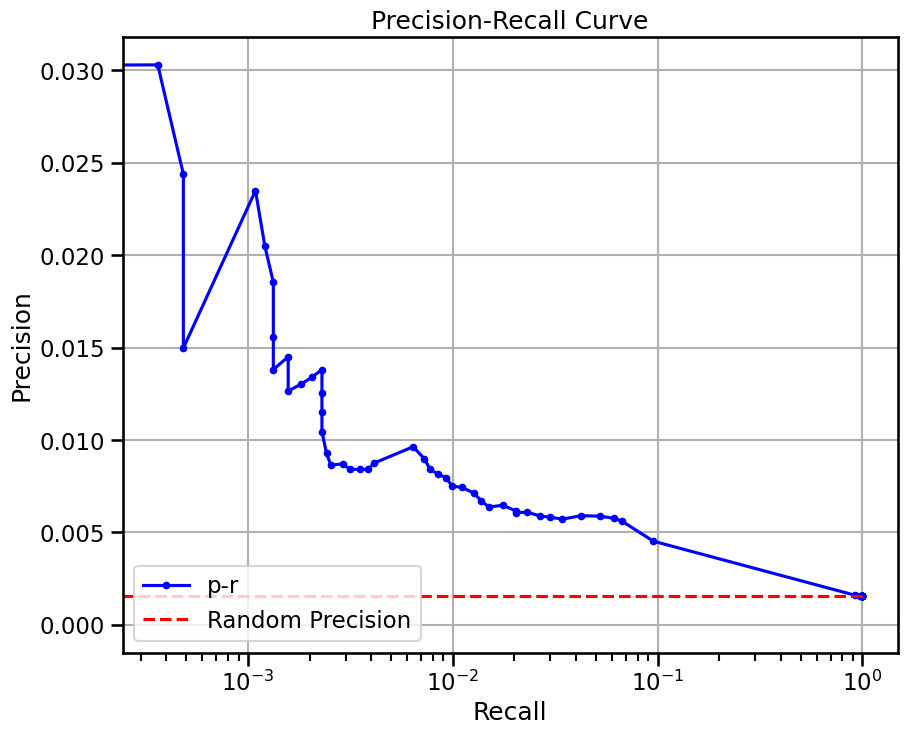

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  15.178571428571429 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:24<00:00,  3.79it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.91it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001022841800296881
EPR: 2.4414009590382575


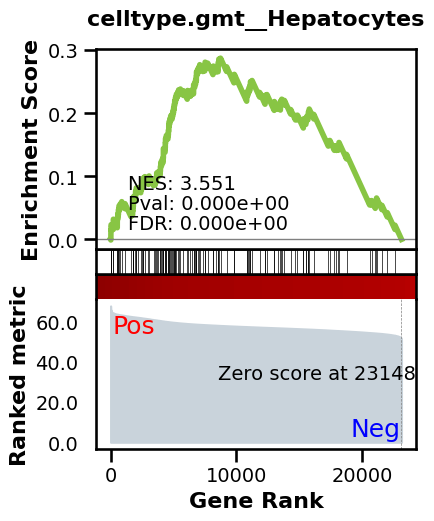

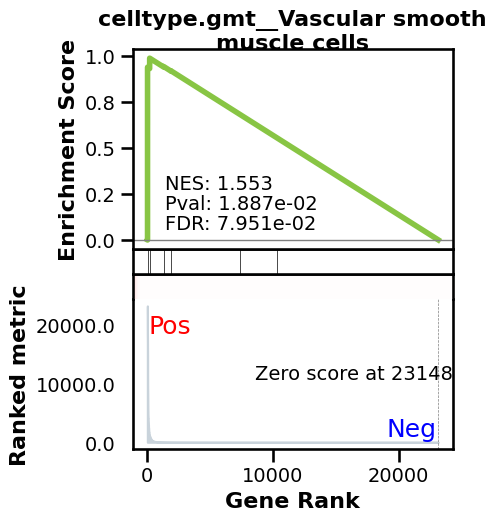

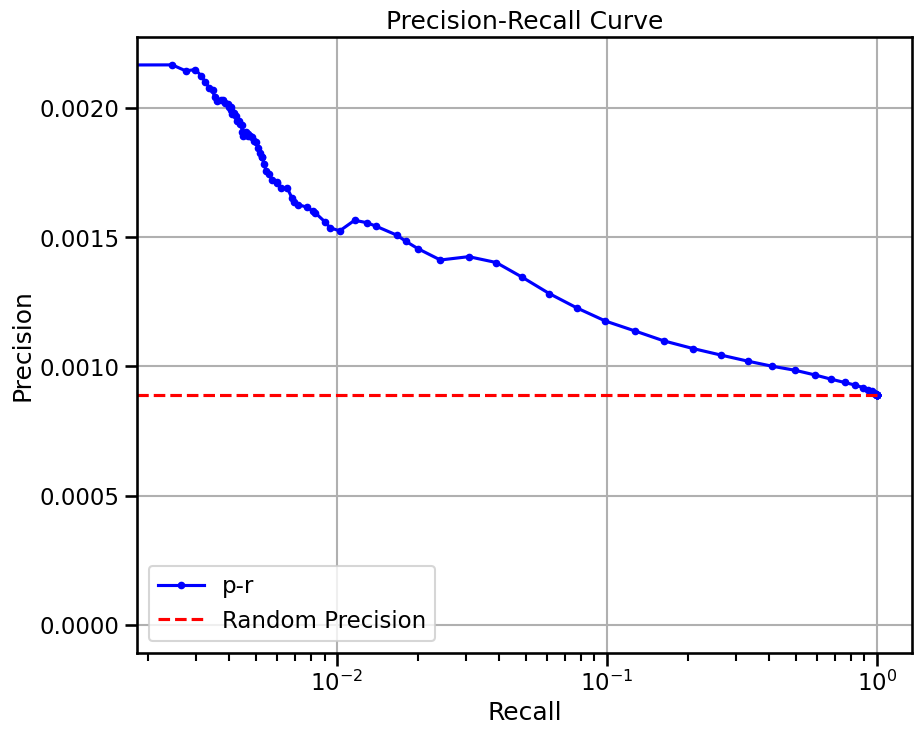

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 9305 ...
doing regression....
metrics {'used_heads': 66, 'precision': 0.005966191581040769, 'random_precision': 0.0011396628526508866, 'recall': 0.003678724708767627, 'predicted_true': 3017.0, 'number_of_true': 4893.0, 'epr': 5.434049019633961}


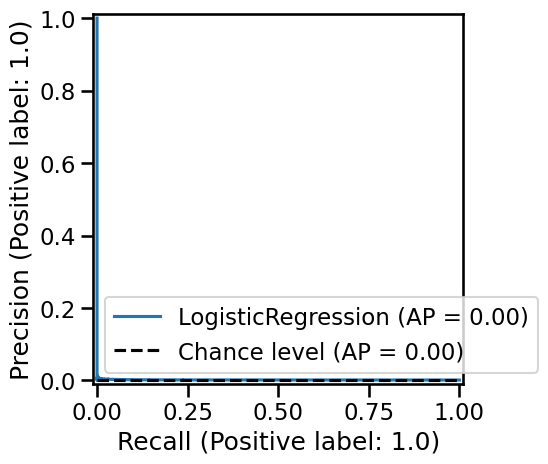

base enrichment
Top central genes: []


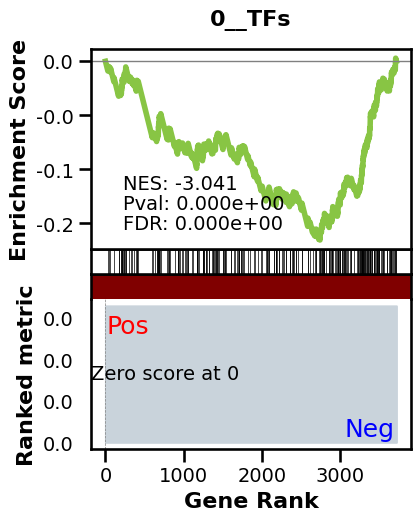

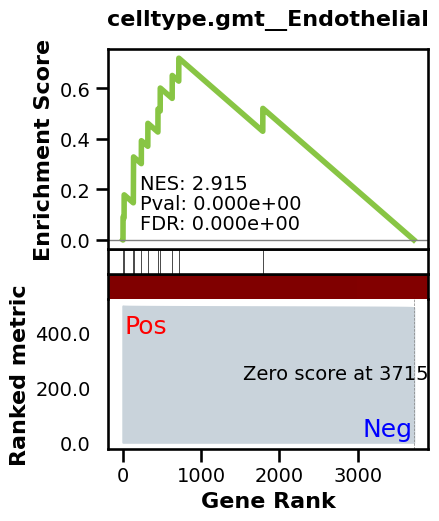

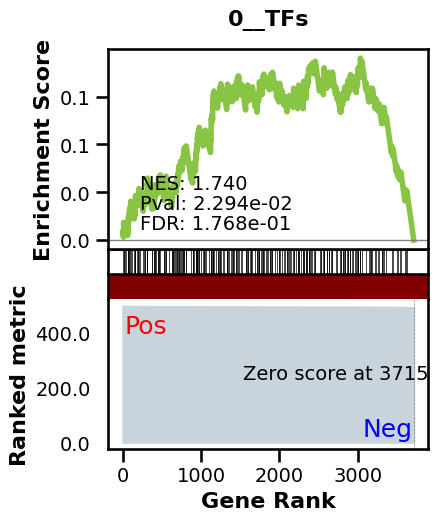

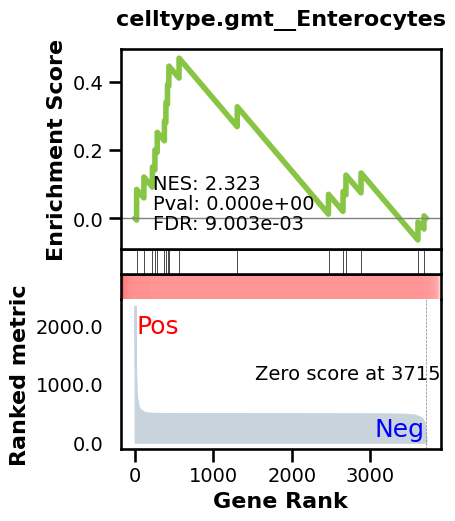

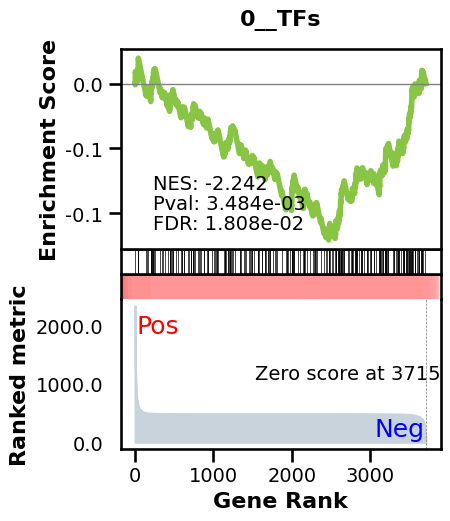

_________________________________________
TF specific enrichment
found some significant results for  3.125 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2675 genes
intersection pct: 0.7198600645855759
precision:  0.0013003755786531574 
recall:  1.0 
random precision: 0.0013008618821605071


 94%|█████████▍| 93/99 [00:01<00:00, 75.69it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 68.39it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002468126880929146
EPR: 5.685975282695872


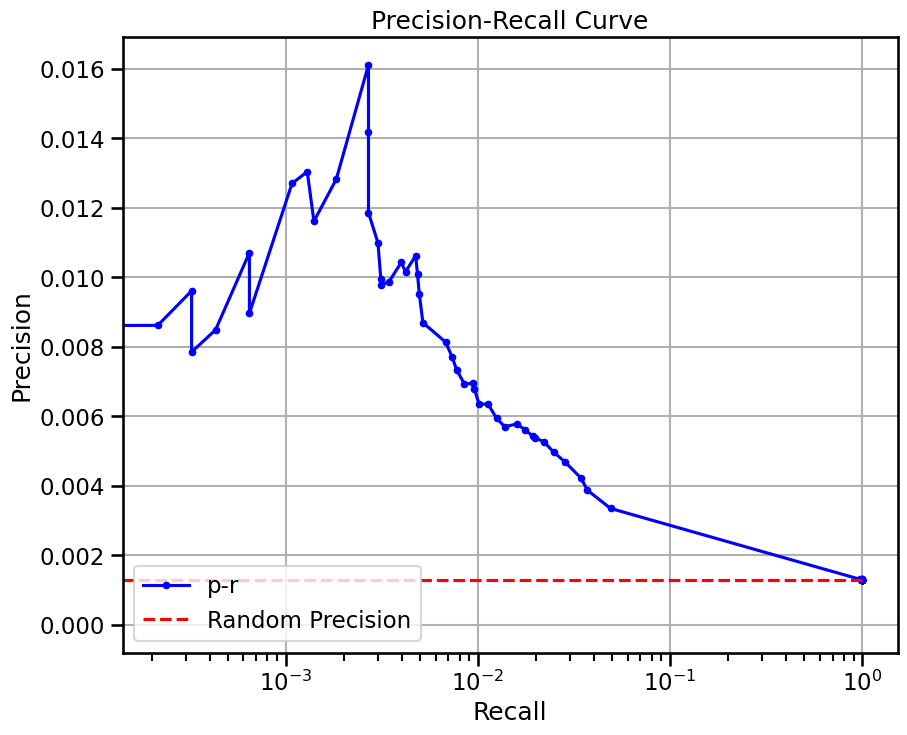

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 489073225, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  4.504504504504505 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12010 genes
intersection pct: 0.5432668385579228
precision:  0.0008980373696357671 
recall:  1.0 
random precision: 0.0008981121499979651


 98%|█████████▊| 97/99 [00:23<00:00,  4.10it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:24<00:00,  4.10it/s]


Area Under Precision-Recall Curve (AUPRC):  0.000997283774821351
EPR: 2.11882551172527


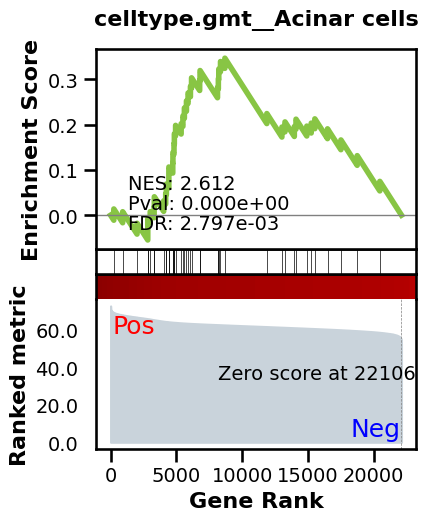

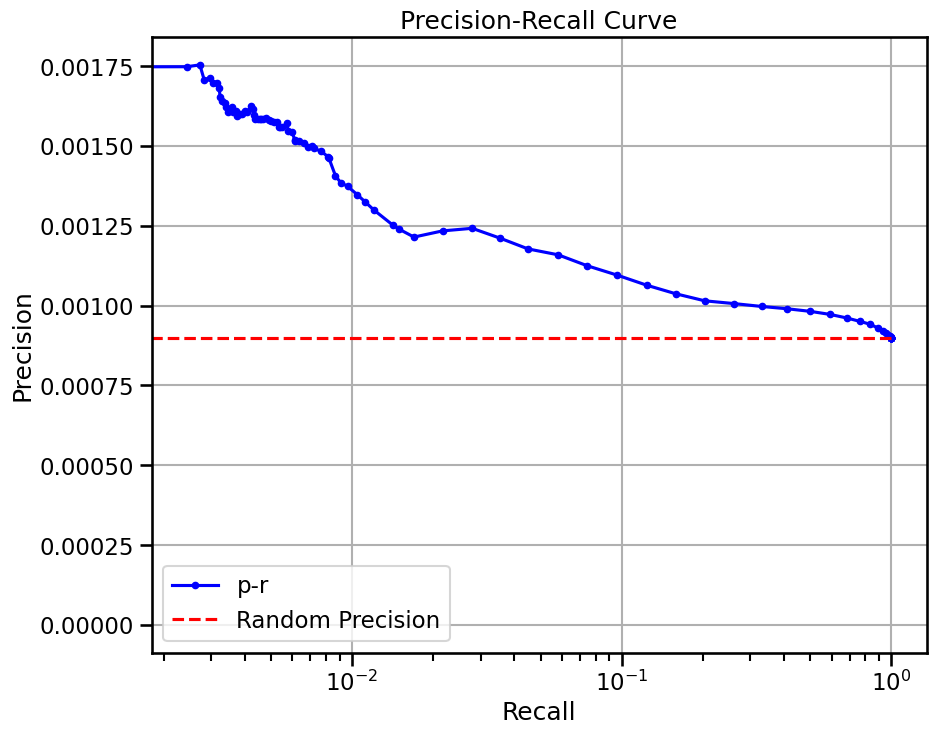

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 8436 ...
doing regression....
metrics {'used_heads': 69, 'precision': 0.008324661810613945, 'random_precision': 0.0013867763142579909, 'recall': 0.0065506653019447286, 'predicted_true': 3844.0, 'number_of_true': 4885.0, 'epr': 5.530100407163241}


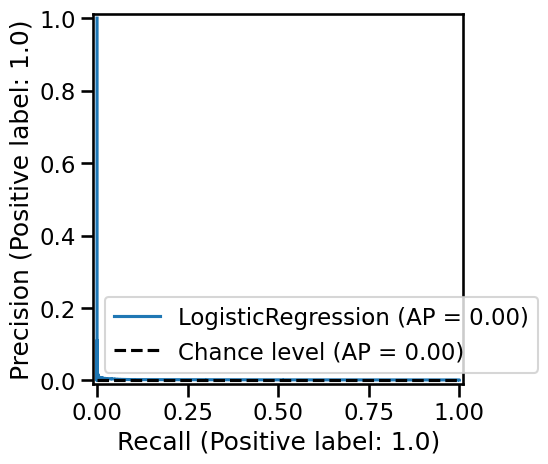

base enrichment
Top central genes: []


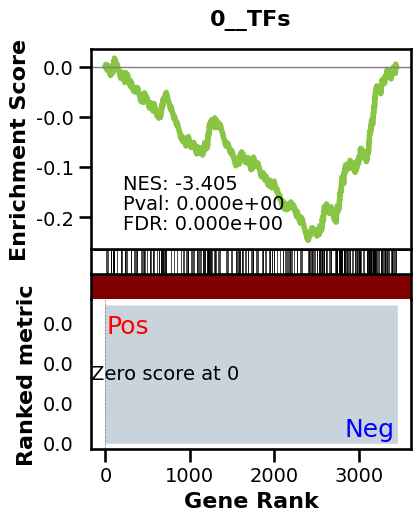

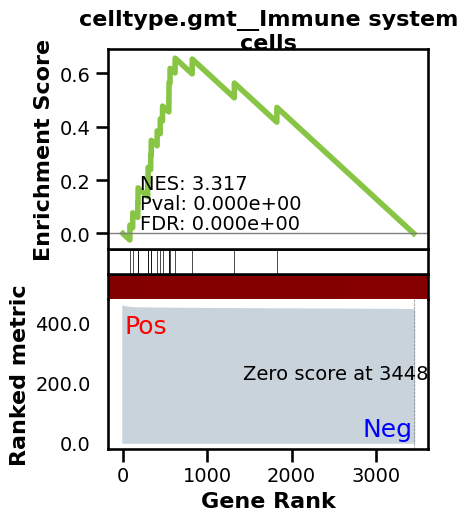

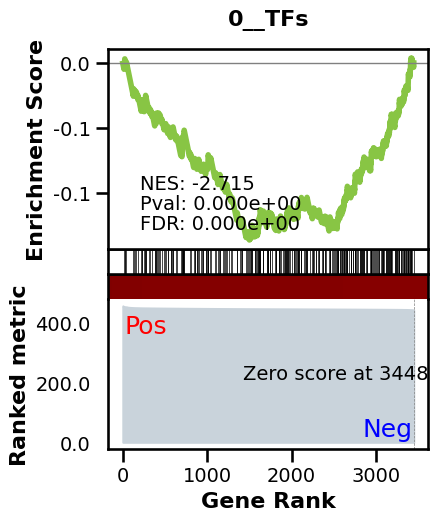

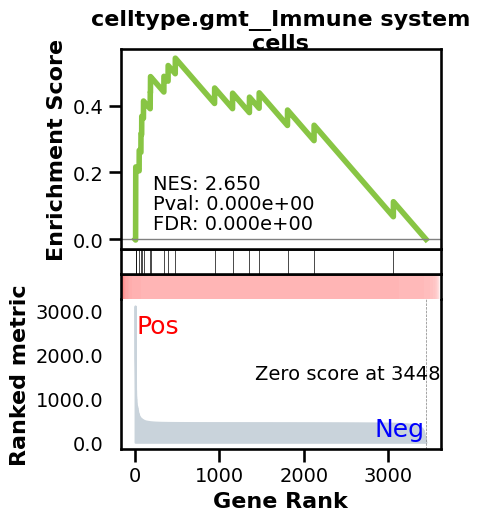

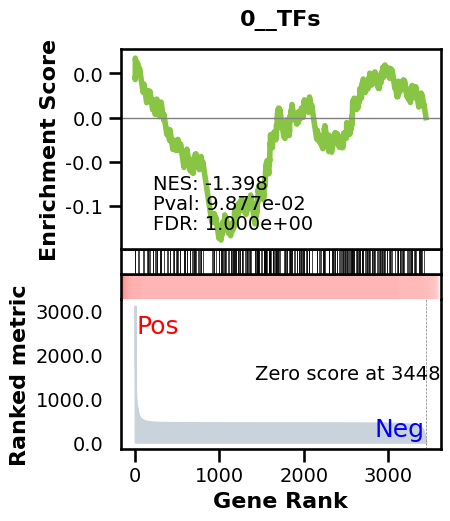

_________________________________________
TF specific enrichment
found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2423 genes
intersection pct: 0.7025224702812409
precision:  0.0014369105809319104 
recall:  1.0 
random precision: 0.0014375038553253588


 97%|█████████▋| 96/99 [00:01<00:00, 95.89it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 90.51it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002577608925255337
EPR: 6.363321009134406


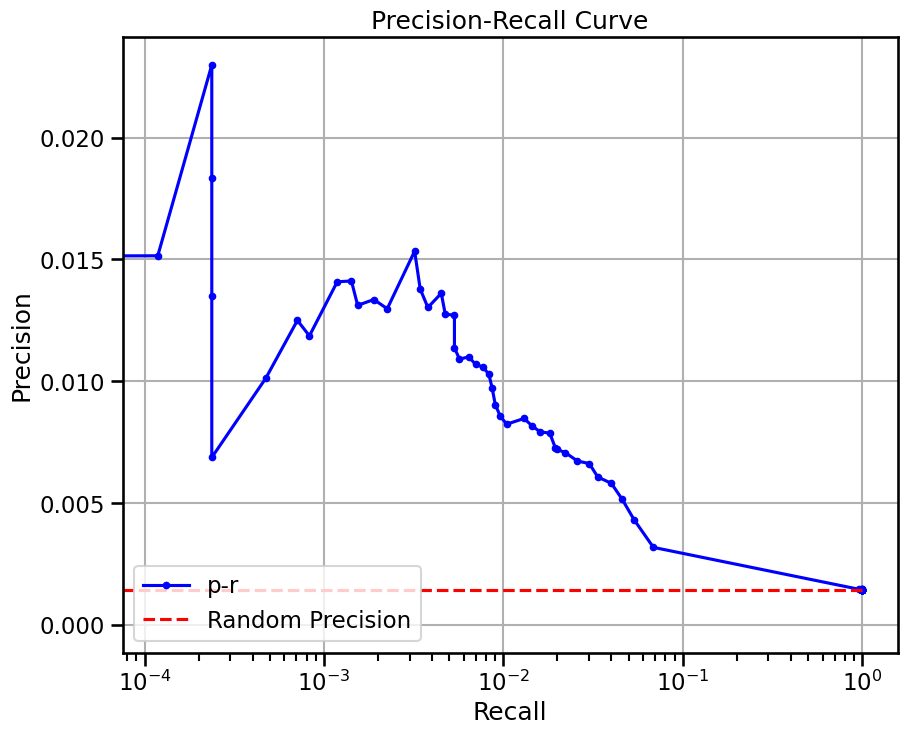

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  8.035714285714286 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:25<00:00,  3.82it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.83it/s]


Area Under Precision-Recall Curve (AUPRC):  0.001016737665065732
EPR: 2.293827019487015


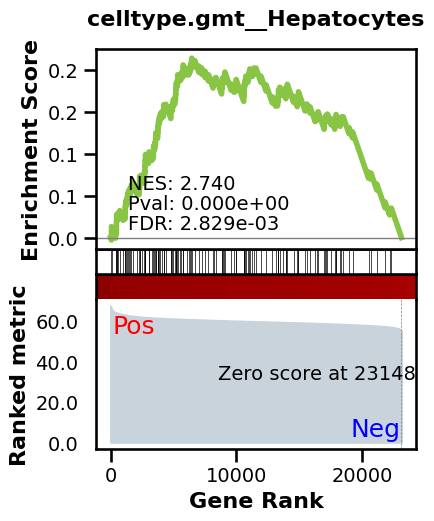

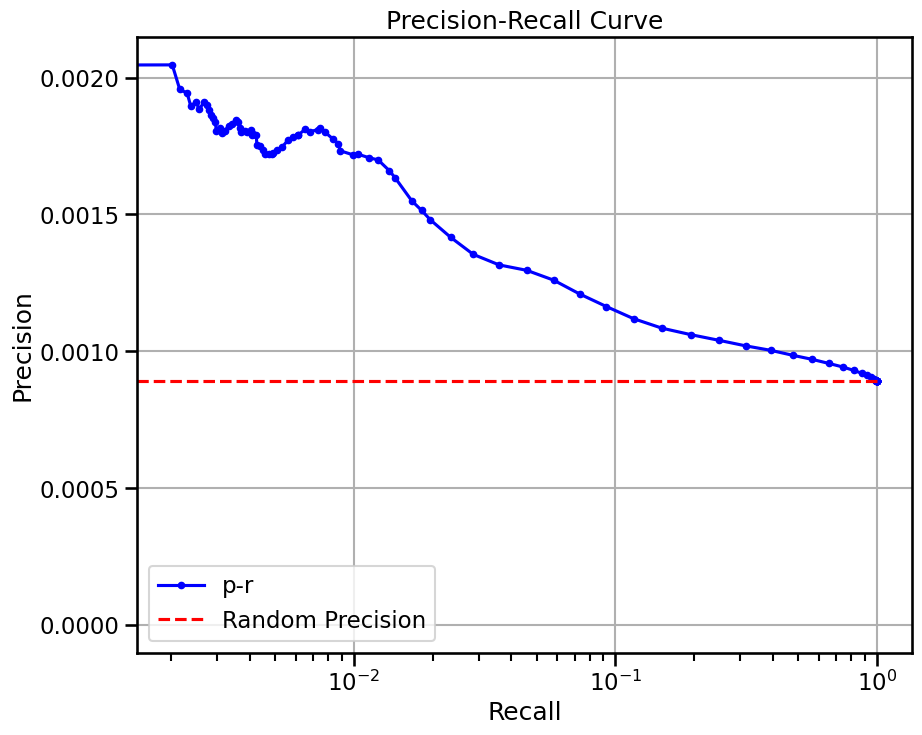

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 6175 ...
doing regression....
metrics {'used_heads': 64, 'precision': 0.0075307173999207295, 'random_precision': 0.0013660239086822374, 'recall': 0.006052883083784644, 'predicted_true': 2523.0, 'number_of_true': 3139.0, 'epr': 4.950122321466409}


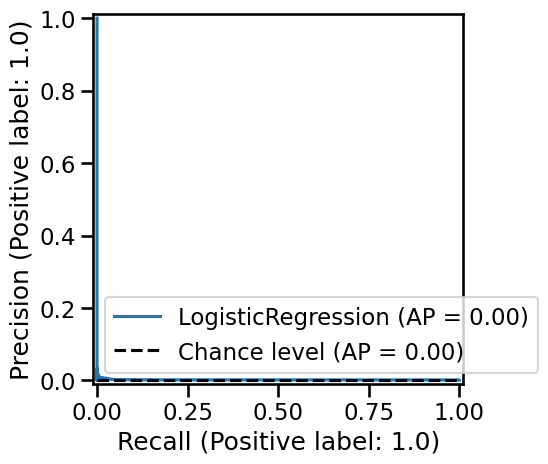

base enrichment
Top central genes: []


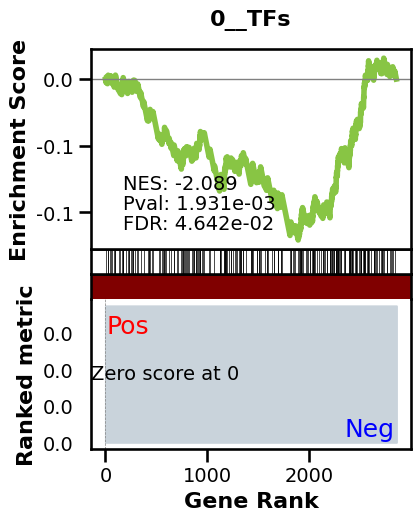

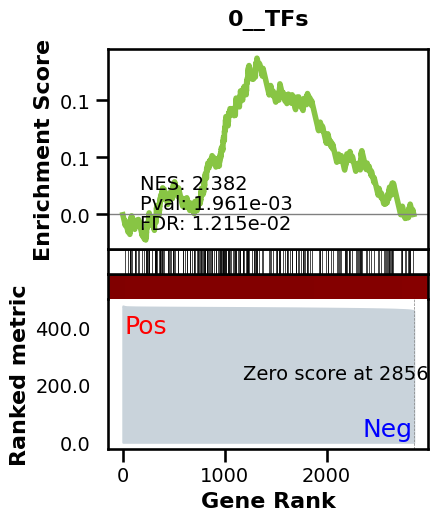

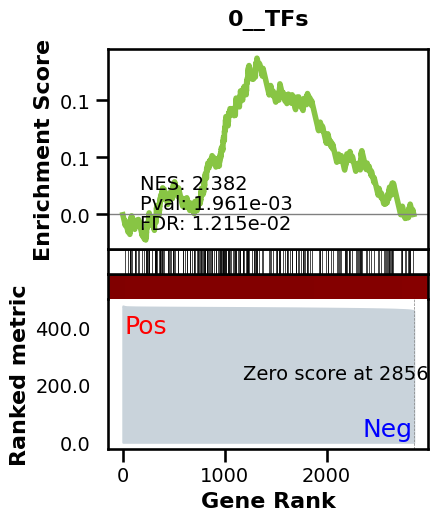

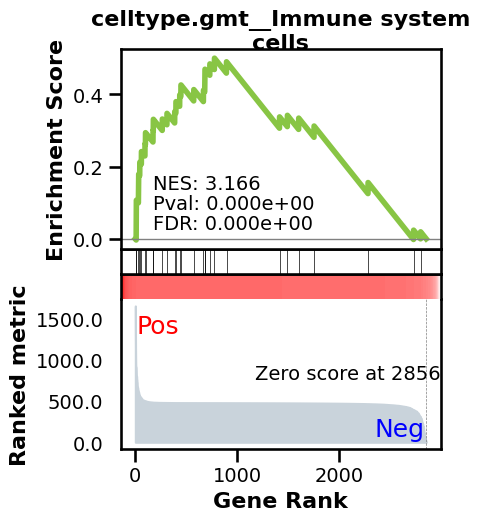

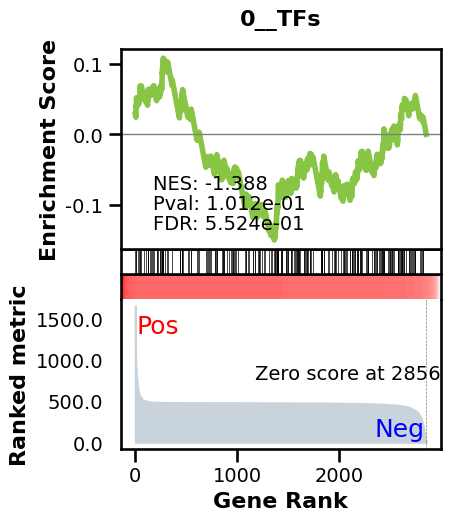

_________________________________________
TF specific enrichment
found some significant results for  13.636363636363637 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 1957 genes
intersection pct: 0.6849842492124606
precision:  0.0016123351077287904 
recall:  1.0 
random precision: 0.0016131594099311056


 91%|█████████ | 90/99 [00:00<00:00, 150.67it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 144.11it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0025237198039881506
EPR: 4.672400516219495


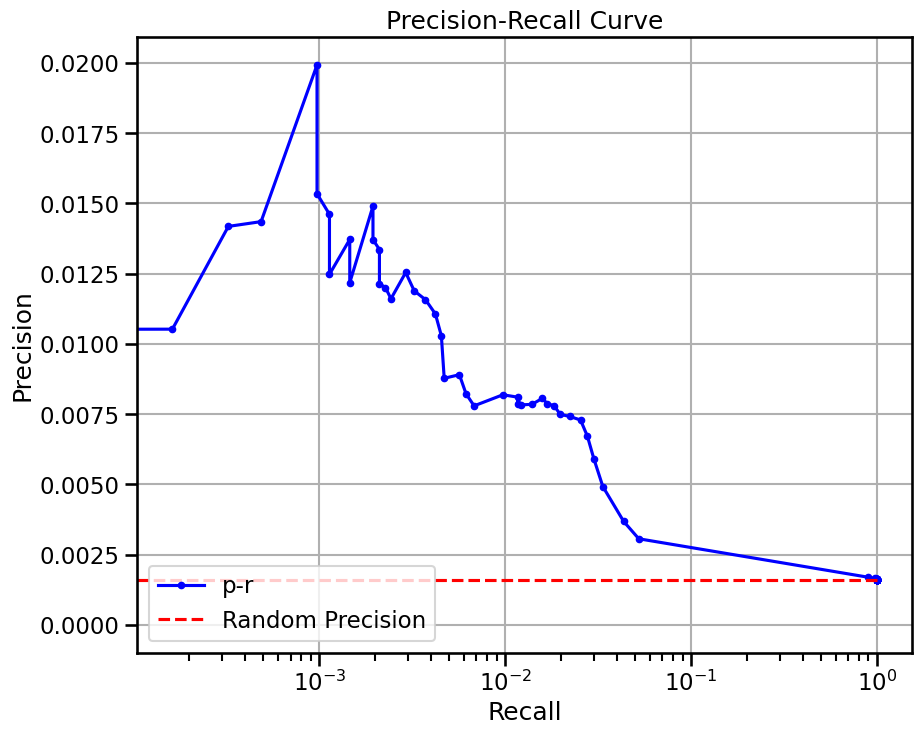

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  15.178571428571429 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:24<00:00,  3.89it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.89it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010366827514114922
EPR: 2.507014131643197


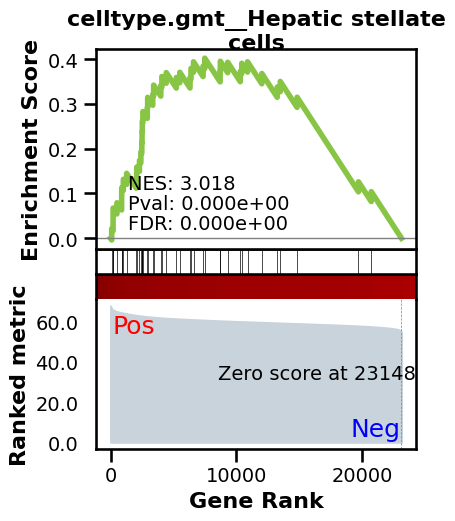

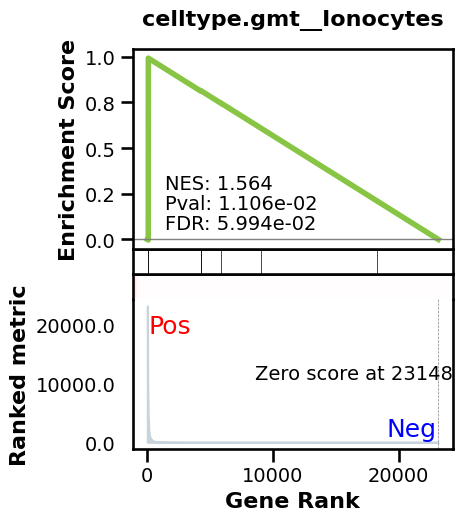

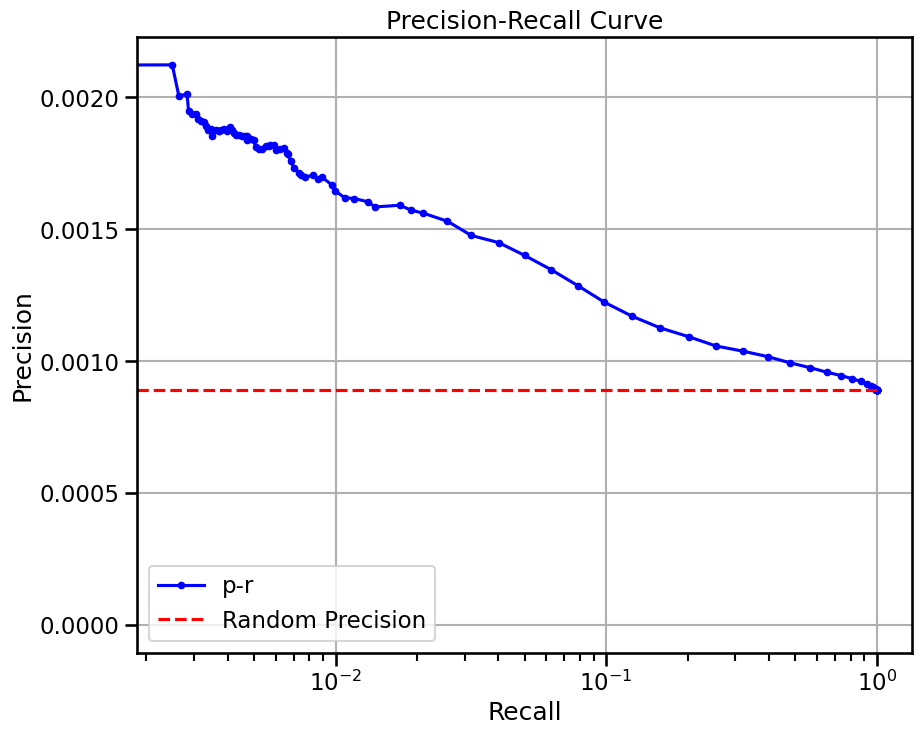

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 8431 ...
doing regression....
metrics {'used_heads': 70, 'precision': 0.004647785039941903, 'random_precision': 0.0014057155422628647, 'recall': 0.007677543186180422, 'predicted_true': 6885.0, 'number_of_true': 4168.0, 'epr': 4.655483846663037}


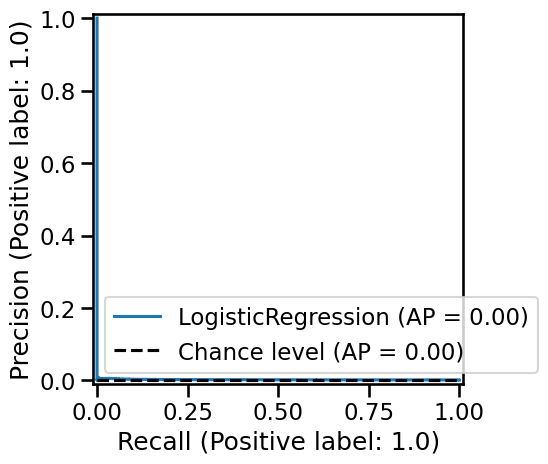

base enrichment
Top central genes: []


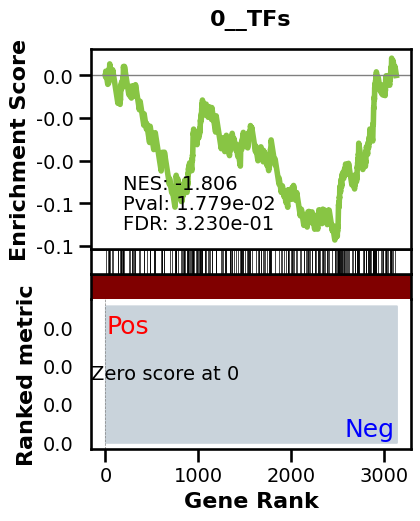

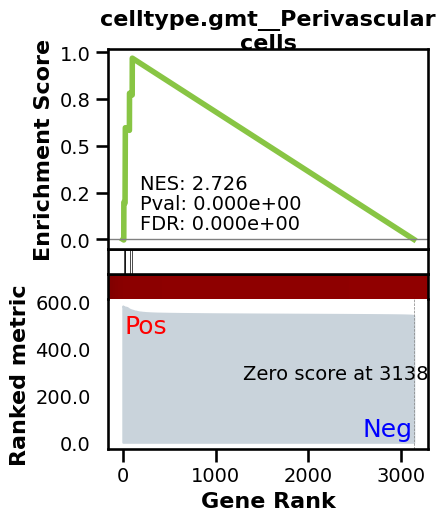

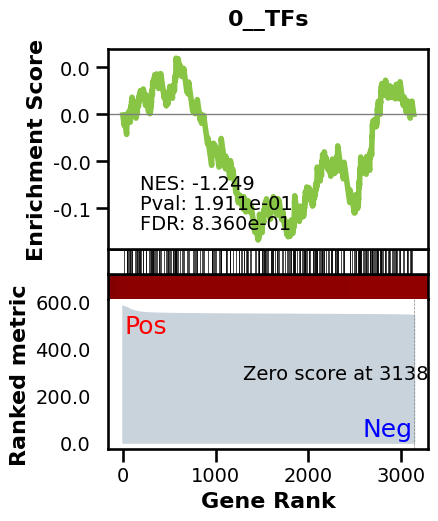

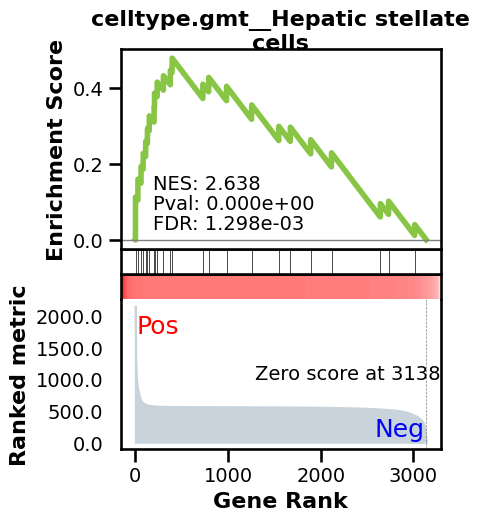

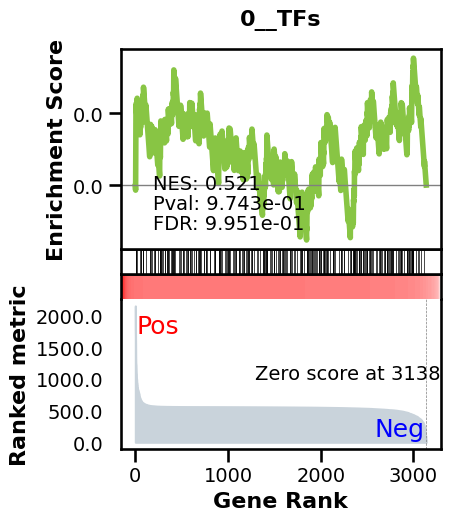

_________________________________________
TF specific enrichment
found some significant results for  34.78260869565217 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2223 genes
intersection pct: 0.7081873208028034
precision:  0.0017060830328818112 
recall:  1.0 
random precision: 0.0017068508470280226


 94%|█████████▍| 93/99 [00:00<00:00, 114.73it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 111.89it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0030082489960618223
EPR: 4.643188305241041


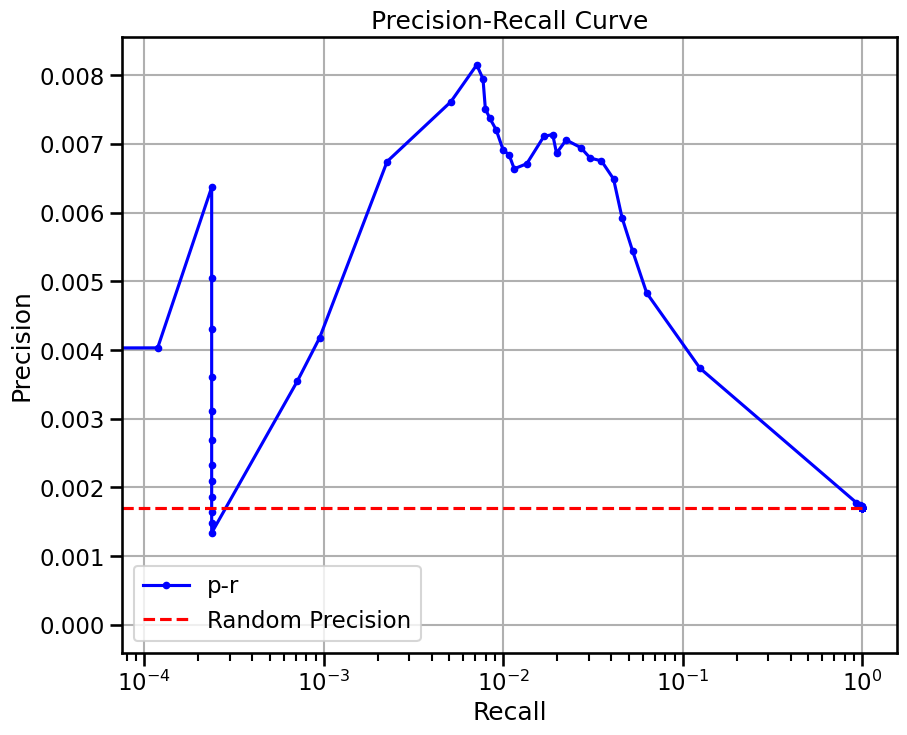

/tmp/ipykernel_1553452/3443399387.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],
/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

avg link count: 536246649, sparsity: 1.0
base enrichment
too many genes for central computation
_________________________________________
TF specific enrichment
found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 12455 genes
intersection pct: 0.5380362002678302
precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398


 98%|█████████▊| 97/99 [00:25<00:00,  3.88it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:25<00:00,  3.87it/s]


Area Under Precision-Recall Curve (AUPRC):  0.0010139653519160808
EPR: 2.310220316411238


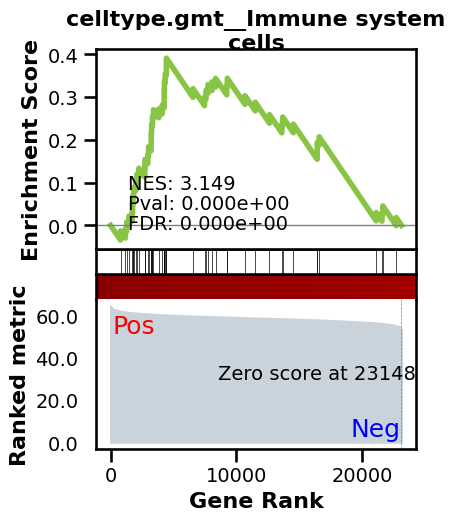

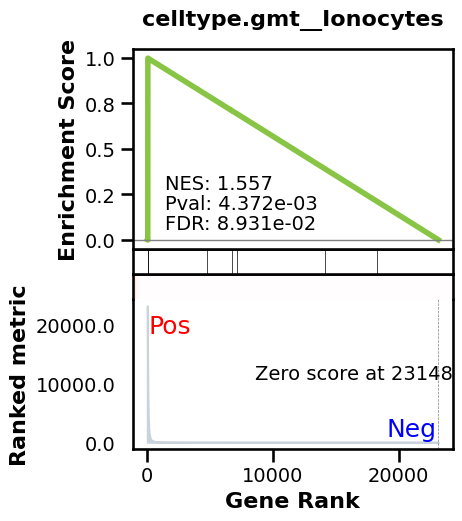

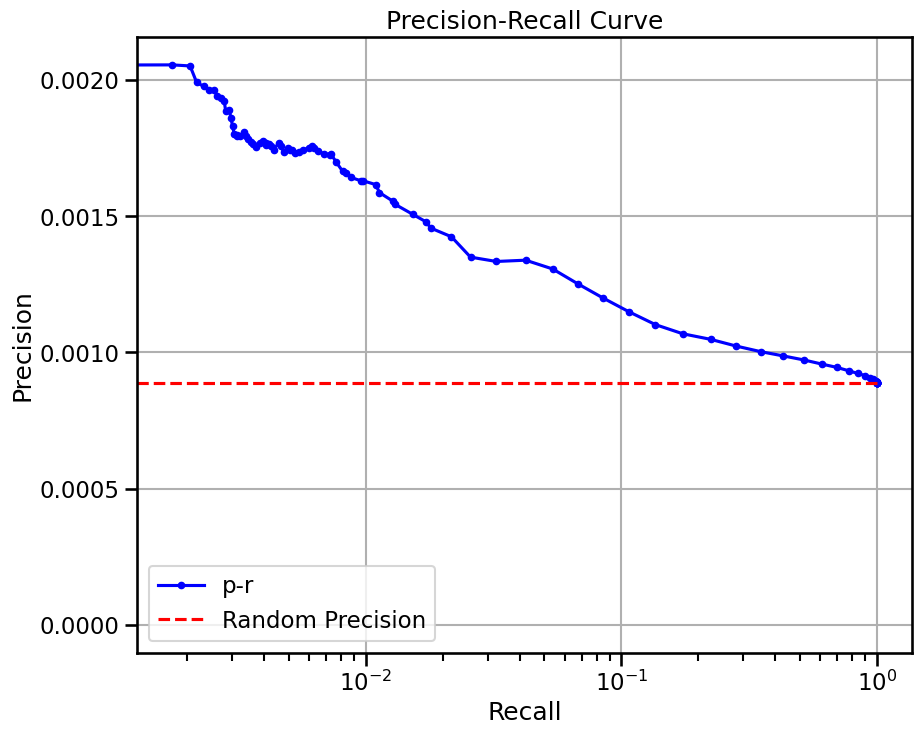

/tmp/ipykernel_1553452/3443399387.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=adata.obs['organism_ontology_term_id'][0],


/home/ml4ig1/Documents code/scPRINT/scprint/tasks/grn.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  organisms=[subadata.obs['organism_ontology_term_id'][0]],


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/Documents code/benGRN/bengrn/base.py:270: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros((len(genes), len(genes)), dtype=np.float)


true elem 4209 ...
doing regression....
metrics {'used_heads': 54, 'precision': 0.009666080843585237, 'random_precision': 0.0017982995764449638, 'recall': 0.004216174779609045, 'predicted_true': 1138.0, 'number_of_true': 2609.0, 'epr': 4.532567682491298}


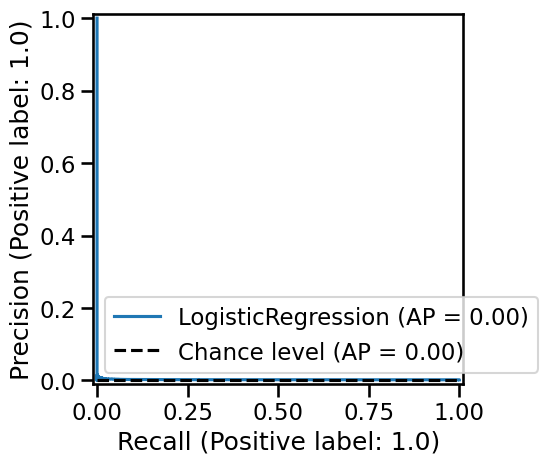

base enrichment
Top central genes: []


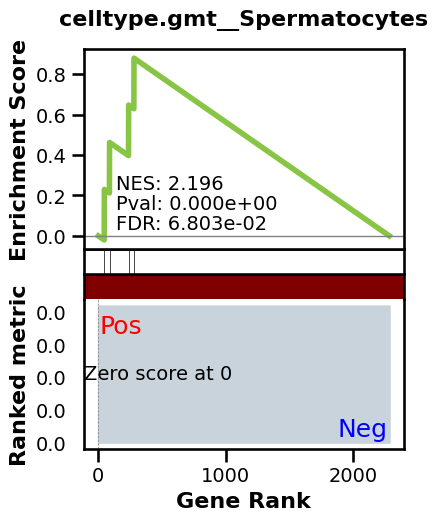

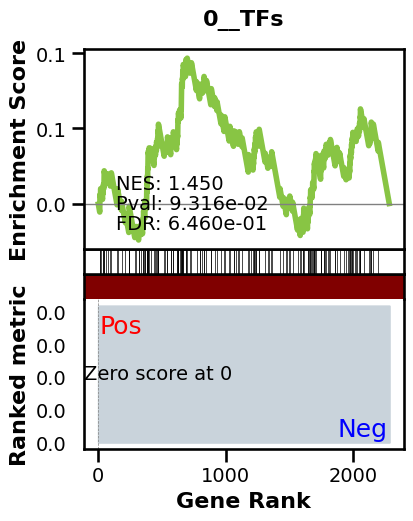

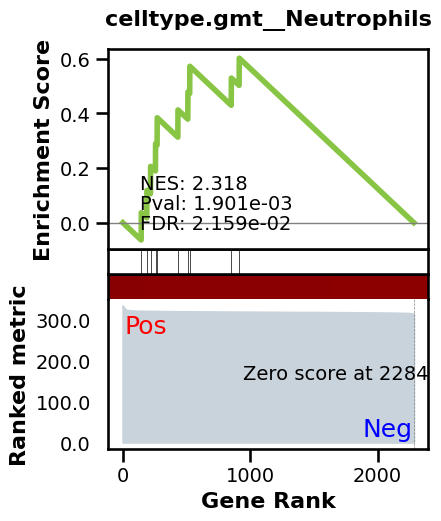

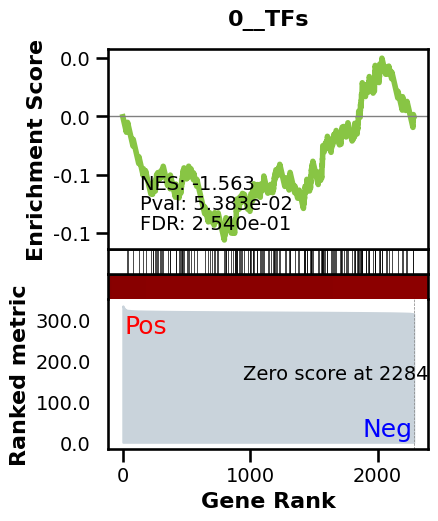

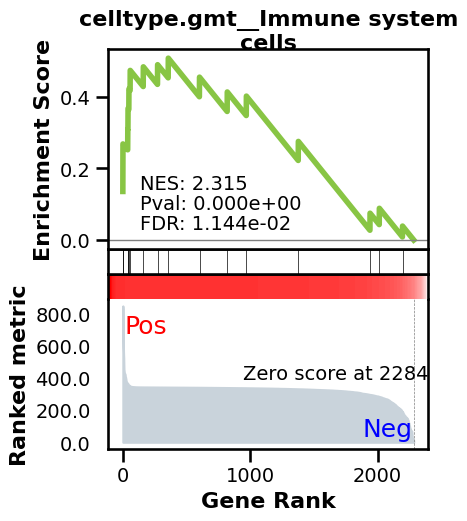

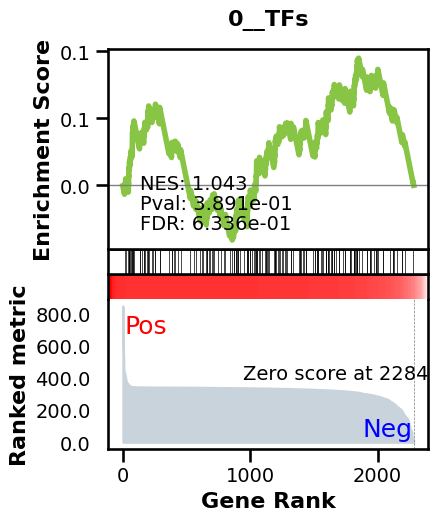

_________________________________________
TF specific enrichment
found some significant results for  12.5 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 1555 genes
intersection pct: 0.6805251641137856
precision:  0.0017406767920100082 
recall:  1.0 
random precision: 0.0017417969186457932


 96%|█████████▌| 95/99 [00:00<00:00, 241.59it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:681: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:00<00:00, 229.82it/s]


Area Under Precision-Recall Curve (AUPRC):  0.002683951377638341
EPR: 4.697188081322385


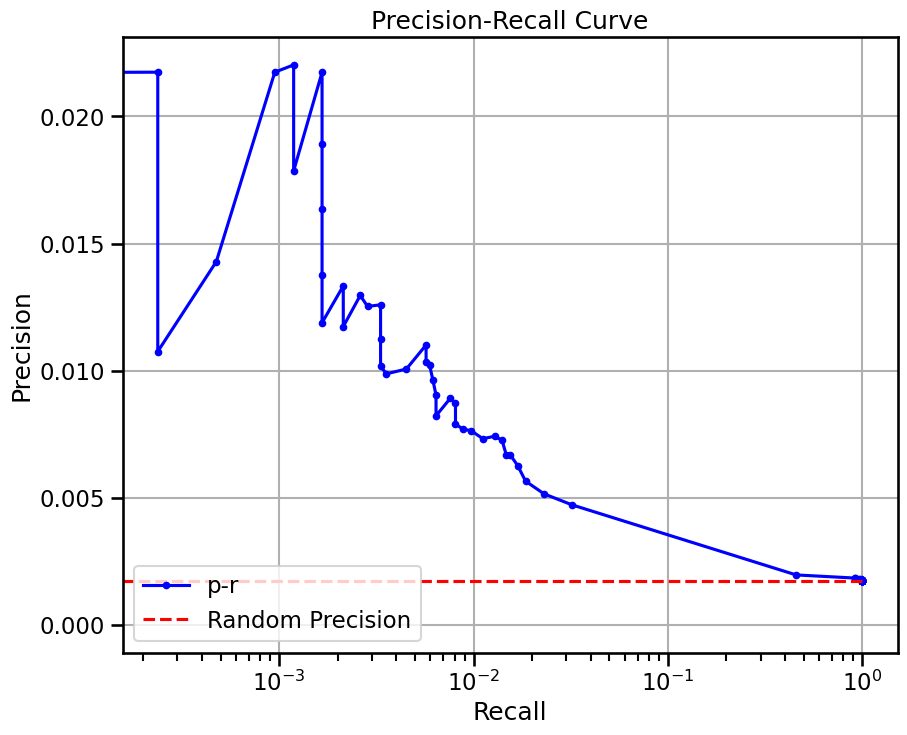

In [11]:
metrics = {}
for celltype in CELLTYPES:
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                         how="random expr",
                         preprocess="softmax",
                         head_agg='max',
                         filtration="none",
                         forward_mode="none",
                         organisms=adata.obs['organism_ontology_term_id'][0],
                         num_genes=3000,
                         max_cells=1024,
                         doplot=False,
                         batch_size=32,
                         )
    grn = grn_inferer(layer=list(range(model.nlayers))[8:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    metrics[celltype+'_scprint'] = BenGRN(grn).scprint_benchmark()
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                         how="most var across",
                         preprocess="softmax",
                         head_agg='none',
                         filtration="none",
                         forward_mode="none",
                         organisms=adata.obs['organism_ontology_term_id'][0],
                         num_genes=NUM_GENES,
                         max_cells=1024,
                         doplot=False,
                         batch_size=32,
                         )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn, m, clf_omni = train_classifier(grn, C=0.3, train_size=0.5, class_weight={
                                        1: 100, 0: 1}, shuffle=False)
    grn.varp['GRN'] = grn.varp['classified']
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    metrics[celltype+'_scprint_class'] = BenGRN(grn).scprint_benchmark()

### we have 50% of the omnipath coming from protein interaction type stuff. the model doesn't get necessarily a ton better without it.

### we have 75% less sources in the transcript only dataset and similar amount of targets.

### in the end we get that most transcript level ground truth doesn't overlap the ppi level one. so dropping it would help in the results but on both side. and it should not help too much with EPR


In [12]:
metrics

{'kidney distal convoluted tubule epithelial cell_scprint': {'enriched_terms_Targets': ['celltype.gmt__Distal tubule cells',
   'celltype.gmt__Memory CD8+ T cells',
   'celltype.gmt__Naive CD8+ T cells',
   'celltype.gmt__Memory CD4+ T cells',
   'celltype.gmt__Naive CD4+ T cells',
   'celltype.gmt__Effector CD8+ T cells',
   'celltype.gmt__-T cells',
   'celltype.gmt__Kupffer cells',
   'celltype.gmt__Acinar cells',
   'celltype.gmt__Effector CD4+ T cells',
   'celltype.gmt__Basophils',
   'celltype.gmt__CD8+ NKT-like cells',
   'celltype.gmt__Plasma B cells',
   'celltype.gmt__Memory B cells',
   'celltype.gmt__Myofibroblasts',
   'celltype.gmt__Pre-B cells',
   'celltype.gmt__Immune system cells',
   'celltype.gmt__Atrial cardiomyocytes',
   'celltype.gmt__CD4+ NKT-like cells',
   'celltype.gmt__Naive B cells',
   'celltype.gmt__Non-classical monocytes',
   'celltype.gmt__-intercalated cells (Collecting duct system)',
   'celltype.gmt__Paneth cells',
   'celltype.gmt__Microfold cell

In [ ]:
0,000999, 4.7 2nd axis-> cls
0.00327, 9.1 1st axis -> cls


base enrichment
Top central genes: []


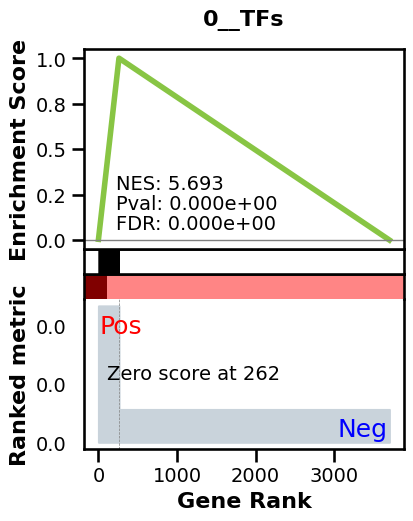

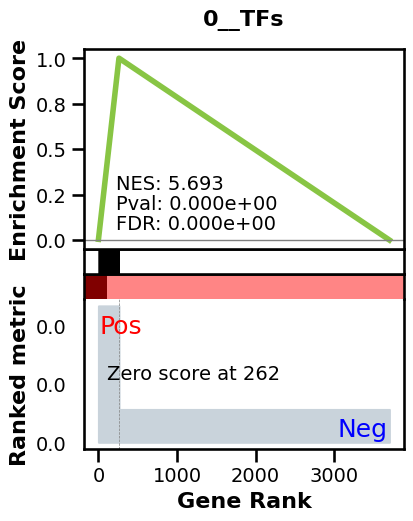

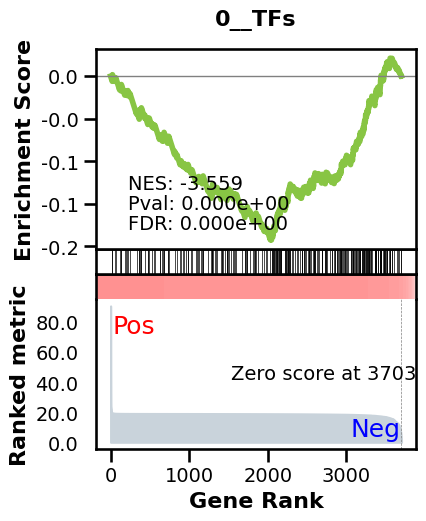

_________________________________________
TF specific enrichment


2024-05-22 14:12:27,003:INFO - Downloading and generating Enrichr library gene sets...
2024-05-22 14:12:27,005:INFO - Library is already downloaded in: /home/ml4ig1/.cache/gseapy/Enrichr.ENCODE_TF_ChIP-seq_2014.gmt, use local file
2024-05-22 14:12:27,208:INFO - 0332 gene_sets have been filtered out when max_size=2000 and min_size=0


found some significant results for  22.22222222222222 % TFs

_________________________________________
loading GT,  omnipath


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:109: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  da = np.zeros(adj.shape, dtype=np.float)


intersection of 2600 genes
intersection pct: 0.7019438444924406
precision:  0.0035054443273621356 
recall:  0.3556664290805417 
random precision: 0.0008304969366916269


/home/ml4ig1/Documents code/benGRN/bengrn/base.py:677: RuntimeWarning: divide by zero encountered in log10
  thresholds = np.logspace(np.log10(grn.min()), np.log10(grn.max()), 50)
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
 46%|████▋     | 46/99 [00:00<00:00, 77.15it/s]/home/ml4ig1/Documents code/benGRN/bengrn/base.py:683: RuntimeWarning: invalid value encountered in long_scalars
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 99/99 [00:01<00:00, 55.06it/s]


Area Under Precision-Recall Curve (AUPRC):  0.00421468580538505
EPR: 11.570272852849582


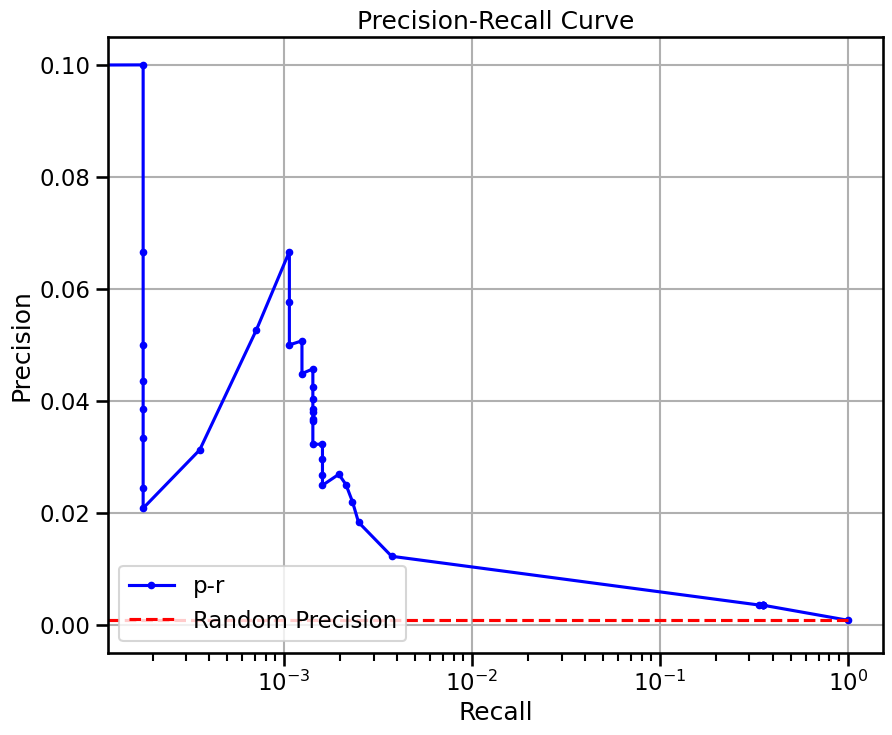

{'enriched_terms_Central': ['0__TFs',
  'celltype.gmt__Embryonic stem cells',
  'celltype.gmt__Melanocytes',
  'celltype.gmt__Enteric neurons',
  'celltype.gmt__Microfold cells',
  'celltype.gmt__Hepatoblasts'],
 'TF_enr': True,
 'significant_enriched_TFtargets': 22.22222222222222,
 'precision': 0.0035054443273621356,
 'recall': 0.3556664290805417,
 'rand_precision': 0.0008304969366916269,
 'auprc': 0.00421468580538505,
 'EPR': 11.570272852849582}

In [42]:
grn.varp['GRN'][~grn.var.index.isin(grnutils.TF),:] = 0
BenGRN(grn).scprint_benchmark()